<center>
<h1 style="font-family:verdana">
 💻 🧑 Classificació d'intencions 🧑 💻


<p> 🎯 <b>Objectiu</b>: en aquesta pràctica aprendrem a detectar la intenció de l'usuari a partir d'interaccions reals amb un xatbot. En el context de xatbots, la classificació d'intencions ajuda a entendre quina acció o resposta hauria de prendre el sistema en funció de la consulta de l'usuari.  


<p> ✨ <b>Contingut</b>: en primer lloc, farem servir una base de dades amb oracions d'interaccions en anglès etiquetades com 22 intencions diferents. En segon lloc, realitzarem el preprocessament de les dades, és a dir, transformarem les dades perquè tinguen un format adequat per a ser introduïdes al model. I finalment, dissenyarem i entrenarem el model de classificació per detectar automàticament la intenció de les oracions.</p>  


<p> ✏ <b>Exercicis</b>: en cada secció anireu trobant exercicis que haureu d'anar resolent. </p>



---

<h2> Índex </h2>

1. [Inspecció del conjunt de dades](#section-one)
  * [Exercici 1](#ex-one)
2. [Preprocessament de dades](#section-two)
  * [Exercici 2](#ex-two)
  * [Exercici 3](#ex-three)
3. [Disseny del model i entrenament](#section-three)
  * [Exercici 4](#ex-four)
  * [Exercici 5](#ex-five)
4. [Lliurable](#section-four)
---

In [1]:
import random
import pandas as pd
import numpy as np
import tensorflow as tf
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, GlobalMaxPooling1D, GlobalMaxPooling3D, Dropout, Conv1D, GlobalAveragePooling1D, LayerNormalization, BatchNormalization#Remove
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import string
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_class_weight
import seaborn as sns
from collections import Counter

from sklearn.metrics import f1_score, accuracy_score, classification_report

import tensorflow as tf  # Importar tensorflow para acceder a F1Score
from tensorflow.keras.layers import MaxPooling1D, AveragePooling1D, LSTM, GRU, Dense
from tensorflow.keras.callbacks import EarlyStopping

nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('stopwords')
nltk.download('punkt_tab')
nltk.download('averaged_perceptron_tagger_eng')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger_eng.zip.


True

In [2]:
!pip install gdown
!gdown "https://drive.google.com/uc?id=1u2wzXvsuscLeFHwXcDwMDaNDy0u_99-t"
!tar -zxf nlu_ATIS_data.tar.gz

Downloading...
From: https://drive.google.com/uc?id=1u2wzXvsuscLeFHwXcDwMDaNDy0u_99-t
To: /content/nlu_ATIS_data.tar.gz
100% 122k/122k [00:00<00:00, 49.9MB/s]


<h1><a name="section-one"> 1. Inspecció del conjunt de dades </a></h1>

A la carpeta `data` tenim els diferents fitxers CSV que utilitzarem per a aquesta pràctica.

En primer lloc, llegirem les dades dels fitxers CSV amb `pandas`.

In [3]:
train_data = pd.read_csv('./data/train.csv', header=None)
val_data = train_data.tail(900)
train_data = pd.read_csv('./data/train.csv', header=None, nrows=4078)
test_data = pd.read_csv('./data/test.csv', header=None)

print('Training size:', len(train_data))
print('Validation dataset size:', len(val_data))
print('Test dataset size:', len(test_data))

Training size: 4078
Validation dataset size: 900
Test dataset size: 893


Per a aquesta primera part de la pràctica ens centrarem en la primera columna dels arxius que correspon amb les **oracions** en anglès introduïdes per l'usuari. I en la tercera columna que correspon amb la **intenció** de cada oració, és a dir, cada oració tindrà una etiqueta.

Podeu executar la cel·la següent tantes vegades com vulgueu per veure instàncies d'aquest conjunt de dades.


In [4]:
random_number = random.randint(0, len(train_data)-1)

train_sentences = list(train_data[0])
train_labels = list(s.replace('"', '') for s in train_data[2])
train_labels = list(s.replace(' ', '') for s in train_labels)

print('Sentence: ', train_sentences[random_number])
print('Intent: ', train_labels[random_number])

Sentence:  now i need a flight from detroit to san diego leaving tuesday evening
Intent:  flight


A continuació analitzarem quantes etiquetes diferents hi ha al dataset i quines són.

In [5]:
num_labels = 0
for label in set(train_labels):
  print(f'Label {num_labels}:', label.split('.')[-1])
  num_labels += 1

print(f'\nThere are a total of {num_labels} intent labels')

Label 0: abbreviation
Label 1: flight_time
Label 2: distance
Label 3: flight+airfare
Label 4: aircraft
Label 5: restriction
Label 6: ground_fare
Label 7: flight_no
Label 8: quantity
Label 9: ground_service
Label 10: cheapest
Label 11: meal
Label 12: capacity
Label 13: flight
Label 14: ground_service+ground_fare
Label 15: airline
Label 16: airfare
Label 17: aircraft+flight+flight_no
Label 18: city
Label 19: airline+flight_no
Label 20: airfare+flight_time
Label 21: airport

There are a total of 22 intent labels


<h1><a name="section-two"> 2. Preprocessament de dades </a></h1>

En primer lloc, haurem de tokenitzar les oracions. Això consisteix a convertir el text en representacions numèriques, ja que els models esperen unitats discretes.

En aquesta pràctica farem servir una tokenització senzilla, simplement dividirem les oracions en paraules i crearem un vocabulari basat en les paraules úniques de les dades d'entrenament. Cada paraula (token) tindrà assignat un ID únic.

Vegem com queda el vocabulari.

In [6]:
num_words=500
tokenizer = Tokenizer(num_words)
tokenizer.fit_on_texts(train_sentences)

vocab = tokenizer.word_index
print(vocab)

{'to': 1, 'from': 2, 'flights': 3, 'the': 4, 'on': 5, 'what': 6, 'me': 7, 'flight': 8, 'boston': 9, 'show': 10, 'san': 11, 'i': 12, 'denver': 13, 'a': 14, 'francisco': 15, 'in': 16, 'and': 17, 'atlanta': 18, 'pittsburgh': 19, 'is': 20, 'dallas': 21, 'baltimore': 22, 'all': 23, 'philadelphia': 24, 'like': 25, 'are': 26, 'list': 27, 'airlines': 28, 'of': 29, 'between': 30, 'that': 31, 'washington': 32, 'leaving': 33, 'please': 34, 'pm': 35, 'morning': 36, 'would': 37, 'fly': 38, 'for': 39, 'fare': 40, 'first': 41, 'wednesday': 42, 'after': 43, 'there': 44, 'oakland': 45, "'d": 46, 'ground': 47, 'you': 48, 'does': 49, 'trip': 50, 'transportation': 51, 'class': 52, 'arriving': 53, 'cheapest': 54, 'need': 55, 'city': 56, 'round': 57, 'with': 58, 'before': 59, 'which': 60, 'available': 61, 'have': 62, 'give': 63, 'at': 64, 'fares': 65, 'american': 66, 'afternoon': 67, 'one': 68, 'want': 69, 'how': 70, 'way': 71, 'new': 72, 'dc': 73, 'nonstop': 74, 'arrive': 75, 'earliest': 76, 'york': 77, 'g

In [7]:
print(len(vocab))

830


---

 <h1><a name="ex-one"><center> ✏ Exercici 1 ✏</a></h1>

En aquest primer exercici us demanem que donat el vocabulari anterior convertiu la llista d'oracions de la partició d'entrenament, és a dir, `train_sentenes` en seqüències d'IDs.

Podeu trobar la documentació [aquí](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/text/Tokenizer).

In [8]:
#TODO
train_sequences = tokenizer.texts_to_sequences(train_sentences)
print(train_sentences[0])
print(train_sequences[0])

i want to fly from boston at 838 am and arrive in denver at 1110 in the morning
[12, 69, 1, 38, 2, 9, 64, 415, 84, 17, 75, 16, 13, 64, 493, 16, 4, 36]


Si ho heu fet correctament hauríeu d'obtenir això:

```
print(train_sentences[0])
print(train_sequences[0])

i want to fly from boston at 838 am and arrive in denver at 1110 in the morning
[12, 69, 1, 38, 2, 9, 64, 415, 84, 17, 75, 16, 13, 64, 493, 16, 4, 36]
```



---
A continuació haurem d'aconseguir que totes les seqüències tinguen una longitud fixa. Per a fer això primer fixarem la longitud segons la longitud màxima trobada a les seqüències del conjunt d'entrenament. I a continuació omplirem (*pad*) les seqüències que tinguen una longitud menor.


In [9]:
max_sequence_length = max(map(len, train_sequences))
train_pad_sequences = pad_sequences(train_sequences, maxlen=max_sequence_length)
print('Padded sequence: ', train_pad_sequences[0])

Padded sequence:  [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0  12  69   1  38   2   9  64 415  84
  17  75  16  13  64 493  16   4  36]


---

 <h1><a name="ex-two"><center> ✏ Exercici 2 ✏</a></h1>

Com l'ordre de les paraules sí que importa als models que utilitzarem en aquesta pràctica, és aconsellable que el *padding* estiga al final i no al principi. Busqueu [aquí](https://www.tensorflow.org/api_docs/python/tf/keras/utils/pad_sequences) com fer perquè el codi anterior afegisca els zeros al final i no al principi de la seqüència.

In [10]:
#TODO
train_pad_sequences = pad_sequences(train_sequences, maxlen=max_sequence_length, padding = 'post')
print('Padded sequence: ', train_pad_sequences[0])

Padded sequence:  [ 12  69   1  38   2   9  64 415  84  17  75  16  13  64 493  16   4  36
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0]


---

A continuació convertirem les classes d'intencions categòriques (*capacity*, *ground_service*, *flight*, etc.) en el que anomenem one-hot vector encoding. Aquesta tècnica s'utilitza per representar les dades categòriques com a vectors binaris. On cada vector representa una classe específica i l'element corresponent a la classe es posa a 1 i la resta d'elements es mantenen a 0.

Imaginem que tenim tres classes: *capacity*, *ground_service*, *flight*. Podríem codificar aquestes classes amb un vector únic de la forma següent:


```
   capacity -> [1, 0, 0]
   ground_service -> [0, 1, 0]
   flight -> [0, 0, 1]
```

Per aconseguir això primer codificarem les classes d'intenció en etiquetes numèriques.

In [11]:
label_encoder = LabelEncoder()
train_numerical_labels = label_encoder.fit_transform(train_labels)

print(f'Original labels: {train_labels}\n')
print(f'Encoded labels: {train_numerical_labels} \n')

Original labels: ['flight', 'flight', 'flight_time', 'airfare', 'airfare', 'flight', 'aircraft', 'flight', 'flight', 'ground_service', 'flight', 'flight', 'airport', 'flight', 'flight', 'airfare', 'ground_service', 'flight', 'flight', 'flight', 'flight', 'flight', 'flight', 'aircraft', 'airfare', 'flight', 'airline', 'flight', 'ground_service', 'flight', 'airfare', 'flight', 'flight', 'flight', 'flight', 'airfare', 'airline', 'flight', 'flight', 'flight', 'distance', 'flight', 'airline', 'airline', 'flight', 'airline', 'ground_service', 'abbreviation', 'flight', 'flight', 'flight_time', 'flight', 'flight', 'ground_fare', 'flight', 'abbreviation', 'flight', 'flight', 'flight', 'flight', 'flight', 'airline', 'flight', 'ground_service', 'airline', 'flight', 'flight', 'airport', 'flight', 'flight', 'abbreviation', 'flight', 'flight', 'flight', 'flight', 'aircraft', 'airfare', 'flight', 'flight', 'flight', 'flight', 'flight', 'flight', 'flight', 'airline', 'flight', 'flight', 'flight', 'fli

I a continuació convertim les etiquetes a vectors one-hot.

In [12]:
num_classes = len(np.unique(train_numerical_labels))
train_encoded_labels = to_categorical(train_numerical_labels, num_classes)

print('Example: \n')
print(f'Original label: {train_labels[0]}\n')
print(f'Numerical label: {train_numerical_labels[0]}\n')
print(f'One-hot: {train_encoded_labels[0]}\n')

Example: 

Original label: flight

Numerical label: 12

One-hot: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]



---

 <h1><a name="ex-three"><center> ✏ Exercici 3 ✏</a></h1>

Amb la partició de validació i test haurem de realitzar els mateixos passos. Per tant, en aquest exercici us demanem que obtingueu `val_pad_sequences`, `val_encoded_labels`, `test_pad_sequences` i `test_encoded_labels`.

In [13]:
#TODO
val_sentences = list(val_data[0])
val_sequences = tokenizer.texts_to_sequences(val_sentences)
val_pad_sequences = pad_sequences(val_sequences, maxlen=max_sequence_length, padding = 'post')

test_sentences = list(test_data[0])
test_sequences = tokenizer.texts_to_sequences(test_sentences)
test_pad_sequences = pad_sequences(test_sequences, maxlen=max_sequence_length, padding = 'post')


In [14]:
val_labels = list(s.replace('"', '') for s in val_data[2])
val_labels = list(s.replace(' ', '') for s in val_labels)

test_labels = list(s.replace('"', '') for s in test_data[2])
test_labels = list(s.replace(' ', '') for s in test_labels)

In [15]:
v_set = set()
for l in val_labels:
  if l not in train_labels:
    v_set.add(l)
print(v_set)

set()


In [16]:
te_set = set()
for l in test_labels:
  if l not in train_labels:
    te_set.add(l)
print(te_set)

{'airfare+flight', 'day_name', 'flight+airline', 'flight_no+airline'}


In [17]:
val_labels = list(s.replace('"', '') for s in val_data[2])
val_labels = list(s.replace(' ', '') for s in val_labels)

test_labels = list(s.replace('"', '') for s in test_data[2])
test_labels = list(s.replace(' ', '') for s in test_labels)

def remove_values_and_indices(input_list, values_to_remove, other_list1, other_list2):
    indices_to_remove = [idx for idx, item in enumerate(input_list) if item in values_to_remove]
    cleaned_list = [item for item in input_list if item not in values_to_remove]
    cleaned_other_list1 = [item for idx, item in enumerate(other_list1) if idx not in indices_to_remove]
    cleaned_other_list2 = [item for idx, item in enumerate(other_list2) if idx not in indices_to_remove]
    return cleaned_list, np.array(cleaned_other_list1), np.array(cleaned_other_list2)

values_to_remove = ['day_name','airfare+flight','flight+airline','flight_no+airline']
val_labels, val_pad_sequences, val_sentences = remove_values_and_indices(val_labels, values_to_remove, val_pad_sequences, val_sentences)
test_labels, test_pad_sequences, test_sentences = remove_values_and_indices(test_labels, values_to_remove, test_pad_sequences, test_sentences)


In [18]:
val_encoded_labels = to_categorical(label_encoder.transform(val_labels), num_classes)
test_encoded_labels = to_categorical(label_encoder.transform(test_labels), num_classes)

In [19]:
def labels(data):
  labels = set()
  for l in data:
    labels.add(l)
  return labels

diff_train_labels = labels(train_labels)
diff_val_labels = labels(val_labels)
diff_test_labels = labels(test_labels)

print('train labels length: ', len(diff_train_labels), 'labels: ', diff_train_labels)
print('val labels length: ', len(diff_val_labels), 'labels: ',diff_val_labels)
print('test labels length: ', len(diff_test_labels), 'labels: ',diff_test_labels)


train labels length:  22 labels:  {'abbreviation', 'flight_time', 'distance', 'flight+airfare', 'aircraft', 'restriction', 'ground_fare', 'flight_no', 'quantity', 'ground_service', 'cheapest', 'meal', 'capacity', 'flight', 'ground_service+ground_fare', 'airline', 'airfare', 'aircraft+flight+flight_no', 'city', 'airline+flight_no', 'airfare+flight_time', 'airport'}
val labels length:  17 labels:  {'city', 'abbreviation', 'flight_time', 'flight', 'distance', 'flight+airfare', 'ground_fare', 'airline', 'airport', 'meal', 'flight_no', 'airfare', 'quantity', 'aircraft', 'ground_service', 'capacity', 'restriction'}
test labels length:  16 labels:  {'city', 'abbreviation', 'flight', 'flight_time', 'distance', 'flight+airfare', 'ground_fare', 'airline', 'airport', 'capacity', 'flight_no', 'airfare', 'quantity', 'aircraft', 'ground_service', 'meal'}


---

<h1><a name="section-three"> 3. Disseny del model i entrenament </a></h1>

En primer lloc, anem a comprovar si hi ha GPUs disponibles. A continuació si hi ha GPUs disponibles el codi assegurarà que *TensorFlow* només assigne memòria GPU quan siga necessari.

In [20]:
if tf.config.list_physical_devices('GPU'):
    print("GPU is available!")
else:
    print("GPU is not available. The model will be trained on CPU.")

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

GPU is not available. The model will be trained on CPU.


---

 <h1><a name="ex-four"><center> ✏ Exercici 4 ✏</a></h1>

*En* aquest exercici haureu de dissenyar l'arquitectura del model. El nostre model tindrà quatre capes:

1. La primera capa serà un **embedding**. Aquesta capa permetrà convertir les dades de text d'entrada, en vectors densos amb una mida fixa (*embedding_dim*). Aquesta representació més compacta permetrà per una part capturar la informació semàntica del text d'entrada, permetent així generalitzar millor i comprendre les relacions entre les paraules. I, per una altra banda, reduir la complexitat computacional, accelerant així el temps d'entrenament i inferència. En resum, aquesta capa assignarà a cada índex de cada paraula un vector dens de mida *embedding_dim*.

2. La segona capa serà un **pooling** layer. L'entrada d'aquesta capa serà un tensor 3D (*batch_size*, *sequence_length*, *embedding_dim*). Aquesta capa es centrarà a capturar la informació més important de la seqüència d'entrada, és a dir, prendrà el valor màxim de la seqüència, donant lloc a un tensor 2D (batch_size, embedding_dim).

3. La tercera capa serà una capa **densa**. És a dir, una capa completament connectada (*fully-connected*): cada neurona d'aquesta capa estarà connectada a totes les neurones de la capa anterior. La funció d'activació que utilitzarem serà una ReLU. Aquesta funció introdueix una no-linealitat al model permetent així aprendre relacions complexes en les dades.

4. L'última capa també serà una capa **densa**. En aquest cas la funció d'activació haurà de ser la funció Softmax. Aquesta funció es fa servir per a convertir els valors de la capa anterior (*logits*) en probabilitats normalitzades. El valor de cada element de sortida representarà la probabilitat que l'entrada pertanya a una classe específica.


📢  Les capes que haureu de fer servir les podreu trobar [aquí](https://www.tensorflow.org/api_docs/python/tf/keras/layers).





In [21]:
#TODO
embedding_dim = 100
vocab_size = num_words + 1

model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length)) #layer 1
model.add(GlobalMaxPooling1D()) #layer 2
model.add(Dense(128, activation='relu')) #layer 3
model.add(Dense(num_labels, activation='softmax')) #layer 4

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
batch_size = 32
epochs = 2
model.fit(train_pad_sequences, train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(val_pad_sequences, val_encoded_labels))

# Evaluate the model on the test set
loss, accuracy = model.evaluate(test_pad_sequences, test_encoded_labels, batch_size=batch_size)
print(f"Test accuracy: {accuracy:.2f}")


Epoch 1/2


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7084 - loss: 1.7665 - val_accuracy: 0.7356 - val_loss: 0.8869
Epoch 2/2
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8005 - loss: 0.7730 - val_accuracy: 0.8533 - val_loss: 0.6228
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.8471 - loss: 0.6965
Test accuracy: 0.82


Podeu veure a continuació les oracions que el model ha classificat incorrectament.

In [22]:

probs = model.predict(test_pad_sequences)
_predicted_labels = np.argmax(probs, axis=1)
predicted_labels = label_encoder.inverse_transform(_predicted_labels)

for i in range(0, len(predicted_labels)):
  if test_labels[i] != predicted_labels[i]:
    print('Sentence: ', test_sentences[i])
    print('Original label: ', test_labels[i])
    print('Predicted label: ', predicted_labels[i])
    print()


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Sentence:  on april first i need a ticket from tacoma to san jose departing before 7 am
Original label:  airfare
Predicted label:  flight

Sentence:  show flight and prices kansas city to chicago on next wednesday arriving in chicago by 7 pm
Original label:  flight+airfare
Predicted label:  flight

Sentence:  does tacoma airport offer transportation from the airport to the downtown area
Original label:  ground_service
Predicted label:  flight

Sentence:  what meals are served on american flight 811 from tampa to milwaukee
Original label:  meal
Predicted label:  flight

Sentence:  what meals are served on american flight 665 673 from milwaukee to seattle
Original label:  meal
Predicted label:  flight

Sentence:  i would like to know what airports are in los angeles
Original label:  airport
Predicted label:  flight

Sentence:  what airlines fly between detroit and westchester county
Original label:  airline
Predicted label:  flight

Sentence:  what 

In [23]:
for i,s in enumerate(test_data[0]):
  for j,t in enumerate(test_sentences):
    if s == t and test_labels[j] not in test_data[2][i]:
      print(s,test_data[2][i],test_labels[j])


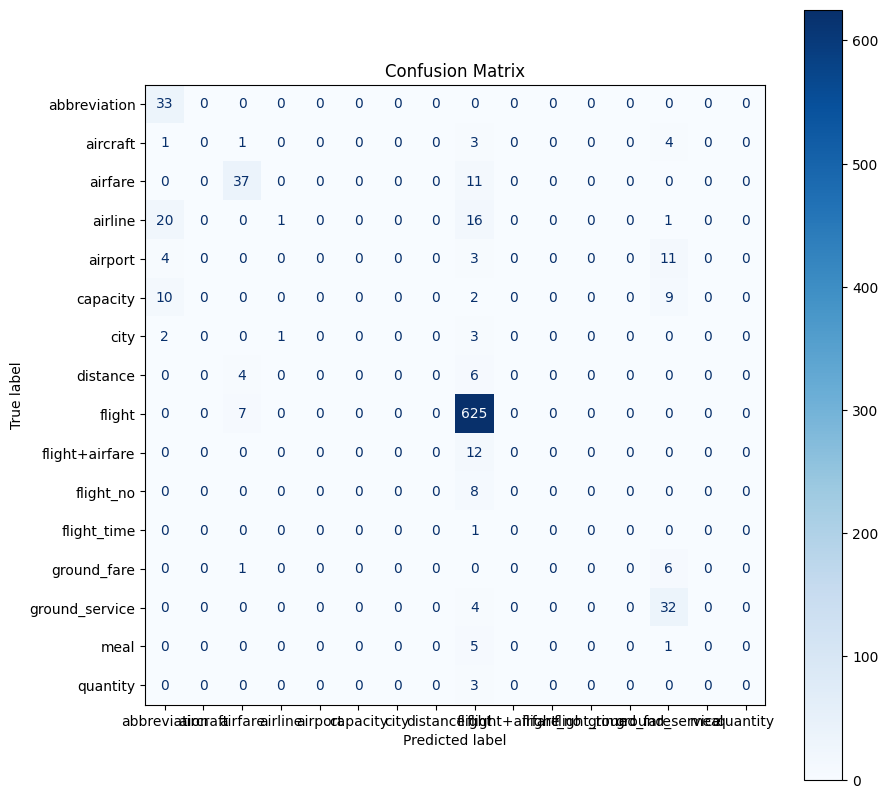

In [24]:

test_classes = sorted(set(test_labels))
# Generar la matriu de confusió
cm = confusion_matrix(test_labels, predicted_labels, labels=test_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_classes)

# Mostrar la matriu de confusió
fig, ax = plt.subplots(figsize=(10, 10))  # Ajusta el tamany del gràfic
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix")
plt.show()


In [25]:
# Mostrar l'informe de classificació
print(classification_report(test_labels, predicted_labels))


                precision    recall  f1-score   support

  abbreviation       0.47      1.00      0.64        33
      aircraft       0.00      0.00      0.00         9
       airfare       0.74      0.77      0.76        48
       airline       0.50      0.03      0.05        38
       airport       0.00      0.00      0.00        18
      capacity       0.00      0.00      0.00        21
          city       0.00      0.00      0.00         6
      distance       0.00      0.00      0.00        10
        flight       0.89      0.99      0.94       632
flight+airfare       0.00      0.00      0.00        12
     flight_no       0.00      0.00      0.00         8
   flight_time       0.00      0.00      0.00         1
   ground_fare       0.00      0.00      0.00         7
ground_service       0.50      0.89      0.64        36
          meal       0.00      0.00      0.00         6
      quantity       0.00      0.00      0.00         3

      accuracy                           0.82 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


---

 <h1><a name="ex-five"><center> ✏ Exercici 5 ✏ </a></h1>

Modifiqueu els següents paràmetres del model anterior i analitzeu com afecten a la seva *accuracy*:

 1. **Preprocessament.** Modifiqueu el Tokenizer per canviar la mida del vostre vocabulari i afegiu nous passos de preprocessament. Alguns possibles canvis són canviar la mida del vocabulari, treure la capitalització o fer servir *lemmatització* o *stemming*.

 2. **Mida dels Embeddings.** Proveu diferents mides d'*Embeddings* i observeu com canvia l'*accuracy* del model. Heu d'explicar les vostres conclusions.

 3. **Xarxes Convolucionals.** Afegiu capes convolucionals al vostre model. Expliqueu amb detall els valors que heu provat i la vostra motivació a l'hora d'escollir-los. Recordeu, que també podeu provar diferents configuracions de *pooling*.

 4. **Xarxes Recurrents.**  Afegiu capes recurrents al vostre model (LSTM, GRU). Expliqueu amb detall els valors que heu provat i la vostra motivació.

 5. **Regularització.** Quan proveu configuracions amb més paràmetres veureu que el model comença a tenir *overfitting* molt prompte durant l'entrenament. Afegiu *Dropout* al vostre model. Heu d'explicar la vostra decisió de valors i de posició dins de la xarxa.

 6. **Balancejat de les classes.** Si analitzeu el dataset, veureu que la freqüència de les classes està molt desbalancejada. Keras us permet afegir un pes per a cada classe a l'hora de calcular la loss (Mireu el paràmetre "class_weigth" a la documentació https://keras.io/api/models/model_training_apis/). Calculeu un pes per a cada classe i afegiu-lo al mètode fit del vostre model.

 ---

### Estudi de desbalanceig de classes

<ipython-input-87-140eeaa34fb0>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=counts, palette="viridis")


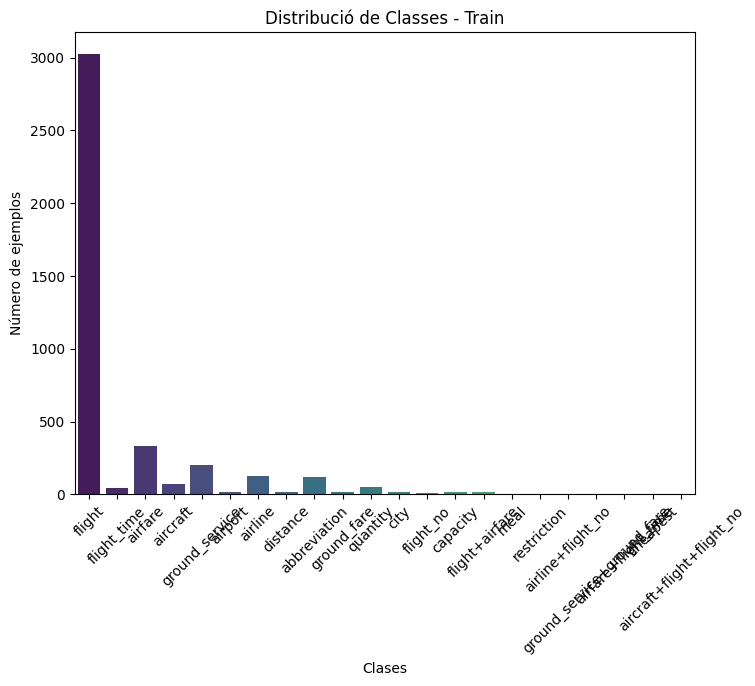

<ipython-input-87-140eeaa34fb0>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=counts, palette="viridis")


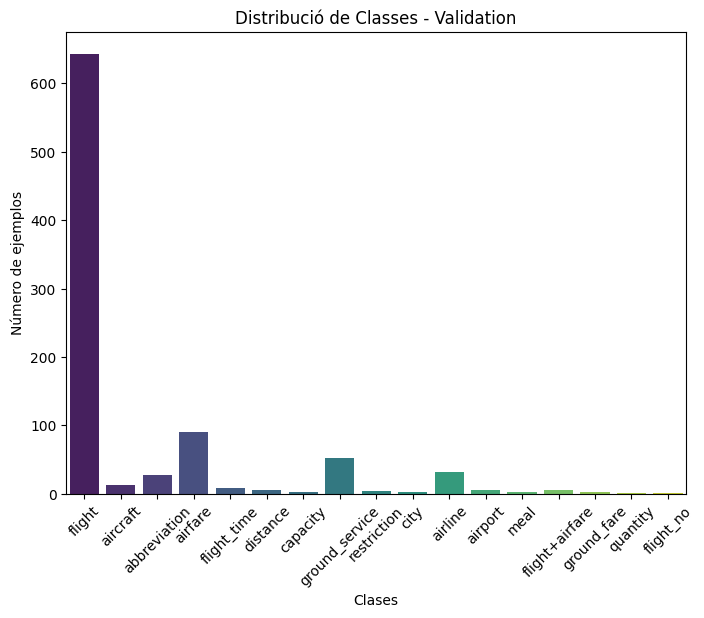

<ipython-input-87-140eeaa34fb0>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=classes, y=counts, palette="viridis")


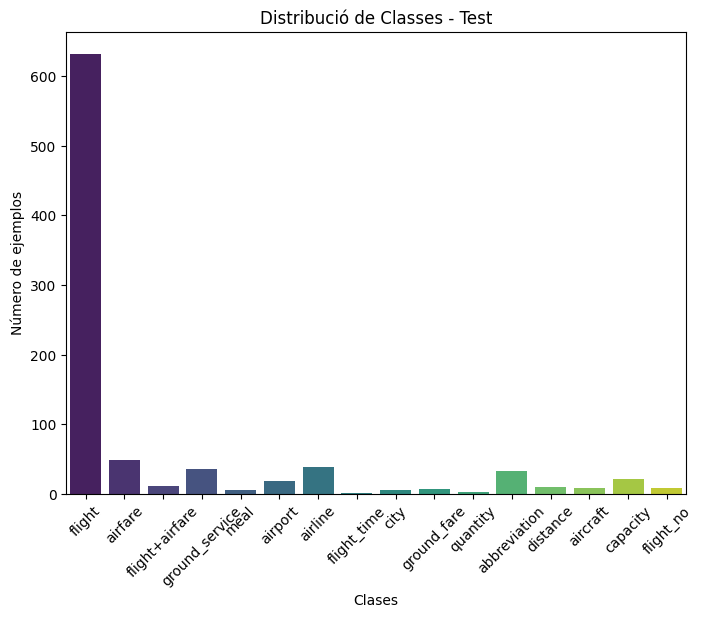

In [87]:
def plot_class_distribution(labels, title):
    class_counts = Counter(labels)
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(8, 6))
    sns.barplot(x=classes, y=counts, palette="viridis")
    plt.xlabel('Clases')
    plt.ylabel('Número de ejemplos')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

plot_class_distribution(train_labels, 'Distribució de Classes - Train')
plot_class_distribution(val_labels, 'Distribució de Classes - Validation')
plot_class_distribution(test_labels, 'Distribució de Classes - Test')


Com que les classes del dataset estan molt desbalancejades, analitzarem principalment els efectes dels canvis en la mètrica macro average de f1-score. Aquesta calcula l’F1-score per a cada classe de manera individual, després fa la mitjana sense considerar la mida de cada classe.
Tracta cada classe per igual, independentment de la seva mida. Això és útil si vols assegurar-te que el model rendeixi bé en totes les classes, incloent-hi les minoritàries. Per tant, canviem el metrics del model.

### Ajustar nombre d'epochs

Abans de fer els canvis demanats, ajustem el nombre d'epochs de la xarxa per assegurar que el model aprèn prou, però sense caure en el sobreajustament.

Training with 2 epochs


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/2
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - f1_score: 0.0379 - loss: 1.7339 - val_f1_score: 0.0607 - val_loss: 0.8745
Epoch 2/2
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.1091 - loss: 0.7025 - val_f1_score: 0.1756 - val_loss: 0.5591
Epochs: 2
Train Loss: 0.6446, Train Macro F1: 0.1407
Validation Loss: 0.5591, Validation Macro F1: 0.1756
Training with 3 epochs
Epoch 1/3
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0396 - loss: 1.8351 - val_f1_score: 0.0623 - val_loss: 0.9067
Epoch 2/3
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1111 - loss: 0.7089 - val_f1_score: 0.1661 - val_loss: 0.5683
Epoch 3/3
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1906 - loss: 0.4366 - val_f1_score: 0.2385 - val_loss: 0.4314
Epochs: 3
Train Loss: 0.4170, Train Macro F1: 0.2111
Validation Loss: 0.4314, Validation Macro F1: 0.2385
Training with 4 epochs
Epoch 1/4
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - f1_score: 0.0365 - loss: 1.8041 - val_f1_score: 0.0

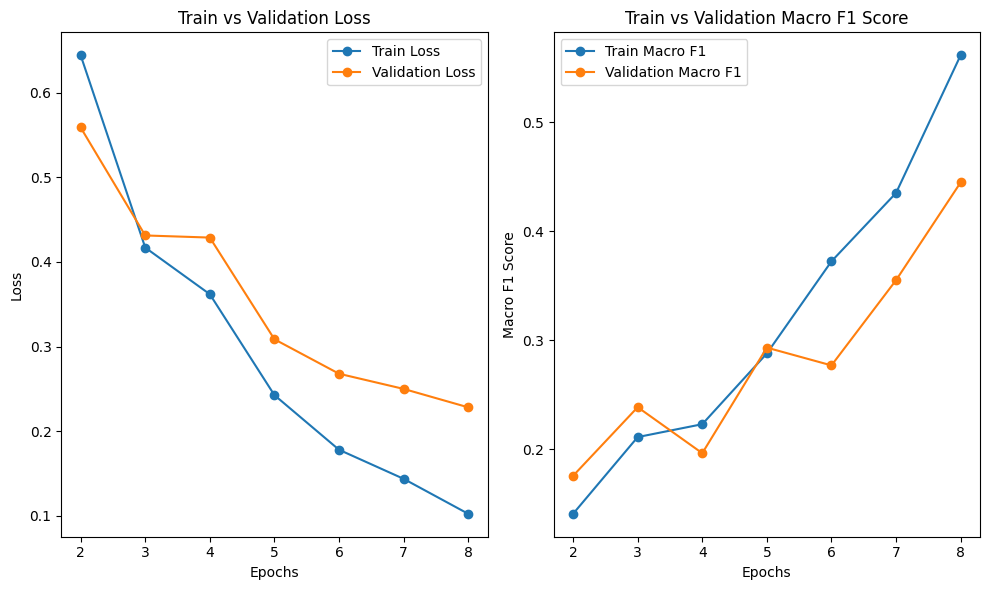

In [88]:
embedding_dim = 100
vocab_size = num_words + 1

# Definir la lista de posibles valores de epochs
epochs_list = [2, 3, 4, 5, 6, 7, 8]

# Guardar los resultados para cada valor de epochs
train_f1_scores = []
val_f1_scores = []
train_losses = []
val_losses = []

for epochs in epochs_list:
    print(f"Training with {epochs} epochs")

    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length)) #layer 1
    model.add(GlobalMaxPooling1D()) #layer 2
    model.add(Dense(128, activation='relu')) #layer 3
    model.add(Dense(num_labels, activation='softmax')) #layer 4

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])

    # Train the model
    history = model.fit(train_pad_sequences, train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(val_pad_sequences, val_encoded_labels),verbose = 1)

    # Guardar el último valor de 'loss' y 'f1_score' de entrenamiento y validación
    train_losses.append(history.history['loss'][-1])
    val_losses.append(history.history['val_loss'][-1])
    train_f1_scores.append(history.history['f1_score'][-1])
    val_f1_scores.append(history.history['val_f1_score'][-1])

    print(f"Epochs: {epochs}")
    print(f"Train Loss: {train_losses[-1]:.4f}, Train Macro F1: {train_f1_scores[-1]:.4f}")
    print(f"Validation Loss: {val_losses[-1]:.4f}, Validation Macro F1: {val_f1_scores[-1]:.4f}")

# Graficar los resultados
plt.figure(figsize=(10, 6))

# Gráfico de Loss
plt.subplot(1, 2, 1)
plt.plot(epochs_list, train_losses, label='Train Loss', marker='o')
plt.plot(epochs_list, val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train vs Validation Loss')
plt.legend()

# Gráfico de Macro F1
plt.subplot(1, 2, 2)
plt.plot(epochs_list, train_f1_scores, label='Train Macro F1', marker='o')
plt.plot(epochs_list, val_f1_scores, label='Validation Macro F1', marker='o')
plt.xlabel('Epochs')
plt.ylabel('Macro F1 Score')
plt.title('Train vs Validation Macro F1 Score')
plt.legend()

plt.tight_layout()
plt.show()


Com que tenim desbalanceig de dades, observem també els valors de macro avg f1-score obtinguts amb diferents nombres d'epochs de les particions train i val. Observem que amb 5 epochs la loss de la validació comença a ser major que el d'entrenament. A més, és també el moment on el macro avg f1-score de l'entrenament comença a superar al de validació. Aleshores, agafen 5 com a nombre d'epochs.

### Balancejat de classes

Tal com ja hem vist en l'estudi, hi ha força desbalanceig de les classes i pot afectar al rendiment del model si no es fa cap tracte. Per tant, primer de tot tractarem el desbalanceig de classes

In [89]:
# Parámetros del modelo
embedding_dim = 100
vocab_size = num_words + 1
batch_size = 32
epochs = 5
n_runs = 5

# Variables para guardar resultados de cada ejecución
f1_macro_avg_scores = []
accuracy_scores = []

for run in range(n_runs):
    print(f"Execution {run + 1}/{n_runs}")

    # Crear el modelo
    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length)) #layer 1
    model.add(GlobalMaxPooling1D()) #layer 2
    model.add(Dense(128, activation='relu')) #layer 3
    model.add(Dense(num_labels, activation='softmax')) #layer 4

    # Compilar el modelo
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])

    # Entrenar el modelo
    history = model.fit(train_pad_sequences, train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(val_pad_sequences, val_encoded_labels), verbose=1)

    # Predicciones en el conjunto de validación
    probs = model.predict(val_pad_sequences)
    _predicted_labels = np.argmax(probs, axis=1)
    predicted_labels = label_encoder.inverse_transform(_predicted_labels)

    # Cálculo del F1-score y accuracy para esta ejecución
    f1_macro_avg = f1_score(val_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(val_labels, predicted_labels)

    # Agregar los resultados a las listas
    f1_macro_avg_scores.append(f1_macro_avg)
    accuracy_scores.append(accuracy)

    print(f"F1 Macro Avg (Run {run + 1}): {f1_macro_avg:.4f}")
    print(f"Accuracy (Run {run + 1}): {accuracy:.4f}")

# Cálculo de media y desviación estándar de F1 Macro Avg y Accuracy
f1_macro_avg_mean = np.mean(f1_macro_avg_scores)
f1_macro_avg_std = np.std(f1_macro_avg_scores)
accuracy_mean = np.mean(accuracy_scores)
accuracy_std = np.std(accuracy_scores)

print("\nFinal Results After 5 Runs:")
print(f"F1 Macro Avg - Mean: {f1_macro_avg_mean:.4f}, Std: {f1_macro_avg_std:.4f}")
print(f"Accuracy - Mean: {accuracy_mean:.4f}, Std: {accuracy_std:.4f}")


Execution 1/5
Epoch 1/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0386 - loss: 1.7726 - val_f1_score: 0.0379 - val_loss: 0.9680
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.0923 - loss: 0.7827 - val_f1_score: 0.1499 - val_loss: 0.6190
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.1720 - loss: 0.4493 - val_f1_score: 0.1713 - val_loss: 0.4749
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2255 - loss: 0.3462 - val_f1_score: 0.2301 - val_loss: 0.3774
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2776 - loss: 0.2516 - val_f1_score: 0.2700 - val_loss: 0.3117
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 1): 0.3494
Accuracy (Run 1): 0.9200
Execution 2/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0369 - loss: 1.8042 - val_f1_score: 0.0528 - val_loss: 0.9412
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.0823 - loss: 0.7707 - val_f1_score: 0.1556 - val_loss: 0.6355
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.1668 - loss: 0.5226 - val_f1_score: 0.1850 - val_loss: 0.4679
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2282 - loss: 0.3708 - val_f1_score: 0.2305 - val_loss: 0.3823
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2563 - loss: 0.2943 - val_f1_score: 0.2549 - val_loss: 0.3199
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 2): 0.3298
Accuracy (Run 2): 0.9200
Execution 3/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0377 - loss: 1.8415 - val_f1_score: 0.0612 - val_loss: 0.8899
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.0972 - loss: 0.7131 - val_f1_score: 0.1524 - val_loss: 0.6000
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1791 - loss: 0.4730 - val_f1_score: 0.1867 - val_loss: 0.4535
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2457 - loss: 0.3596 - val_f1_score: 0.2160 - val_loss: 0.3729
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2694 - loss: 0.2756 - val_f1_score: 0.2765 - val_loss: 0.3124
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 3): 0.3579
Accuracy (Run 3): 0.9211
Execution 4/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0381 - loss: 1.7814 - val_f1_score: 0.0630 - val_loss: 0.8845
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.0951 - loss: 0.7528 - val_f1_score: 0.1609 - val_loss: 0.5884
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1751 - loss: 0.4867 - val_f1_score: 0.1908 - val_loss: 0.4431
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2218 - loss: 0.3600 - val_f1_score: 0.2198 - val_loss: 0.3648
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2587 - loss: 0.2524 - val_f1_score: 0.2571 - val_loss: 0.3156
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
F1 Macro Avg (Run 4): 0.3327
Accuracy (Run 4): 0.9144
Execution 5/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0369 - loss: 1.8426 - val_f1_score: 0.0587 - val_loss: 0.8997
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.0894 - loss: 0.7500 - val_f1_score: 0.1523 - val_loss: 0.6294
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1717 - loss: 0.5218 - val_f1_score: 0.1735 - val_loss: 0.4781
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2320 - loss: 0.3591 - val_f1_score: 0.2429 - val_loss: 0.3869
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2749 - loss: 0.2611 - val_f1_score: 0.2470 - val_loss: 0.3209
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 5): 0.3197
Accuracy (Run 5): 0.9211

Final Results After 5 Runs:
F1 Macro Avg - Mean: 0.3379, Std: 0.0138
Accuracy - Mean: 0.9193, Std: 0.0025


In [90]:
# Parámetros del modelo
embedding_dim = 100
vocab_size = num_words + 1
batch_size = 32
epochs = 5
n_runs = 5

# Variables para guardar resultados de cada ejecución
f1_macro_avg_scores_classweights = []
accuracy_scores_classweights = []

for run in range(n_runs):
    print(f"Execution {run + 1}/{n_runs}")

    # Calcular els pesos de classe
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(train_labels),
        y=train_labels
    )

    class_weight_dict = dict(enumerate(class_weights))

    # Crear el modelo
    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=max_sequence_length)) #layer 1
    model.add(GlobalMaxPooling1D()) #layer 2
    model.add(Dense(128, activation='relu')) #layer 3
    model.add(Dense(num_labels, activation='softmax')) #layer 4

    # Compilar el modelo
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])

    # Entrenar el modelo
    history = model.fit(train_pad_sequences, train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(val_pad_sequences, val_encoded_labels), verbose=1,class_weight=class_weight_dict)

    # Predicciones en el conjunto de validación
    probs = model.predict(val_pad_sequences)
    _predicted_labels = np.argmax(probs, axis=1)
    predicted_labels = label_encoder.inverse_transform(_predicted_labels)

    # Cálculo del F1-score y accuracy para esta ejecución
    f1_macro_avg = f1_score(val_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(val_labels, predicted_labels)

    # Agregar los resultados a las listas
    f1_macro_avg_scores_classweights.append(f1_macro_avg)
    accuracy_scores_classweights.append(accuracy)

    print(f"F1 Macro Avg (Run {run + 1}): {f1_macro_avg:.4f}")
    print(f"Accuracy (Run {run + 1}): {accuracy:.4f}")

# Cálculo de media y desviación estándar de F1 Macro Avg y Accuracy
f1_macro_avg_mean_classweights = np.mean(f1_macro_avg_scores_classweights)
f1_macro_avg_std_classweights = np.std(f1_macro_avg_scores_classweights)
accuracy_mean_classweights = np.mean(accuracy_scores_classweights)
accuracy_std_classweights = np.std(accuracy_scores_classweights)

print("\nFinal Results After 5 Runs:")
print(f"F1 Macro Avg - Mean: {f1_macro_avg_mean_classweights:.4f}, Std: {f1_macro_avg_std_classweights:.4f}")
print(f"Accuracy - Mean: {accuracy_mean_classweights:.4f}, Std: {accuracy_std_classweights:.4f}")


Execution 1/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0371 - loss: 3.2518 - val_f1_score: 0.1056 - val_loss: 2.8545
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1651 - loss: 2.9656 - val_f1_score: 0.2113 - val_loss: 2.5826
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2596 - loss: 2.6036 - val_f1_score: 0.3028 - val_loss: 2.0293
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3618 - loss: 2.0148 - val_f1_score: 0.3667 - val_loss: 1.5150
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4781 - loss: 1.5982 - val_f1_score: 0.4131 - val_loss: 1.0939
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
F1 Macro Avg (Run 1): 0.5347
Accuracy (Run 1): 0.8600
Execution 2/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0487 - loss: 2.8632 - val_f1_score: 0.1074 - val_loss: 2.9134
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1718 - loss: 3.0223 - val_f1_score: 0.2521 - val_loss: 2.6373
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2620 - loss: 2.3285 - val_f1_score: 0.3249 - val_loss: 2.1956
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3921 - loss: 2.4603 - val_f1_score: 0.4498 - val_loss: 1.5893
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4767 - loss: 1.9222 - val_f1_score: 0.4369 - val_loss: 1.1538
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 2): 0.5654
Accuracy (Run 2): 0.8633
Execution 3/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0450 - loss: 3.4848 - val_f1_score: 0.2493 - val_loss: 2.9181
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.2487 - loss: 2.7925 - val_f1_score: 0.2536 - val_loss: 2.6105
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3268 - loss: 2.3810 - val_f1_score: 0.3724 - val_loss: 1.9801
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4728 - loss: 3.1853 - val_f1_score: 0.4820 - val_loss: 1.1920
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4763 - loss: 1.9342 - val_f1_score: 0.4641 - val_loss: 0.9402
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 3): 0.6006
Accuracy (Run 3): 0.8700
Execution 4/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0412 - loss: 3.5711 - val_f1_score: 0.1673 - val_loss: 2.9420
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1802 - loss: 3.1373 - val_f1_score: 0.2159 - val_loss: 2.6687
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2741 - loss: 2.3395 - val_f1_score: 0.3149 - val_loss: 2.1204
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4545 - loss: 2.1651 - val_f1_score: 0.3804 - val_loss: 1.4546
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.5303 - loss: 1.8618 - val_f1_score: 0.4868 - val_loss: 0.7540
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
F1 Macro Avg (Run 4): 0.6300
Accuracy (Run 4): 0.8944
Execution 5/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - f1_score: 0.0450 - loss: 3.1856 - val_f1_score: 0.1538 - val_loss: 2.8867
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.1410 - loss: 3.0802 - val_f1_score: 0.2067 - val_loss: 2.3909
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2730 - loss: 2.9384 - val_f1_score: 0.2956 - val_loss: 1.6559
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3373 - loss: 1.7233 - val_f1_score: 0.3778 - val_loss: 1.2828
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4845 - loss: 1.7873 - val_f1_score: 0.4346 - val_loss: 0.7810
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
F1 Macro Avg (Run 5): 0.5624
Accuracy (Run 5): 0.8844

Final Results After 5 Runs:
F1 Macro Avg - Mean: 0.5786, Std: 0.0331
Accuracy - Mean: 0.8744, Std: 0.0131


In [91]:
print("\nInformació de classificació sense class_weights:")
print(f"F1 Macro Avg - Mean: {f1_macro_avg_mean:.4f}, Std: {f1_macro_avg_std:.4f}")
print(f"Accuracy - Mean: {accuracy_mean:.4f}, Std: {accuracy_std:.4f}")


print("\nInformació de classificació amb class_weights:")
print(f"F1 Macro Avg - Mean: {f1_macro_avg_mean_classweights:.4f}, Std: {f1_macro_avg_std_classweights:.4f}")
print(f"Accuracy - Mean: {accuracy_mean_classweights:.4f}, Std: {accuracy_std_classweights:.4f}")




Informació de classificació sense class_weights:
F1 Macro Avg - Mean: 0.3379, Std: 0.0138
Accuracy - Mean: 0.9193, Std: 0.0025

Informació de classificació amb class_weights:
F1 Macro Avg - Mean: 0.5786, Std: 0.0331
Accuracy - Mean: 0.8744, Std: 0.0131


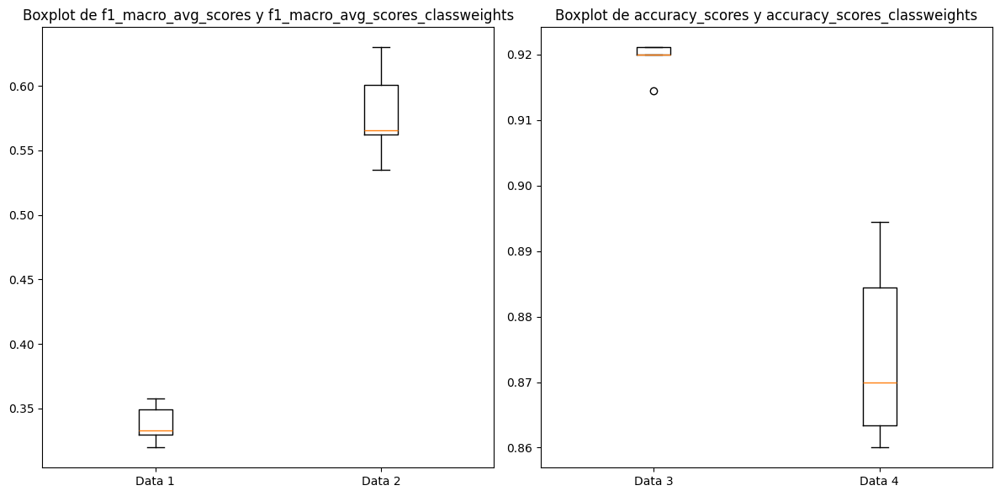

In [92]:
import matplotlib.pyplot as plt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))  # 1 fila, 2 columnas

# Primer boxplot con data1 y data2
ax1.boxplot([f1_macro_avg_scores, f1_macro_avg_scores_classweights], labels=['Data 1', 'Data 2'])
ax1.set_title('Boxplot de f1_macro_avg_scores y f1_macro_avg_scores_classweights')

# Segundo boxplot con data3 y data4
ax2.boxplot([accuracy_scores, accuracy_scores_classweights], labels=['Data 3', 'Data 4'])
ax2.set_title('Boxplot de accuracy_scores y accuracy_scores_classweights')

# Mostrar los gráficos
plt.tight_layout()
plt.show()


### Preprocessament

In [27]:
class TextProcessor:
    # Ens interessa inicialitzar la classe i cridar a process_all perquè es faci tot
    # Variables instància importants: self.train_prep, self.val_prep, self.test_prep
    # self.train_pad_sequences, self.val_pad_sequences, self.test_pad_sequences
    # self.train_encoded_labels, self.val_encoded_labels, self.test_encoded_labels i self.vocab

    def __init__(self, train_sentences, val_sentences, test_sentences, train_labels, val_labels, test_labels, num_words=500, tech = 'lemmatizer'):
        # Input: partició de train, val i test, numero de paraules del vocabulari i si s'utilitza 'lemmatizer' o 'stemming'

        # Inicialitza els conjunts de dades
        self.train_sentences = train_sentences
        self.val_sentences = val_sentences
        self.test_sentences = test_sentences
        self.train_labels = train_labels
        self.val_labels = val_labels
        self.test_labels = test_labels

        self.tech = tech
        if self.tech == 'lemmatizer':
          # Inicialitza el lematitzador
          self.wnl = nltk.stem.WordNetLemmatizer()
        else:
          self.stemmer = PorterStemmer()

        # Obtenir stop words i signes de puntuació
        self.stop_words = set(stopwords.words('english'))
        self.punctuation = set(string.punctuation)

    def lowercase(self, text):
        # Converteix totes les oracions a minúscules
        text_lower = text.copy()
        for i, txt in enumerate(text):
            text_lower[i] = txt.lower()
        return text_lower

    def remove_stopwords_and_punctuation(self, text):
        # Elimina stopwords i signes de puntuació
        cleaned_sentences = []
        for sentence in text:
            tokens = word_tokenize(sentence)
            cleaned_tokens = [token for token in tokens if token not in self.stop_words and token not in self.punctuation]
            cleaned_sentences.append(" ".join(cleaned_tokens))
        return cleaned_sentences

    def lemmatizer(self, text):
        # Input: llista de frases
        # Output: llista de frases amb paraules lematitzades
        syntax = self._get_syntax(text)
        lemmatized_sentences = []

        # Lematitza cada paraula segons les etiquetes POS
        for i, sentence in enumerate(text):
            tokens = word_tokenize(sentence)
            lemmatized_tokens = []
            for j, token in enumerate(tokens):
                if syntax[i][j] != 'NA':
                    lemmatized_tokens.append(self.wnl.lemmatize(token, syntax[i][j]))
                else:
                    lemmatized_tokens.append(self.wnl.lemmatize(token))
            lemmatized_sentences.append(" ".join(lemmatized_tokens))
        return lemmatized_sentences

    def stemming(self, text):
        # Input: llista de frases
        # Output: llista de frases amb paraules aplicades stemming
        stemmed_sentences = []
        for sent in text:
            tokens = word_tokenize(sent)
            stemmed_tokens = [self.stemmer.stem(token) for token in tokens]
            stemmed_sentences.append(" ".join(stemmed_tokens))
        return stemmed_sentences

    # Mètodes auxiliars

    def _find_syntax(self, sentence):
        # Input: llista de tokens
        # Output: llista de pos corresponent a cada token
        pos_map = {'NN': 'n', 'NNS': 'n',
                   'JJ': 'a', 'JJR': 'a', 'JJS': 'a',
                   'VB': 'v', 'VBD': 'v', 'VBG': 'v', 'VBN': 'v', 'VBP': 'v', 'VBZ': 'v',
                   'RB': 'r', 'RBR': 'r', 'RBS': 'r'}
        pairs = nltk.pos_tag(sentence)
        sint = []
        for p in pairs:
            if p[1] in pos_map:
                sint.append(pos_map[p[1]])
            else:
                sint.append('NA')
        return sint

    def _get_syntax(self, text):
        # Input: llista de frases
        # Output: llista de subllistes (frases) de PosTagger de cada paraula
        synt = []
        for sentence in text:
            tokens = word_tokenize(sentence)
            synt.append(self._find_syntax(tokens))
        return synt


    # --------------------- Aplicar tots els passos ----------------------------

    def process_all(self):
        # Convertir tot a minúscules
        train_sentences_lower = self.lowercase(train_sentences)
        val_sentences_lower = self.lowercase(val_sentences)
        test_sentences_lower = self.lowercase(test_sentences)

        # Treure stopwords i signes de puntuació
        train_lower_no_stopwords_and_punctuation = self.remove_stopwords_and_punctuation(train_sentences_lower)
        val_lower_no_stopwords_and_punctuation = self.remove_stopwords_and_punctuation(val_sentences_lower)
        test_lower_no_stopwords_and_punctuation = self.remove_stopwords_and_punctuation(test_sentences_lower)

        if self.tech == 'lemmatizer':
          # Lematitza cada conjunt
          self.train_prep = self.lemmatizer(train_lower_no_stopwords_and_punctuation)
          self.val_prep = self.lemmatizer(val_lower_no_stopwords_and_punctuation)
          self.test_prep = self.lemmatizer(test_lower_no_stopwords_and_punctuation)
        else:
          self.train_prep = self.stemming(train_lower_no_stopwords_and_punctuation)
          self.val_prep = self.stemming(val_lower_no_stopwords_and_punctuation)
          self.test_prep = self.stemming(test_lower_no_stopwords_and_punctuation)

        # Crear vocabulari
        self.num_words = num_words
        self.tokenizer = Tokenizer(num_words=self.num_words)
        self.tokenizer.fit_on_texts(self.train_prep)
        self.vocab = self.tokenizer.word_index

        # Crear els pad sequences i els encoded labels de les tres particions
        self.label_encoder = LabelEncoder()

        self.train_sequences = self.tokenizer.texts_to_sequences(self.train_prep)
        self.max_sequence_length = max(map(len, self.train_sequences))
        self.train_pad_sequences = pad_sequences(self.train_sequences, maxlen=self.max_sequence_length, padding = 'post')
        train_numerical_labels = self.label_encoder.fit_transform(self.train_labels)
        num_classes = len(np.unique(train_numerical_labels))
        self.train_encoded_labels = to_categorical(train_numerical_labels, num_classes)

        self.val_sequences = self.tokenizer.texts_to_sequences(self.val_prep)
        self.val_pad_sequences = pad_sequences(self.val_sequences, maxlen=self.max_sequence_length, padding = 'post')
        self.val_encoded_labels = to_categorical(self.label_encoder.transform(self.val_labels), num_classes)

        self.test_sequences = self.tokenizer.texts_to_sequences(self.test_prep)
        self.test_pad_sequences = pad_sequences(self.test_sequences, maxlen=self.max_sequence_length, padding = 'post')
        self.test_encoded_labels = to_categorical(self.label_encoder.transform(self.test_labels), num_classes)



In [34]:
prep = TextProcessor(train_sentences,val_sentences,test_sentences, train_labels, val_labels, test_labels,tech = 'stemming')
prep.process_all()


Veiem que les frases després del preprocessament no contenen stopwords ni signes de puntuació que, majoritàriament, no aporten gaire informació per la tasca de classificació. Les paraules també són lematitzades o passats per stemming. Tot això contribueix també en reduir variacions de les paraules i millorar el rendiment del model.

### Provar amb diferents Preprocessings

#### Amb lemmatize

In [36]:
# Preprocessar dades
prep_lemm = TextProcessor(train_sentences,val_sentences,test_sentences, train_labels, val_labels, test_labels, tech = 'lemmatizer')
prep_lemm.process_all()

embedding_dim = 100
vocab_size = prep_lemm.num_words + 1

num_executions = 5
macro_f1_scores = []
accuracies = []

# Per cada execució
for i in range(num_executions):
    print(f"Execution {i+1}/{num_executions}")

    # Calcular els pesos de classe
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(prep_lemm.train_labels),
        y=prep_lemm.train_labels
    )

    class_weight_dict = dict(enumerate(class_weights))

    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_lemm.max_sequence_length)) #layer 1
    model.add(GlobalMaxPooling1D()) #layer 2
    model.add(Dense(128, activation='relu')) #layer 3
    model.add(Dense(num_labels, activation='softmax')) #layer 4

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])

    # Train the model
    batch_size = 32
    epochs = 5
    model.fit(prep_lemm.train_pad_sequences, prep_lemm.train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(prep_lemm.val_pad_sequences, prep_lemm.val_encoded_labels),verbose = 1,class_weight=class_weight_dict)

    # Predir les etiquetes en val
    probs = model.predict(prep_lemm.val_pad_sequences)
    _predicted_labels = np.argmax(probs, axis=1)
    predicted_labels = prep_lemm.label_encoder.inverse_transform(_predicted_labels)

    # Informe classificació
    macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(val_labels, predicted_labels)

    # Afegir resultats a llista
    macro_f1_scores.append(macro_f1)
    accuracies.append(accuracy)
    print(f"Macro avg F1-score for execution {i+1}: {macro_f1:.4f}")
    print(f"Accuracy for execution {i+1}: {accuracy:.4f}")

# Calcular la mitjana i desviació estandard macro avg F1 i accuracy
mean_macro_f1 = np.mean(macro_f1_scores)
std_macro_f1 = np.std(macro_f1_scores)
mean_accuracy = np.mean(accuracies)
std_accuracy = np.std(accuracies)

print(f"\nAverage Macro avg F1-score over {num_executions} executions: {mean_macro_f1:.4f} ± {std_macro_f1:.4f}")
print(f"Average Accuracy over {num_executions} executions: {mean_accuracy:.4f} ± {std_accuracy:.4f}")


Execution 1/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0361 - loss: 3.2528 - val_f1_score: 0.2359 - val_loss: 2.8720
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2829 - loss: 2.6571 - val_f1_score: 0.3313 - val_loss: 2.2306
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4348 - loss: 2.1901 - val_f1_score: 0.3791 - val_loss: 1.2694
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4616 - loss: 1.5287 - val_f1_score: 0.4739 - val_loss: 0.7789
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5285 - loss: 1.2048 - val_f1_score: 0.5298 - val_loss: 0.5536
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Macro avg F1-score for execution 1: 0.6134
Accuracy for execution 1: 0.8678
Execution 2/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0721 - loss: 3.0681 - val_f1_score: 0.1863 - val_loss: 2.7430
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2673 - loss: 2.7327 - val_f1_score: 0.2733 - val_loss: 2.3346
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3855 - loss: 2.6047 - val_f1_score: 0.3233 - val_loss: 1.7004
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4661 - loss: 2.7590 - val_f1_score: 0.4460 - val_loss: 1.0950
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5239 - loss: 1.1651 - val_f1_score: 0.4943 - val_loss: 0.8213
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Macro avg F1-score for execution 2: 0.6041
Accuracy for execution 2: 0.8489
Execution 3/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0440 - loss: 2.8888 - val_f1_score: 0.2633 - val_loss: 2.9306
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2724 - loss: 2.8807 - val_f1_score: 0.3225 - val_loss: 2.4312
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3862 - loss: 2.5050 - val_f1_score: 0.3449 - val_loss: 1.8011
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4572 - loss: 1.6911 - val_f1_score: 0.4779 - val_loss: 1.1595
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5133 - loss: 0.9082 - val_f1_score: 0.5412 - val_loss: 0.7499
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Macro avg F1-score for execution 3: 0.6266
Accuracy for execution 3: 0.8633
Execution 4/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0280 - loss: 3.2455 - val_f1_score: 0.1705 - val_loss: 2.9008
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2024 - loss: 3.1756 - val_f1_score: 0.3162 - val_loss: 2.4605
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3488 - loss: 2.3681 - val_f1_score: 0.3588 - val_loss: 1.7750
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4671 - loss: 1.4708 - val_f1_score: 0.4693 - val_loss: 1.0232
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4999 - loss: 1.0168 - val_f1_score: 0.5235 - val_loss: 0.8231
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Macro avg F1-score for execution 4: 0.6398
Accuracy for execution 4: 0.8500
Execution 5/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0591 - loss: 3.1677 - val_f1_score: 0.2006 - val_loss: 2.8771
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2554 - loss: 3.4236 - val_f1_score: 0.2476 - val_loss: 2.3358
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3400 - loss: 2.4074 - val_f1_score: 0.3382 - val_loss: 1.6359
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4722 - loss: 1.7803 - val_f1_score: 0.4807 - val_loss: 0.9000
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5614 - loss: 1.3391 - val_f1_score: 0.5383 - val_loss: 0.6592
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Macro avg F1-score for execution 5: 0.6966
Accuracy for execution 5: 0.8744

Average Macro avg F1-score over 5 executions: 0.6361 ± 0.0326
Average Accuracy over 5 executions: 0.8609 ± 0.0100


#### Amb Stemming

In [37]:
# Preprocessar dades
prep_st = TextProcessor(train_sentences,val_sentences,test_sentences, train_labels, val_labels, test_labels, tech = 'stemming')
prep_st.process_all()

embedding_dim = 100
vocab_size = prep_st.num_words + 1

num_executions = 5
macro_f1_scores = []
accuracies = []

# Per cada execució
for i in range(num_executions):
    print(f"Execution {i+1}/{num_executions}")

    # Calcular els pesos de classe
    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(prep_st.train_labels),
        y=prep_st.train_labels
    )

    class_weight_dict = dict(enumerate(class_weights))

    model = Sequential()
    model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length)) #layer 1
    model.add(GlobalMaxPooling1D()) #layer 2
    model.add(Dense(128, activation='relu')) #layer 3
    model.add(Dense(num_labels, activation='softmax')) #layer 4

    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])

    # Train the model
    batch_size = 32
    epochs = 5
    model.fit(prep_st.train_pad_sequences, prep_st.train_encoded_labels, batch_size=batch_size, epochs=epochs, validation_data=(prep_st.val_pad_sequences, prep_st.val_encoded_labels),verbose = 1,class_weight=class_weight_dict)

    # Predir les etiquetes en val
    probs = model.predict(prep_st.val_pad_sequences)
    _predicted_labels = np.argmax(probs, axis=1)
    predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)

    # Informe classificació
    macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(val_labels, predicted_labels)

    # Afegir resultats a llista
    macro_f1_scores.append(macro_f1)
    accuracies.append(accuracy)
    print(f"Macro avg F1-score for execution {i+1}: {macro_f1:.4f}")
    print(f"Accuracy for execution {i+1}: {accuracy:.4f}")

# Calcular la mitjana i desviació estandard macro avg F1 i accuracy
mean_macro_f1 = np.mean(macro_f1_scores)
std_macro_f1 = np.std(macro_f1_scores)
mean_accuracy = np.mean(accuracies)
std_accuracy = np.std(accuracies)

print(f"\nAverage Macro avg F1-score over {num_executions} executions: {mean_macro_f1:.4f} ± {std_macro_f1:.4f}")
print(f"Average Accuracy over {num_executions} executions: {mean_accuracy:.4f} ± {std_accuracy:.4f}")


Execution 1/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0373 - loss: 3.3183 - val_f1_score: 0.2397 - val_loss: 2.8745
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2933 - loss: 3.5054 - val_f1_score: 0.2315 - val_loss: 2.1646
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3531 - loss: 3.8624 - val_f1_score: 0.3518 - val_loss: 1.3527
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5154 - loss: 2.6050 - val_f1_score: 0.4667 - val_loss: 1.0001
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4919 - loss: 1.5826 - val_f1_score: 0.5067 - val_loss: 0.6545
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Macro avg F1-score for execution 1: 0.5867
Accuracy for execution 1: 0.8633
Execution 2/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0399 - loss: 3.2321 - val_f1_score: 0.2290 - val_loss: 2.8714
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3729 - loss: 3.1210 - val_f1_score: 0.3106 - val_loss: 2.0928
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4023 - loss: 1.8715 - val_f1_score: 0.3641 - val_loss: 1.4404
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4676 - loss: 1.5730 - val_f1_score: 0.4781 - val_loss: 0.7547
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5253 - loss: 1.0667 - val_f1_score: 0.4771 - val_loss: 0.5194
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Macro avg F1-score for execution 2: 0.6174
Accuracy for execution 2: 0.8700
Execution 3/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0927 - loss: 3.2186 - val_f1_score: 0.1977 - val_loss: 2.8296
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2583 - loss: 3.0149 - val_f1_score: 0.2723 - val_loss: 2.2503
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3415 - loss: 2.6160 - val_f1_score: 0.3760 - val_loss: 1.6604
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4548 - loss: 2.2491 - val_f1_score: 0.4727 - val_loss: 1.1512
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4582 - loss: 1.5026 - val_f1_score: 0.5104 - val_loss: 0.8778
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Macro avg F1-score for execution 3: 0.6238
Accuracy for execution 3: 0.8433
Execution 4/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0670 - loss: 3.3035 - val_f1_score: 0.1850 - val_loss: 2.8648
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2068 - loss: 2.6711 - val_f1_score: 0.2962 - val_loss: 2.3282
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3809 - loss: 2.5222 - val_f1_score: 0.4359 - val_loss: 1.4974
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5041 - loss: 1.6901 - val_f1_score: 0.5071 - val_loss: 0.8436
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5682 - loss: 1.2988 - val_f1_score: 0.5442 - val_loss: 0.6259
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Macro avg F1-score for execution 4: 0.6301
Accuracy for execution 4: 0.8811
Execution 5/5
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0465 - loss: 2.9300 - val_f1_score: 0.2425 - val_loss: 2.8413
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2956 - loss: 2.7586 - val_f1_score: 0.3226 - val_loss: 2.2682
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4026 - loss: 2.4731 - val_f1_score: 0.3670 - val_loss: 1.4378
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4727 - loss: 1.7658 - val_f1_score: 0.4573 - val_loss: 0.7852
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5333 - loss: 1.2761 - val_f1_score: 0.4958 - val_loss: 0.6256
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Macro avg F1-score for execution 5: 0.5741
Accuracy for execution 5: 0.8733

Average Macro avg F1-score over 5 executions: 0.6064 ± 0.0220
Average Accuracy over 5 executions: 0.8662 ± 0.0128


No hi ha gaire diferència entre les dues tècniques. Depèn de la variabilitat. Continuem amb steamming

#### Provar mida vocabulari

In [38]:
def calculate_metrics(vocab_size, embedding_dim, num_executions=5, batch_size=32, epochs=5):
    macro_f1_scores = []
    accuracies = []

    # Preprocesar dades
    prep_st = TextProcessor(train_sentences, val_sentences, test_sentences, train_labels, val_labels, test_labels, num_words=vocab_size, tech='stemming')
    prep_st.process_all()

    vocab_size = prep_st.num_words + 1

    for i in range(num_executions):

        # Calcular els pesos de classe
        class_weights = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(prep_st.train_labels),
            y=prep_st.train_labels
        )

        class_weight_dict = dict(enumerate(class_weights))

        model = Sequential()
        model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length)) #layer 1
        model.add(GlobalMaxPooling1D()) #layer 2
        model.add(Dense(128, activation='relu')) #layer 3
        model.add(Dense(num_labels, activation='softmax')) #layer 4

        # Compilar y entrenar el modelo
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])
        model.fit(prep_st.train_pad_sequences, prep_st.train_encoded_labels, batch_size=batch_size, epochs=epochs,
                  validation_data=(prep_st.val_pad_sequences, prep_st.val_encoded_labels),verbose = 1,class_weight=class_weight_dict)

        # Predicción
        probs = model.predict(prep_st.val_pad_sequences)
        _predicted_labels = np.argmax(probs, axis=1)
        predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)

        # Informe classificació
        macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
        accuracy = accuracy_score(val_labels, predicted_labels)

        # Guardar resultados
        macro_f1_scores.append(macro_f1)
        accuracies.append(accuracy)

    # Calcular media y desviación estándar
    mean_macro_f1 = np.mean(macro_f1_scores)
    std_macro_f1 = np.std(macro_f1_scores)
    mean_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies)

    return mean_macro_f1, std_macro_f1, mean_accuracy, std_accuracy

# Definir tamaños de vocabulario y de embedding
vocab_sizes = [300, 400, 500, 600, 700]
embedding_dim = 100

# Listas para guardar los resultados
f1_means = []
f1_stds = []
accuracy_means = []
accuracy_stds = []

# Ejecutar para cada tamaño de vocabulario
for vocab_size in vocab_sizes:
    mean_macro_f1, std_macro_f1, mean_accuracy, std_accuracy = calculate_metrics(vocab_size, embedding_dim)
    f1_means.append(mean_macro_f1)
    f1_stds.append(std_macro_f1)
    accuracy_means.append(mean_accuracy)
    accuracy_stds.append(std_accuracy)


Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0322 - loss: 2.8347 - val_f1_score: 0.1102 - val_loss: 2.8800
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.1633 - loss: 3.1198 - val_f1_score: 0.2149 - val_loss: 2.4689
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3183 - loss: 2.6348 - val_f1_score: 0.3555 - val_loss: 1.7921
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - f1_score: 0.4459 - loss: 2.4056 - val_f1_score: 0.4310 - val_loss: 1.1264
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5018 - loss: 1.3491 - val_f1_score: 0.5071 - val_loss: 0.7196
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.0549 - loss: 2.5429 - val_f1_score: 0.2467 - val_loss: 2.7488
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2729 - loss: 3.2013 - val_f1_score: 0.2691 - val_loss: 2.2912
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3464 - loss: 2.8714 - val_f1_score: 0.3121 - val_loss: 1.6138
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4328 - loss: 2.5133 - val_f1_score: 0.4463 - val_loss: 1.0641
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5037 - loss: 1.4311 - val_f1_score: 0.5175 - val_loss: 0.7999
29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0742 - loss: 3.1859 - val_f1_score: 0.1694 - val_loss: 2.8243
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2572 - loss: 2.8585 - val_f1_score: 0.2909 - val_loss: 2.3950
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3242 - loss: 2.0422 - val_f1_score: 0.3639 - val_loss: 1.8245
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4674 - loss: 1.7925 - val_f1_score: 0.4765 - val_loss: 1.0260
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5371 - loss: 1.3277 - val_f1_score: 0.5364 - val_loss: 0.6941
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0643 - loss: 2.5755 - val_f1_score: 0.1928 - val_loss: 2.8049
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2802 - loss: 2.6881 - val_f1_score: 0.3105 - val_loss: 2.4330
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3756 - loss: 2.4119 - val_f1_score: 0.3435 - val_loss: 1.6238
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4242 - loss: 1.3483 - val_f1_score: 0.4501 - val_loss: 1.1218
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5043 - loss: 1.1894 - val_f1_score: 0.4810 - val_loss: 0.7018
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.0165 - loss: 3.2140 - val_f1_score: 0.1806 - val_loss: 2.8892
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1787 - loss: 2.5659 - val_f1_score: 0.3461 - val_loss: 2.4851
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4304 - loss: 2.8191 - val_f1_score: 0.3811 - val_loss: 1.5819
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4970 - loss: 1.5828 - val_f1_score: 0.4578 - val_loss: 1.0092
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5720 - loss: 1.3775 - val_f1_score: 0.4981 - val_loss: 0.6246
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - f1_score: 0.0631 - loss: 2.8324 - val_f1_score: 0.2251 - val_loss: 2.9156
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2445 - loss: 3.0329 - val_f1_score: 0.2442 - val_loss: 2.3406
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.3163 - loss: 2.7132 - val_f1_score: 0.3503 - val_loss: 1.5925
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4653 - loss: 1.4011 - val_f1_score: 0.5526 - val_loss: 0.8769
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5519 - loss: 1.3339 - val_f1_score: 0.5250 - val_loss: 0.5937
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0822 - loss: 3.1261 - val_f1_score: 0.2491 - val_loss: 2.8890
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3175 - loss: 2.6685 - val_f1_score: 0.2384 - val_loss: 2.4647
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3324 - loss: 2.2926 - val_f1_score: 0.3722 - val_loss: 1.6032
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5149 - loss: 2.3182 - val_f1_score: 0.4343 - val_loss: 0.9417
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5529 - loss: 1.5722 - val_f1_score: 0.5521 - val_loss: 0.6393
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0740 - loss: 3.1569 - val_f1_score: 0.2599 - val_loss: 2.8157
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2689 - loss: 3.0713 - val_f1_score: 0.2749 - val_loss: 2.2606
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.3467 - loss: 2.7988 - val_f1_score: 0.3150 - val_loss: 1.5965
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4170 - loss: 1.7756 - val_f1_score: 0.4201 - val_loss: 1.1256
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5376 - loss: 1.6682 - val_f1_score: 0.5265 - val_loss: 0.6786
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0358 - loss: 3.1584 - val_f1_score: 0.2289 - val_loss: 2.8809
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3204 - loss: 3.2780 - val_f1_score: 0.3355 - val_loss: 2.2114
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4113 - loss: 2.8267 - val_f1_score: 0.4640 - val_loss: 1.2363
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5121 - loss: 1.9603 - val_f1_score: 0.4910 - val_loss: 0.7300
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5245 - loss: 1.3512 - val_f1_score: 0.5011 - val_loss: 0.5061
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0861 - loss: 2.8593 - val_f1_score: 0.2599 - val_loss: 2.8903
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2784 - loss: 3.8473 - val_f1_score: 0.2636 - val_loss: 2.4186
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3515 - loss: 2.5506 - val_f1_score: 0.4136 - val_loss: 1.4644
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4973 - loss: 1.8369 - val_f1_score: 0.4517 - val_loss: 0.9572
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4951 - loss: 1.0407 - val_f1_score: 0.5090 - val_loss: 0.6543
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0695 - loss: 3.0145 - val_f1_score: 0.2989 - val_loss: 2.8638
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3228 - loss: 2.9236 - val_f1_score: 0.2840 - val_loss: 2.3923
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3553 - loss: 2.3376 - val_f1_score: 0.3599 - val_loss: 1.4682
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4679 - loss: 2.3670 - val_f1_score: 0.4169 - val_loss: 0.8981
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5063 - loss: 1.4442 - val_f1_score: 0.4994 - val_loss: 0.6106
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.1061 - loss: 2.8822 - val_f1_score: 0.2307 - val_loss: 2.7815
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.2453 - loss: 3.1650 - val_f1_score: 0.2820 - val_loss: 2.1800
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3539 - loss: 2.4654 - val_f1_score: 0.3500 - val_loss: 1.5638
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5015 - loss: 1.8505 - val_f1_score: 0.4441 - val_loss: 0.9500
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5210 - loss: 1.2143 - val_f1_score: 0.5263 - val_loss: 0.5935
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0598 - loss: 3.8794 - val_f1_score: 0.1463 - val_loss: 2.7743
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2178 - loss: 2.6680 - val_f1_score: 0.3284 - val_loss: 2.3367
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3931 - loss: 2.3994 - val_f1_score: 0.3879 - val_loss: 1.6938
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4611 - loss: 1.8610 - val_f1_score: 0.4896 - val_loss: 0.9391
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5201 - loss: 1.1038 - val_f1_score: 0.5403 - val_loss: 0.7968
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0576 - loss: 2.9710 - val_f1_score: 0.2487 - val_loss: 2.8490
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2237 - loss: 2.6628 - val_f1_score: 0.3216 - val_loss: 2.4610
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3863 - loss: 2.5494 - val_f1_score: 0.3393 - val_loss: 1.8745
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4460 - loss: 2.1363 - val_f1_score: 0.4388 - val_loss: 1.2180
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5445 - loss: 1.5638 - val_f1_score: 0.5293 - val_loss: 0.6578
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0587 - loss: 2.8386 - val_f1_score: 0.2120 - val_loss: 2.8267
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2186 - loss: 2.8578 - val_f1_score: 0.2419 - val_loss: 2.3147
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3247 - loss: 2.2405 - val_f1_score: 0.3395 - val_loss: 1.8016
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4178 - loss: 1.7160 - val_f1_score: 0.3744 - val_loss: 1.1517
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4924 - loss: 1.3232 - val_f1_score: 0.4462 - val_loss: 0.8365
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0644 - loss: 3.2803 - val_f1_score: 0.2637 - val_loss: 2.9071
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.2515 - loss: 2.4424 - val_f1_score: 0.3245 - val_loss: 2.4644
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3501 - loss: 2.5561 - val_f1_score: 0.3630 - val_loss: 1.5360
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5088 - loss: 1.5504 - val_f1_score: 0.4551 - val_loss: 1.2418
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5225 - loss: 1.1267 - val_f1_score: 0.5038 - val_loss: 0.8863
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0756 - loss: 3.0948 - val_f1_score: 0.2032 - val_loss: 2.8451
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2664 - loss: 2.8275 - val_f1_score: 0.3165 - val_loss: 2.2946
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3838 - loss: 3.0774 - val_f1_score: 0.4415 - val_loss: 1.3288
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4920 - loss: 2.1239 - val_f1_score: 0.5317 - val_loss: 0.8518
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5625 - loss: 1.3444 - val_f1_score: 0.5412 - val_loss: 0.5624
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - f1_score: 0.0733 - loss: 3.3789 - val_f1_score: 0.2329 - val_loss: 2.8819
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.2398 - loss: 2.9663 - val_f1_score: 0.3124 - val_loss: 2.1986
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3974 - loss: 2.6437 - val_f1_score: 0.3394 - val_loss: 1.4571
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4548 - loss: 1.7784 - val_f1_score: 0.4405 - val_loss: 0.8764
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5402 - loss: 1.0405 - val_f1_score: 0.5251 - val_loss: 0.6433
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0384 - loss: 3.3232 - val_f1_score: 0.2405 - val_loss: 2.8553
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2687 - loss: 2.7912 - val_f1_score: 0.3139 - val_loss: 2.3961
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3849 - loss: 2.8318 - val_f1_score: 0.4040 - val_loss: 1.6690
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4858 - loss: 1.9675 - val_f1_score: 0.4700 - val_loss: 1.0094
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5284 - loss: 1.5794 - val_f1_score: 0.5190 - val_loss: 0.6740
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0569 - loss: 2.9637 - val_f1_score: 0.2018 - val_loss: 2.8089
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.2797 - loss: 3.0097 - val_f1_score: 0.3295 - val_loss: 2.4204
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3785 - loss: 2.2998 - val_f1_score: 0.3612 - val_loss: 1.9282
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4861 - loss: 2.0357 - val_f1_score: 0.4348 - val_loss: 1.2757
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4970 - loss: 1.4850 - val_f1_score: 0.4828 - val_loss: 0.8493
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0628 - loss: 2.9616 - val_f1_score: 0.2320 - val_loss: 2.8813
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1927 - loss: 3.8676 - val_f1_score: 0.2584 - val_loss: 2.5031
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4019 - loss: 2.5895 - val_f1_score: 0.3750 - val_loss: 1.6345
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4753 - loss: 2.2917 - val_f1_score: 0.4189 - val_loss: 1.0813
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4933 - loss: 1.4660 - val_f1_score: 0.5151 - val_loss: 0.7020
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0294 - loss: 3.2092 - val_f1_score: 0.2077 - val_loss: 2.9014
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2414 - loss: 2.4359 - val_f1_score: 0.3154 - val_loss: 2.3712
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3666 - loss: 2.0965 - val_f1_score: 0.3967 - val_loss: 1.4187
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4554 - loss: 1.6912 - val_f1_score: 0.4733 - val_loss: 0.9004
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5023 - loss: 1.0991 - val_f1_score: 0.4997 - val_loss: 0.5994
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0905 - loss: 3.2670 - val_f1_score: 0.1926 - val_loss: 2.7831
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2350 - loss: 3.2515 - val_f1_score: 0.2315 - val_loss: 2.2353
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.2983 - loss: 2.8346 - val_f1_score: 0.3220 - val_loss: 1.4531
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4485 - loss: 1.8812 - val_f1_score: 0.4568 - val_loss: 0.9696
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5044 - loss: 1.4651 - val_f1_score: 0.5476 - val_loss: 0.7044
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0249 - loss: 3.3749 - val_f1_score: 0.1422 - val_loss: 2.8427
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2142 - loss: 2.5037 - val_f1_score: 0.3034 - val_loss: 2.4250
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3385 - loss: 2.6809 - val_f1_score: 0.3043 - val_loss: 1.7046
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4384 - loss: 1.7887 - val_f1_score: 0.4189 - val_loss: 1.0428
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5170 - loss: 1.3696 - val_f1_score: 0.5399 - val_loss: 0.6959
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0591 - loss: 2.8109 - val_f1_score: 0.2515 - val_loss: 2.8572
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2818 - loss: 3.5859 - val_f1_score: 0.2607 - val_loss: 2.2415
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3327 - loss: 2.9594 - val_f1_score: 0.3192 - val_loss: 1.6452
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4706 - loss: 1.6659 - val_f1_score: 0.4883 - val_loss: 0.9902
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5189 - loss: 1.0744 - val_f1_score: 0.5333 - val_loss: 0.6884
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


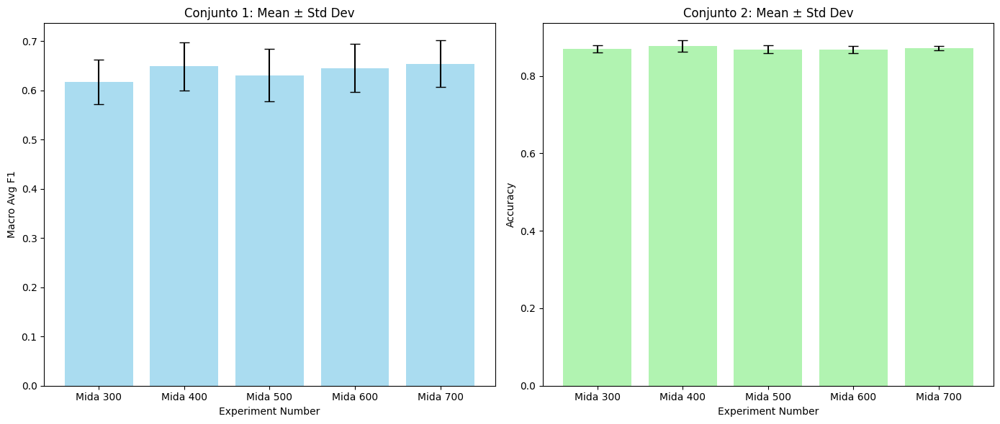

In [39]:
# Número de experimentos
x = np.arange(len(f1_means))

# Crear los subgráficos (2 columnas y 1 fila)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Primer gráfico (conjunto 1)
ax1.bar(x, f1_means, yerr=f1_stds, capsize=5, color='skyblue', alpha=0.7)
ax1.set_xlabel('Experiment Number')
ax1.set_ylabel('Macro Avg F1')
ax1.set_title('Conjunto 1: Mean ± Std Dev')
ax1.set_xticks(x)
ax1.set_xticklabels(['Mida 300', 'Mida 400', 'Mida 500', 'Mida 600', 'Mida 700'])

# Segundo gráfico (conjunto 2)
ax2.bar(x, accuracy_means, yerr=accuracy_stds, capsize=5, color='lightgreen', alpha=0.7)
ax2.set_xlabel('Experiment Number')
ax2.set_ylabel('Accuracy')
ax2.set_title('Conjunto 2: Mean ± Std Dev')
ax2.set_xticks(x)
ax2.set_xticklabels(['Mida 300', 'Mida 400', 'Mida 500', 'Mida 600', 'Mida 700'])

# Ajuste de diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [40]:
print('Amb mida 600 obtenim un macro avg f1 mean de: ', f1_means[3])
print('Amb mida 600 obtenim un macro avg f1 desviació estandard de: ', f1_stds[3])
print('Amb mida 600 obtenim un accuracy mean de: ', accuracy_means[3])
print('Amb mida 600 obtenim accuracy desviació estandard de: ', accuracy_stds[3])

Amb mida 600 obtenim un macro avg f1 mean de:  0.6450009170679972
Amb mida 600 obtenim un macro avg f1 desviació estandard de:  0.04853519695945947
Amb mida 600 obtenim un accuracy mean de:  0.8684444444444445
Amb mida 600 obtenim accuracy desviació estandard de:  0.009097550884648312


La mida de vocabulari de 600 sembla millorar una mica el rendiment. Seguirem les proves en base a tipus 'stemming' i mida de vocabulari 600.

### Provar mides de Embeddings

In [41]:
# Probar con diferentes dimensiones de embedding
embedding_dims = [50, 100, 150, 200, 250, 300, 350]
vocab_size = 600

# Listas para almacenar resultados
f1_means = []
f1_stds = []
accuracy_means = []
accuracy_stds = []

# Ejecutar para cada tamaño de embedding
for embedding_dim in embedding_dims:
    mean_macro_f1, std_macro_f1, mean_accuracy, std_accuracy = calculate_metrics(vocab_size, embedding_dim)
    f1_means.append(mean_macro_f1)
    f1_stds.append(std_macro_f1)
    accuracy_means.append(mean_accuracy)
    accuracy_stds.append(std_accuracy)



Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.0340 - loss: 2.8305 - val_f1_score: 0.2004 - val_loss: 2.9134
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2340 - loss: 2.5733 - val_f1_score: 0.2780 - val_loss: 2.5511
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.2881 - loss: 2.4265 - val_f1_score: 0.3676 - val_loss: 1.9139
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4343 - loss: 1.8409 - val_f1_score: 0.4391 - val_loss: 1.0934
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4766 - loss: 1.3995 - val_f1_score: 0.4974 - val_loss: 0.7228
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - f1_score: 0.0080 - loss: 3.7208 - val_f1_score: 0.1434 - val_loss: 2.9150
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.1669 - loss: 2.9873 - val_f1_score: 0.2785 - val_loss: 2.5344
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.3230 - loss: 2.2051 - val_f1_score: 0.2686 - val_loss: 1.9612
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4135 - loss: 2.6298 - val_f1_score: 0.3661 - val_loss: 1.3196
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4961 - loss: 1.4020 - val_f1_score: 0.4672 - val_loss: 1.0431
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.0175 - loss: 3.2673 - val_f1_score: 0.1157 - val_loss: 2.9189
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.1947 - loss: 3.3927 - val_f1_score: 0.2795 - val_loss: 2.5778
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.3164 - loss: 2.2153 - val_f1_score: 0.3129 - val_loss: 1.9056
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - f1_score: 0.4056 - loss: 2.0203 - val_f1_score: 0.3962 - val_loss: 1.2754
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4324 - loss: 1.1317 - val_f1_score: 0.4762 - val_loss: 0.8662
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - f1_score: 0.0647 - loss: 3.3894 - val_f1_score: 0.1823 - val_loss: 2.9084
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2466 - loss: 2.4904 - val_f1_score: 0.2629 - val_loss: 2.6379
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.3203 - loss: 2.6186 - val_f1_score: 0.2812 - val_loss: 2.1645
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3860 - loss: 2.3046 - val_f1_score: 0.3761 - val_loss: 1.4521
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4669 - loss: 1.7333 - val_f1_score: 0.4267 - val_loss: 1.2326
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.0268 - loss: 2.6154 - val_f1_score: 0.1489 - val_loss: 2.9007
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.1568 - loss: 3.0910 - val_f1_score: 0.2131 - val_loss: 2.5783
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.2632 - loss: 3.5124 - val_f1_score: 0.3228 - val_loss: 1.9065
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - f1_score: 0.3880 - loss: 2.3769 - val_f1_score: 0.3677 - val_loss: 1.3535
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - f1_score: 0.4562 - loss: 1.7469 - val_f1_score: 0.4870 - val_loss: 1.0890
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0699 - loss: 3.3836 - val_f1_score: 0.2566 - val_loss: 2.8498
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3149 - loss: 3.0170 - val_f1_score: 0.2714 - val_loss: 2.3030
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3223 - loss: 2.2011 - val_f1_score: 0.2868 - val_loss: 1.7432
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4056 - loss: 2.5115 - val_f1_score: 0.4324 - val_loss: 1.1412
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5293 - loss: 1.2225 - val_f1_score: 0.4911 - val_loss: 0.9239
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0506 - loss: 2.7351 - val_f1_score: 0.2457 - val_loss: 2.8179
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2922 - loss: 2.9824 - val_f1_score: 0.2872 - val_loss: 2.4902
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3519 - loss: 2.5248 - val_f1_score: 0.3118 - val_loss: 1.6151
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4242 - loss: 1.7332 - val_f1_score: 0.4039 - val_loss: 1.1667
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4786 - loss: 1.1056 - val_f1_score: 0.4988 - val_loss: 0.7582
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - f1_score: 0.0492 - loss: 3.2022 - val_f1_score: 0.2394 - val_loss: 2.8864
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.2490 - loss: 3.2976 - val_f1_score: 0.2146 - val_loss: 2.4205
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3136 - loss: 2.0845 - val_f1_score: 0.3860 - val_loss: 1.8133
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4850 - loss: 2.3192 - val_f1_score: 0.4292 - val_loss: 1.1966
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4940 - loss: 1.5871 - val_f1_score: 0.5143 - val_loss: 0.7800
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0333 - loss: 3.0982 - val_f1_score: 0.2455 - val_loss: 2.9168
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2174 - loss: 2.6023 - val_f1_score: 0.2800 - val_loss: 2.2582
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.3683 - loss: 3.0886 - val_f1_score: 0.3627 - val_loss: 1.4532
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4859 - loss: 1.8164 - val_f1_score: 0.4778 - val_loss: 0.9853
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5506 - loss: 1.0124 - val_f1_score: 0.5109 - val_loss: 0.6167
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0664 - loss: 3.0201 - val_f1_score: 0.1613 - val_loss: 2.8133
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - f1_score: 0.2340 - loss: 3.2950 - val_f1_score: 0.2355 - val_loss: 2.2570
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3807 - loss: 3.0519 - val_f1_score: 0.3896 - val_loss: 1.5886
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.4941 - loss: 2.4236 - val_f1_score: 0.5052 - val_loss: 0.9543
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - f1_score: 0.5504 - loss: 1.2218 - val_f1_score: 0.5347 - val_loss: 0.6816
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0769 - loss: 3.6292 - val_f1_score: 0.2294 - val_loss: 2.7665
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2842 - loss: 2.9624 - val_f1_score: 0.3556 - val_loss: 2.0675
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4165 - loss: 2.3181 - val_f1_score: 0.3697 - val_loss: 1.3398
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.4622 - loss: 2.2102 - val_f1_score: 0.3963 - val_loss: 0.8034
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.5450 - loss: 1.0661 - val_f1_score: 0.5251 - val_loss: 0.5710
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0584 - loss: 2.7686 - val_f1_score: 0.2399 - val_loss: 2.7828
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2945 - loss: 3.1087 - val_f1_score: 0.2615 - val_loss: 2.1780
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4003 - loss: 2.7079 - val_f1_score: 0.3411 - val_loss: 1.3905
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5092 - loss: 2.2672 - val_f1_score: 0.4819 - val_loss: 0.9324
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5697 - loss: 1.0282 - val_f1_score: 0.4984 - val_loss: 0.6608
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0477 - loss: 2.8381 - val_f1_score: 0.2506 - val_loss: 2.8801
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2717 - loss: 3.2307 - val_f1_score: 0.3247 - val_loss: 2.2026
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3627 - loss: 2.4151 - val_f1_score: 0.3711 - val_loss: 1.4576
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.5125 - loss: 2.5353 - val_f1_score: 0.4441 - val_loss: 0.8185
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5553 - loss: 1.1759 - val_f1_score: 0.5654 - val_loss: 0.5533
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0358 - loss: 3.3700 - val_f1_score: 0.2556 - val_loss: 2.7621
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.2792 - loss: 3.1744 - val_f1_score: 0.3053 - val_loss: 2.0247
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4128 - loss: 2.4495 - val_f1_score: 0.3877 - val_loss: 1.2570
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4681 - loss: 2.0185 - val_f1_score: 0.4633 - val_loss: 0.7022
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5293 - loss: 0.8642 - val_f1_score: 0.5130 - val_loss: 0.5706
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.0845 - loss: 3.2322 - val_f1_score: 0.1635 - val_loss: 2.8195
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.2309 - loss: 3.0688 - val_f1_score: 0.2993 - val_loss: 2.1109
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3534 - loss: 2.7860 - val_f1_score: 0.3537 - val_loss: 1.4326
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4924 - loss: 2.5596 - val_f1_score: 0.4538 - val_loss: 0.8802
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5088 - loss: 1.0007 - val_f1_score: 0.5207 - val_loss: 0.6117
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - f1_score: 0.0694 - loss: 3.3726 - val_f1_score: 0.2083 - val_loss: 2.8402
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2555 - loss: 2.8677 - val_f1_score: 0.3024 - val_loss: 2.3105
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3864 - loss: 1.6681 - val_f1_score: 0.3571 - val_loss: 1.6098
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4803 - loss: 1.9457 - val_f1_score: 0.5079 - val_loss: 0.7687
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - f1_score: 0.5433 - loss: 0.9006 - val_f1_score: 0.5051 - val_loss: 0.5442
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0729 - loss: 2.9233 - val_f1_score: 0.2608 - val_loss: 2.7975
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2492 - loss: 3.0166 - val_f1_score: 0.3194 - val_loss: 2.3313
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.4151 - loss: 2.2173 - val_f1_score: 0.4455 - val_loss: 1.5805
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5027 - loss: 1.3206 - val_f1_score: 0.4461 - val_loss: 0.7625
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5947 - loss: 1.0157 - val_f1_score: 0.4866 - val_loss: 0.5156
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0235 - loss: 3.1027 - val_f1_score: 0.2854 - val_loss: 2.7825
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2838 - loss: 2.7135 - val_f1_score: 0.2963 - val_loss: 2.1354
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.3939 - loss: 2.2262 - val_f1_score: 0.3898 - val_loss: 1.3932
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - f1_score: 0.4968 - loss: 1.4250 - val_f1_score: 0.4929 - val_loss: 0.7636
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5202 - loss: 0.8808 - val_f1_score: 0.4923 - val_loss: 0.5691
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0607 - loss: 2.8009 - val_f1_score: 0.2259 - val_loss: 2.7518
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3380 - loss: 2.5743 - val_f1_score: 0.3536 - val_loss: 2.0865
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4264 - loss: 2.2286 - val_f1_score: 0.4106 - val_loss: 1.2260
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5021 - loss: 1.1107 - val_f1_score: 0.5166 - val_loss: 0.8278
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5709 - loss: 1.1518 - val_f1_score: 0.5613 - val_loss: 0.4917
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0459 - loss: 2.8625 - val_f1_score: 0.1951 - val_loss: 2.7462
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.2686 - loss: 2.8810 - val_f1_score: 0.3130 - val_loss: 2.2131
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.3835 - loss: 2.3296 - val_f1_score: 0.4252 - val_loss: 1.2571
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5048 - loss: 1.6519 - val_f1_score: 0.4506 - val_loss: 0.6103
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - f1_score: 0.5422 - loss: 0.9688 - val_f1_score: 0.5431 - val_loss: 0.5194
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.0506 - loss: 3.1829 - val_f1_score: 0.2119 - val_loss: 2.7733
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.2710 - loss: 2.7217 - val_f1_score: 0.3638 - val_loss: 2.1547
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4246 - loss: 2.3406 - val_f1_score: 0.4246 - val_loss: 1.0718
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5186 - loss: 1.3487 - val_f1_score: 0.5510 - val_loss: 0.6724
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5322 - loss: 0.8335 - val_f1_score: 0.6129 - val_loss: 0.3972
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0829 - loss: 3.1236 - val_f1_score: 0.1295 - val_loss: 2.8317
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2446 - loss: 2.9313 - val_f1_score: 0.3100 - val_loss: 2.0882
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3756 - loss: 1.8548 - val_f1_score: 0.3540 - val_loss: 1.2504
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.5066 - loss: 1.5307 - val_f1_score: 0.5371 - val_loss: 0.7936
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.5226 - loss: 1.1129 - val_f1_score: 0.5422 - val_loss: 0.4901
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0532 - loss: 3.2993 - val_f1_score: 0.2038 - val_loss: 2.7511
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2801 - loss: 3.2252 - val_f1_score: 0.3612 - val_loss: 2.2525
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4172 - loss: 2.5296 - val_f1_score: 0.4191 - val_loss: 1.2995
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4790 - loss: 1.7106 - val_f1_score: 0.5305 - val_loss: 0.5997
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5492 - loss: 0.7949 - val_f1_score: 0.5331 - val_loss: 0.5322
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0688 - loss: 3.2521 - val_f1_score: 0.1931 - val_loss: 2.7713
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.2447 - loss: 3.2226 - val_f1_score: 0.2908 - val_loss: 1.9884
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4078 - loss: 1.9845 - val_f1_score: 0.4786 - val_loss: 1.2732
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4799 - loss: 1.2853 - val_f1_score: 0.4914 - val_loss: 0.6725
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5844 - loss: 1.2007 - val_f1_score: 0.5465 - val_loss: 0.5125
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.0298 - loss: 3.0576 - val_f1_score: 0.2317 - val_loss: 2.7608
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3047 - loss: 2.6585 - val_f1_score: 0.3195 - val_loss: 2.0902
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4293 - loss: 2.4583 - val_f1_score: 0.4250 - val_loss: 0.9799
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5471 - loss: 1.5935 - val_f1_score: 0.4651 - val_loss: 0.6636
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.5611 - loss: 0.8312 - val_f1_score: 0.5192 - val_loss: 0.4314
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0606 - loss: 3.1668 - val_f1_score: 0.2509 - val_loss: 2.8079
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.2694 - loss: 2.8985 - val_f1_score: 0.4348 - val_loss: 2.1881
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4564 - loss: 2.1541 - val_f1_score: 0.4854 - val_loss: 1.5604
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5278 - loss: 0.9942 - val_f1_score: 0.5333 - val_loss: 0.7856
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.5967 - loss: 0.7602 - val_f1_score: 0.5652 - val_loss: 0.4145
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - f1_score: 0.0345 - loss: 2.9582 - val_f1_score: 0.1444 - val_loss: 2.8498
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.2305 - loss: 2.3520 - val_f1_score: 0.2624 - val_loss: 2.2156
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.3574 - loss: 2.2338 - val_f1_score: 0.4443 - val_loss: 1.0936
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4776 - loss: 1.3628 - val_f1_score: 0.5245 - val_loss: 0.6375
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.6006 - loss: 0.8577 - val_f1_score: 0.5315 - val_loss: 0.4431
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.0530 - loss: 3.4315 - val_f1_score: 0.2327 - val_loss: 2.8271
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2706 - loss: 2.2984 - val_f1_score: 0.3661 - val_loss: 1.8792
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - f1_score: 0.4245 - loss: 2.2917 - val_f1_score: 0.3970 - val_loss: 1.1332
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.5258 - loss: 1.3108 - val_f1_score: 0.5098 - val_loss: 0.6134
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - f1_score: 0.5890 - loss: 0.6638 - val_f1_score: 0.5192 - val_loss: 0.4275
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - f1_score: 0.1138 - loss: 3.3974 - val_f1_score: 0.1780 - val_loss: 2.6684
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2594 - loss: 2.6060 - val_f1_score: 0.3142 - val_loss: 2.0572
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4297 - loss: 2.0318 - val_f1_score: 0.4348 - val_loss: 1.3143
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4965 - loss: 1.0350 - val_f1_score: 0.5158 - val_loss: 0.7267
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5796 - loss: 0.6823 - val_f1_score: 0.5713 - val_loss: 0.5008
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - f1_score: 0.0695 - loss: 3.2552 - val_f1_score: 0.3157 - val_loss: 2.6912
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3269 - loss: 3.3921 - val_f1_score: 0.3103 - val_loss: 1.7462
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4001 - loss: 2.6541 - val_f1_score: 0.4492 - val_loss: 1.0214
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5462 - loss: 1.2359 - val_f1_score: 0.4863 - val_loss: 0.6708
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5812 - loss: 0.7157 - val_f1_score: 0.5180 - val_loss: 0.4341
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0302 - loss: 3.2002 - val_f1_score: 0.2034 - val_loss: 2.7232
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - f1_score: 0.3136 - loss: 2.6093 - val_f1_score: 0.3281 - val_loss: 1.7790
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.4899 - loss: 2.0658 - val_f1_score: 0.4742 - val_loss: 1.3112
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5514 - loss: 1.1978 - val_f1_score: 0.4937 - val_loss: 0.6671
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - f1_score: 0.6246 - loss: 0.6089 - val_f1_score: 0.5383 - val_loss: 0.4158
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.0798 - loss: 2.9120 - val_f1_score: 0.1925 - val_loss: 2.6487
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3191 - loss: 2.6101 - val_f1_score: 0.3531 - val_loss: 1.9674
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.4085 - loss: 1.9275 - val_f1_score: 0.4094 - val_loss: 1.3146
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.5151 - loss: 1.5646 - val_f1_score: 0.5100 - val_loss: 0.7055
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5732 - loss: 0.7750 - val_f1_score: 0.5152 - val_loss: 0.4976
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.0678 - loss: 2.7828 - val_f1_score: 0.2254 - val_loss: 2.7985
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2645 - loss: 2.5184 - val_f1_score: 0.3337 - val_loss: 2.4009
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4450 - loss: 2.3746 - val_f1_score: 0.4475 - val_loss: 1.3300
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4950 - loss: 1.6721 - val_f1_score: 0.4737 - val_loss: 0.8048
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.6021 - loss: 0.9182 - val_f1_score: 0.5362 - val_loss: 0.5389
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - f1_score: 0.0404 - loss: 2.1460 - val_f1_score: 0.3015 - val_loss: 2.7866
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.2831 - loss: 2.7475 - val_f1_score: 0.3472 - val_loss: 2.0609
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4284 - loss: 2.2197 - val_f1_score: 0.4688 - val_loss: 1.0828
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.5620 - loss: 1.3949 - val_f1_score: 0.4944 - val_loss: 0.6155
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5527 - loss: 0.5945 - val_f1_score: 0.5528 - val_loss: 0.4538
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.0541 - loss: 2.8972 - val_f1_score: 0.1263 - val_loss: 2.7498
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2275 - loss: 2.8704 - val_f1_score: 0.3293 - val_loss: 2.0826
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.3928 - loss: 1.9550 - val_f1_score: 0.3978 - val_loss: 1.2337
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.5534 - loss: 1.6445 - val_f1_score: 0.4706 - val_loss: 0.7397
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5683 - loss: 0.5423 - val_f1_score: 0.5051 - val_loss: 0.5054
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


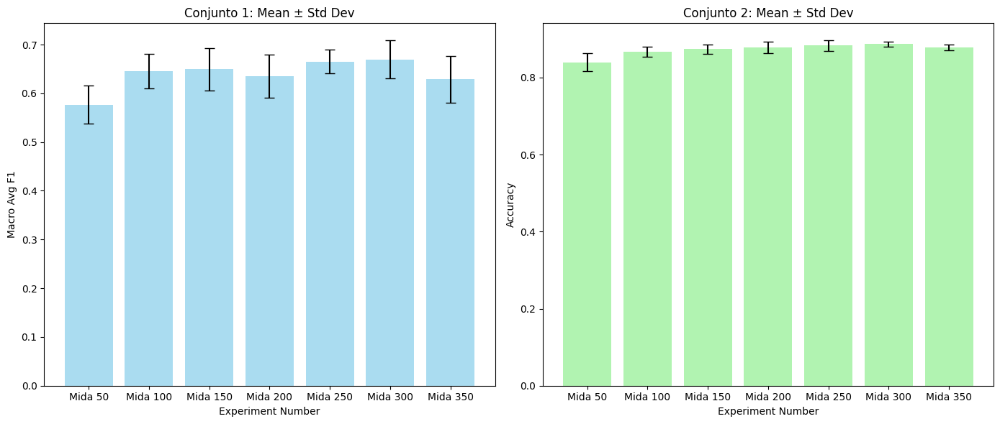

In [42]:
# Número de experimentos
x = np.arange(len(f1_means))

# Crear los subgráficos (2 columnas y 1 fila)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Primer gráfico (conjunto 1)
ax1.bar(x, f1_means, yerr=f1_stds, capsize=5, color='skyblue', alpha=0.7)
ax1.set_xlabel('Experiment Number')
ax1.set_ylabel('Macro Avg F1')
ax1.set_title('Conjunto 1: Mean ± Std Dev')
ax1.set_xticks(x)
ax1.set_xticklabels(['Mida 50', 'Mida 100', 'Mida 150', 'Mida 200', 'Mida 250', 'Mida 300', 'Mida 350'])

# Segundo gráfico (conjunto 2)
ax2.bar(x, accuracy_means, yerr=accuracy_stds, capsize=5, color='lightgreen', alpha=0.7)
ax2.set_xlabel('Experiment Number')
ax2.set_ylabel('Accuracy')
ax2.set_title('Conjunto 2: Mean ± Std Dev')
ax2.set_xticks(x)
ax2.set_xticklabels(['Mida 50', 'Mida 100', 'Mida 150', 'Mida 200', 'Mida 250', 'Mida 300', 'Mida 350'])

# Ajuste de diseño
plt.tight_layout()

# Mostrar el gráfico
plt.show()


In [43]:
print('Amb mida 100 obtenim un macro avg f1 mean de: ', f1_means[1])
print('Amb mida 100 obtenim un macro avg f1 desviació estandard de: ', f1_stds[1])
print('Amb mida 100 obtenim un accuracy mean de: ', accuracy_means[1])
print('Amb mida 100 obtenim accuracy desviació estandard de: ', accuracy_stds[1])

Amb mida 100 obtenim un macro avg f1 mean de:  0.6457233939499311
Amb mida 100 obtenim un macro avg f1 desviació estandard de:  0.03503764950746413
Amb mida 100 obtenim un accuracy mean de:  0.8673333333333334
Amb mida 100 obtenim accuracy desviació estandard de:  0.013139329332528432


Amb mida d'embedding 100 és suficient per representar el nostre vocabulari sense fer-la massa complexa. Augmentar-ne més ja no augmenta el rendiment.
Continuem les proves en base a:
- Stemming
- Mida de vocabulari 600
- Mida embedding 100

### Provar xarxes convolucionals

In [28]:
def plot_curves(history):

  train_loss = history.history['loss']
  val_loss = history.history['val_loss']
  train_f1 = history.history['f1_score']
  val_f1 = history.history['val_f1_score']
  epochs = range(1, len(train_loss) + 1)

  fig, axes = plt.subplots(1, 2, figsize=(14, 5))

  axes[0].plot(epochs, train_loss, 'g-', label='Training Loss')
  axes[0].plot(epochs, val_loss, 'orange', label='Validation Loss')
  axes[0].set_title('Training and Validation Loss')
  axes[0].set_xlabel('Epochs')
  axes[0].set_ylabel('Loss')
  axes[0].legend()
  axes[0].grid(True)

  axes[1].plot(epochs, train_f1, 'g-', label='Training f1')
  axes[1].plot(epochs, val_f1, 'orange', label='Validation f1')
  axes[1].set_title('Training and Validation f1')
  axes[1].set_xlabel('Epochs')
  axes[1].set_ylabel('f1')
  axes[1].legend()
  axes[1].grid(True)

  plt.tight_layout()

  plt.show()

In [45]:
def calculate_metrics(vocab_size=600, embedding_dim=100, conv_layers_config=None, num_executions=5, batch_size=32, epochs=5):
    macro_f1_scores = []
    accuracies = []
    history_dict = {'train_loss': [], 'val_loss': [], 'train_f1': [], 'val_f1': []}

    # Preprocesar datos
    prep_st = TextProcessor(train_sentences, val_sentences, test_sentences, train_labels, val_labels, test_labels, num_words=vocab_size, tech='stemming')
    prep_st.process_all()
    vocab_size = prep_st.num_words + 1

    for i in range(num_executions):
        class_weights = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(prep_st.train_labels),
            y=prep_st.train_labels
        )
        class_weight_dict = dict(enumerate(class_weights))

        # Construir el modelo
        model = Sequential()
        model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))

        # Añadir capas convolucionales y pooling según la configuración
        for layer in conv_layers_config:
            model.add(Conv1D(filters=layer['filters'], kernel_size=layer['kernel_size'], activation='relu'))
            if 'pooling' in layer:
                if layer['pooling'] == 'max':
                    # Usamos MaxPooling1D sin necesidad de Reshape
                    model.add(MaxPooling1D(pool_size=2))
                elif layer['pooling'] == 'avg':
                    # Usamos AveragePooling1D sin necesidad de Reshape
                    model.add(AveragePooling1D(pool_size=2))

        # Añadir capas de salida
        model.add(GlobalMaxPooling1D())
        model.add(Dense(128, activation='relu'))
        model.add(Dense(num_labels, activation='softmax'))

        # Compilar y entrenar el modelo con F1 Score como métrica
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])
        history = model.fit(
            prep_st.train_pad_sequences, prep_st.train_encoded_labels,
            batch_size=batch_size, epochs=epochs,
            validation_data=(prep_st.val_pad_sequences, prep_st.val_encoded_labels),verbose = 1,class_weight=class_weight_dict)

        # Guardar historia de entrenamiento para graficar
        history_dict['train_loss'].append(history.history['loss'])
        history_dict['val_loss'].append(history.history['val_loss'])
        history_dict['train_f1'].append(history.history['f1_score'])  # Guardar macro F1 en training
        history_dict['val_f1'].append(history.history['val_f1_score'])  # Guardar macro F1 en validation
        plot_curves(history)

        # Predicción
        probs = model.predict(prep_st.val_pad_sequences)
        _predicted_labels = np.argmax(probs, axis=1)
        predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)

        # Calcular métricas
        macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
        accuracy = accuracy_score(val_labels, predicted_labels)
        macro_f1_scores.append(macro_f1)
        accuracies.append(accuracy)

    # Calcular media y desviación estándar de las métricas
    mean_macro_f1 = np.mean(macro_f1_scores)
    std_macro_f1 = np.std(macro_f1_scores)
    mean_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies)

    return mean_macro_f1, std_macro_f1, mean_accuracy, std_accuracy, history_dict


In [29]:
def plot_experiment_metrics(results):
    """
    Esta función toma una lista de resultados de múltiples experimentos y genera gráficos de comparación para F1 Score y Accuracy.
    """
    # Inicializar listas para almacenar los valores de las métricas
    f1_means = []
    f1_stds = []
    accuracy_means = []
    accuracy_stds = []

    # Extraer métricas de los resultados
    for x, values in enumerate(results):
        (mean_f1, std_f1, mean_acc, std_acc, history, conv_config) = values
        f1_means.append(mean_f1)
        f1_stds.append(std_f1)
        accuracy_means.append(mean_acc)
        accuracy_stds.append(std_acc)

        print(f'Experiment {x+1} Macro avg F1 mean: ', mean_f1)
        print(f'Experiment {x+1} Macro avg F1 std: ', std_f1)
        print(f'Experiment {x+1} Accuracy mean: ', mean_acc)
        print(f'Experiment {x+1} Accuracy std: ', std_acc)

    # Generar etiquetas para cada experimento
    experiment_labels = [f'Experiment {i+1}' for i in range(len(results))]

    # Crear subplots para F1 Score y Accuracy
    plt.figure(figsize=(12, 6))

    # Gráfico de F1 Score
    plt.subplot(1, 2, 1)
    x = np.arange(len(experiment_labels))  # Posiciones de las barras
    plt.bar(x, f1_means, yerr=f1_stds, capsize=5, color='b', alpha=0.6)
    plt.xticks(x, experiment_labels)
    plt.xlabel('Experimentos')
    plt.ylabel('Mean F1 Score')
    plt.title('Comparison of F1 Scores for Each Experiment')
    plt.ylim(0, 1)  # Limitar el eje Y de 0 a 1

    # Gráfico de Accuracy
    plt.subplot(1, 2, 2)
    plt.bar(x, accuracy_means, yerr=accuracy_stds, capsize=5, color='g', alpha=0.6)
    plt.xticks(x, experiment_labels)
    plt.xlabel('Experimentos')
    plt.ylabel('Mean Accuracy')
    plt.title('Comparison of Accuracy for Each Experiment')
    plt.ylim(0, 1)  # Limitar el eje Y de 0 a 1

    # Ajustar el layout
    plt.tight_layout()
    plt.show()



#### Provar model bàsic: Embedding + Convolució + Pooling (max vs avg)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.0355 - loss: 3.1081 - val_f1_score: 0.1513 - val_loss: 2.9532
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.1622 - loss: 2.6927 - val_f1_score: 0.2210 - val_loss: 2.4880
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3230 - loss: 2.1744 - val_f1_score: 0.3123 - val_loss: 1.9396
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3837 - loss: 1.6470 - val_f1_score: 0.3950 - val_loss: 1.2081
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4966 - loss: 0.9805 - val_f1_score: 0.4763 - val_loss: 0.8647


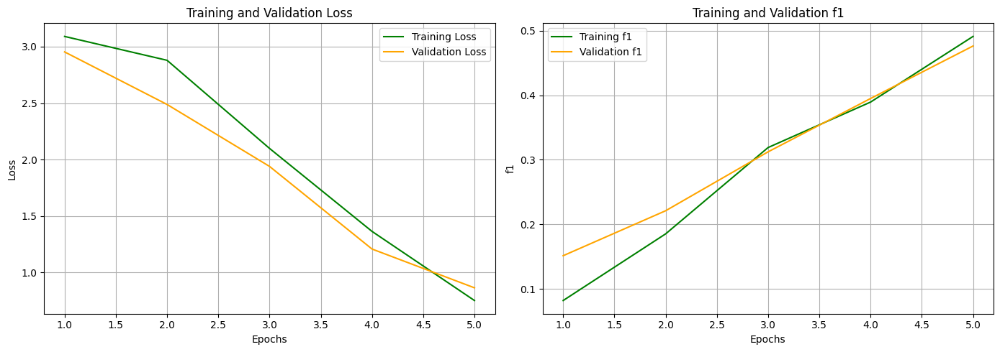

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0539 - loss: 3.3578 - val_f1_score: 0.1849 - val_loss: 2.8028
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2690 - loss: 3.2952 - val_f1_score: 0.2546 - val_loss: 2.3099
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3270 - loss: 2.4086 - val_f1_score: 0.3734 - val_loss: 1.5273
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.4037 - loss: 1.1981 - val_f1_score: 0.4070 - val_loss: 1.2225
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.5123 - loss: 0.6154 - val_f1_score: 0.5270 - val_loss: 0.7686


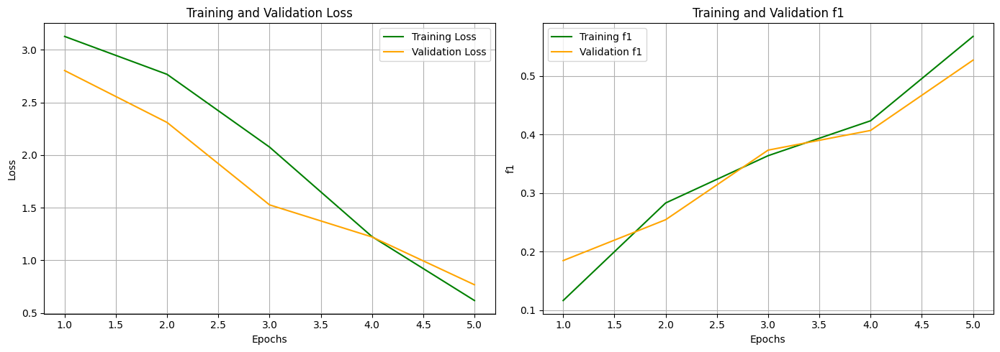

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0292 - loss: 3.0559 - val_f1_score: 0.1306 - val_loss: 2.8405
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2234 - loss: 3.9868 - val_f1_score: 0.2525 - val_loss: 2.3160
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2851 - loss: 1.5532 - val_f1_score: 0.2579 - val_loss: 2.0627
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3529 - loss: 1.3109 - val_f1_score: 0.3150 - val_loss: 1.5298
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - f1_score: 0.4263 - loss: 0.8342 - val_f1_score: 0.4560 - val_loss: 0.9165


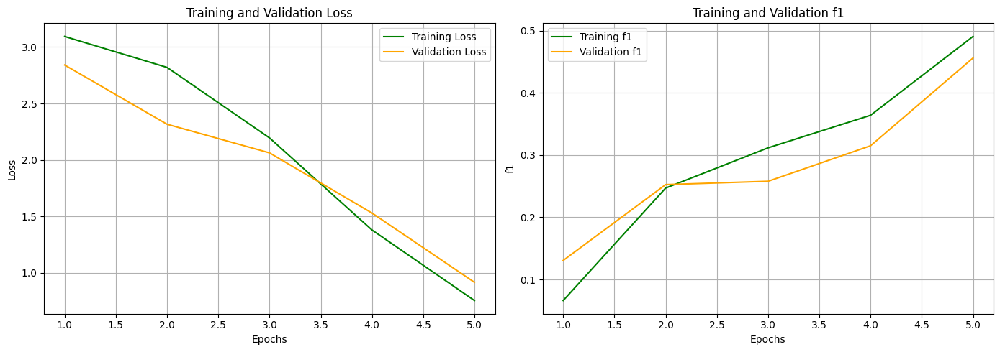

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0442 - loss: 3.0248 - val_f1_score: 0.1947 - val_loss: 2.8520
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2361 - loss: 2.7443 - val_f1_score: 0.2859 - val_loss: 2.3096
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3704 - loss: 2.1108 - val_f1_score: 0.3863 - val_loss: 1.8884
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4511 - loss: 1.0369 - val_f1_score: 0.4120 - val_loss: 1.2004
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.5401 - loss: 0.8022 - val_f1_score: 0.4461 - val_loss: 1.0003


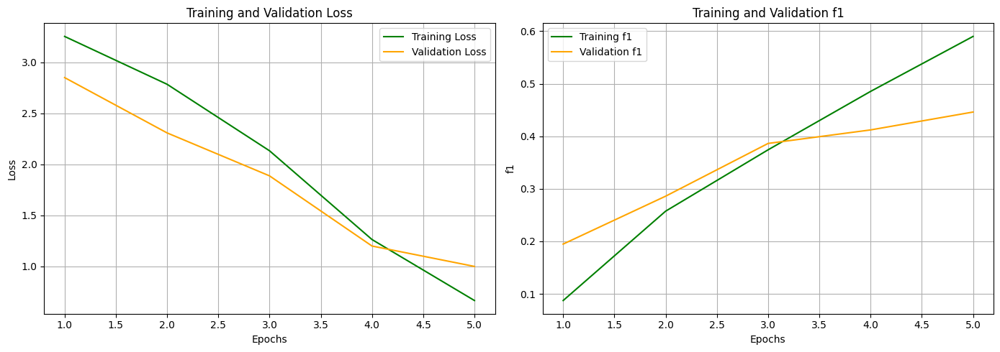

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - f1_score: 0.0373 - loss: 2.7791 - val_f1_score: 0.2194 - val_loss: 2.8615
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.2729 - loss: 3.3350 - val_f1_score: 0.2610 - val_loss: 2.1211
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3577 - loss: 2.5997 - val_f1_score: 0.4031 - val_loss: 1.3742
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4725 - loss: 1.4108 - val_f1_score: 0.4358 - val_loss: 1.0454
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.5700 - loss: 0.8474 - val_f1_score: 0.5099 - val_loss: 0.5992


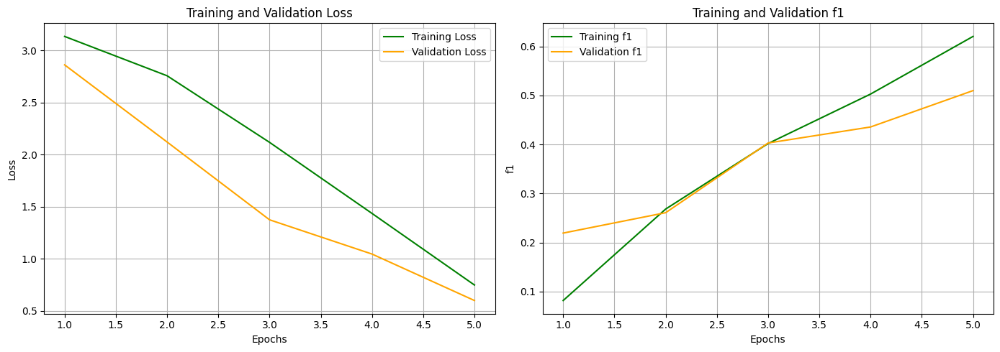

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - f1_score: 0.0387 - loss: 2.8229 - val_f1_score: 0.1422 - val_loss: 2.9491
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.1721 - loss: 3.1311 - val_f1_score: 0.2616 - val_loss: 2.2051
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.2966 - loss: 2.0970 - val_f1_score: 0.3208 - val_loss: 1.7128
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4444 - loss: 1.5776 - val_f1_score: 0.3959 - val_loss: 1.1307
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4673 - loss: 1.1504 - val_f1_score: 0.4150 - val_loss: 1.1263


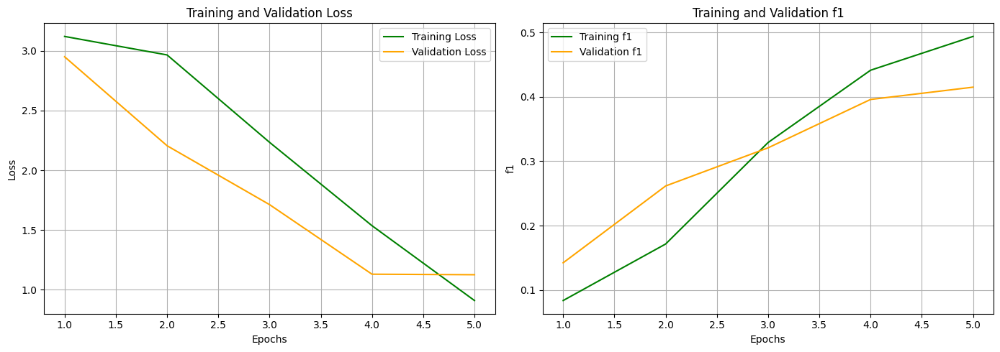

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0645 - loss: 3.4385 - val_f1_score: 0.1703 - val_loss: 2.8411
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.1903 - loss: 2.6483 - val_f1_score: 0.1735 - val_loss: 2.2689
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - f1_score: 0.2388 - loss: 1.7180 - val_f1_score: 0.3165 - val_loss: 1.6485
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - f1_score: 0.3679 - loss: 1.5231 - val_f1_score: 0.3974 - val_loss: 1.3152
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.4517 - loss: 0.8283 - val_f1_score: 0.4313 - val_loss: 1.0718


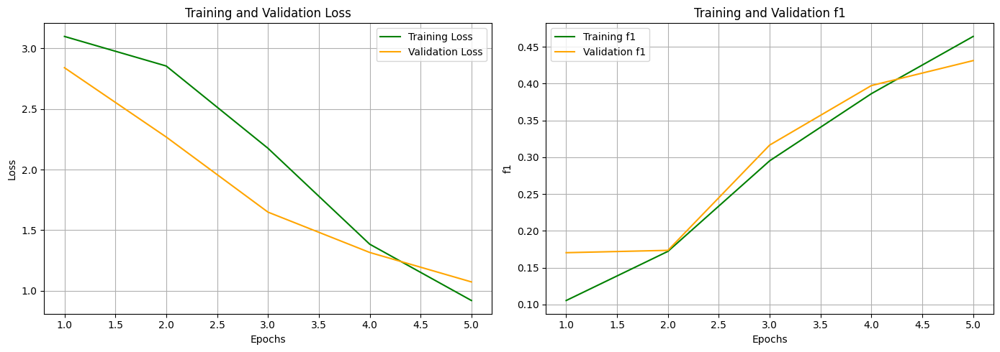

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - f1_score: 0.0312 - loss: 3.4355 - val_f1_score: 0.1316 - val_loss: 2.8919
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.1484 - loss: 2.9853 - val_f1_score: 0.1803 - val_loss: 2.2372
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - f1_score: 0.2510 - loss: 2.7685 - val_f1_score: 0.3477 - val_loss: 1.5499
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - f1_score: 0.3805 - loss: 1.8565 - val_f1_score: 0.3431 - val_loss: 1.4594
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - f1_score: 0.4351 - loss: 0.8753 - val_f1_score: 0.3853 - val_loss: 1.2461


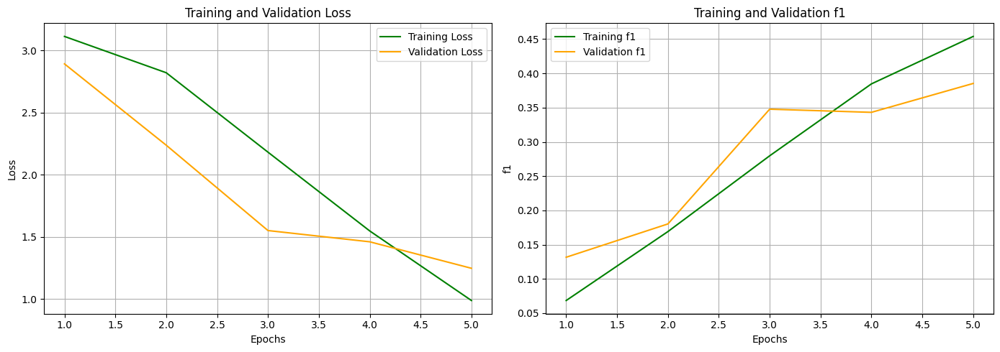

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - f1_score: 0.0371 - loss: 3.2558 - val_f1_score: 0.1107 - val_loss: 2.9223
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - f1_score: 0.1585 - loss: 2.3362 - val_f1_score: 0.1953 - val_loss: 2.2100
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - f1_score: 0.2869 - loss: 1.4164 - val_f1_score: 0.3094 - val_loss: 1.8800
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.3803 - loss: 1.1074 - val_f1_score: 0.3719 - val_loss: 1.3732
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4741 - loss: 0.6810 - val_f1_score: 0.4977 - val_loss: 0.9948


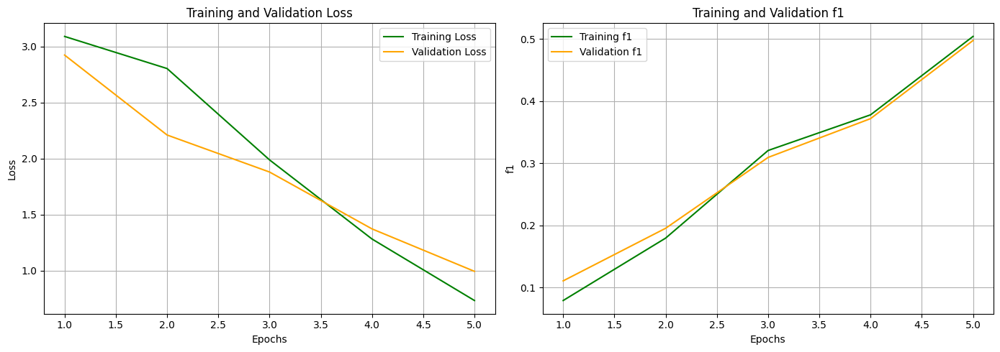

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - f1_score: 0.0401 - loss: 2.8651 - val_f1_score: 0.1185 - val_loss: 2.8072
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.1873 - loss: 3.0075 - val_f1_score: 0.2263 - val_loss: 2.2556
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.2706 - loss: 2.5913 - val_f1_score: 0.3644 - val_loss: 1.6012
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.4174 - loss: 1.7299 - val_f1_score: 0.4355 - val_loss: 1.2086
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - f1_score: 0.4979 - loss: 1.1013 - val_f1_score: 0.4701 - val_loss: 0.9097


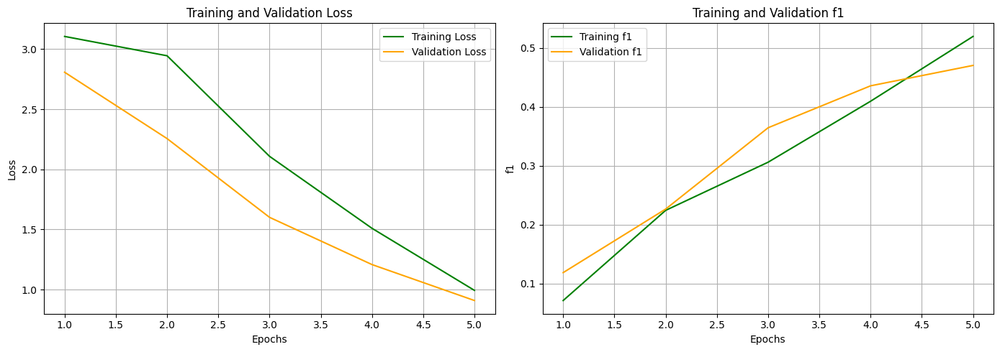

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step


In [49]:
# Ejemplo de configuraciones de capas convolucionales
conv_layers_experiments = [
    [{'filters': 64, 'kernel_size': 3, 'pooling': 'max'}],
    [{'filters': 64, 'kernel_size': 3, 'pooling': 'avg'}],
]

# Ejecutar los experimentos
results = []

for conv_config in conv_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(conv_layers_config=conv_config)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.5784190953326557
Experiment 1 Macro avg F1 std:  0.0462522770675834
Experiment 1 Accuracy mean:  0.8148888888888889
Experiment 1 Accuracy std:  0.03894662380968135
Experiment 2 Macro avg F1 mean:  0.5065833312916953
Experiment 2 Macro avg F1 std:  0.06202779712863592
Experiment 2 Accuracy mean:  0.6902222222222221
Experiment 2 Accuracy std:  0.08837741737137701


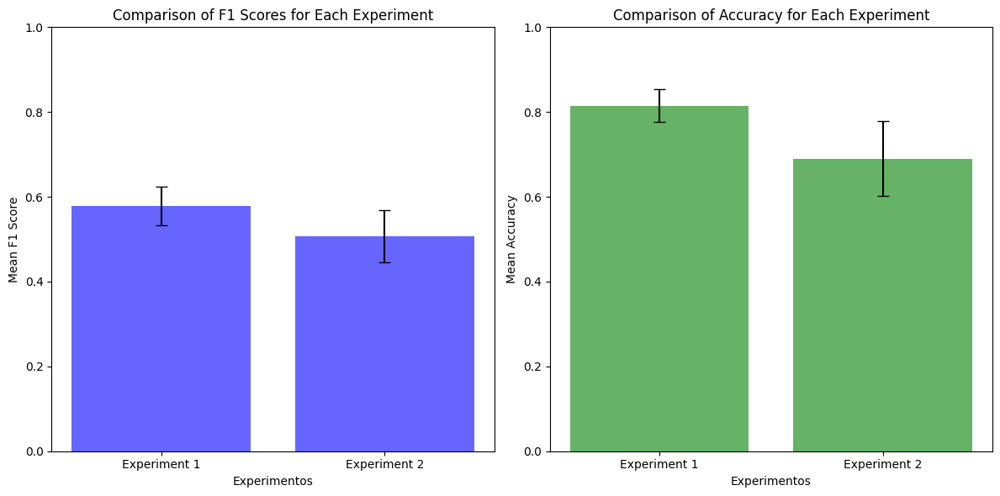

In [51]:
plot_experiment_metrics(results)

No hi ha gaire diferència. Agafem el MaxPooling per continuar.

#### Provar nombre de filtres de CNN

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - f1_score: 0.0317 - loss: 2.7430 - val_f1_score: 0.1231 - val_loss: 2.7785
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1684 - loss: 2.6682 - val_f1_score: 0.2567 - val_loss: 2.2244
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2639 - loss: 2.5328 - val_f1_score: 0.2980 - val_loss: 1.6151
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3768 - loss: 1.8860 - val_f1_score: 0.3965 - val_loss: 1.1719
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5124 - loss: 0.9173 - val_f1_score: 0.4311 - val_loss: 0.8236
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5219 - loss: 0.5600 - val_f1_score: 0.4799 - val_loss: 0.7600
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.6032 - loss: 0.2239 - val_f1_score: 0.5026 - val_loss: 0.5771
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - f1_score: 0.6299 - loss: 0.1244 - val_f1_score: 0.5232 - val

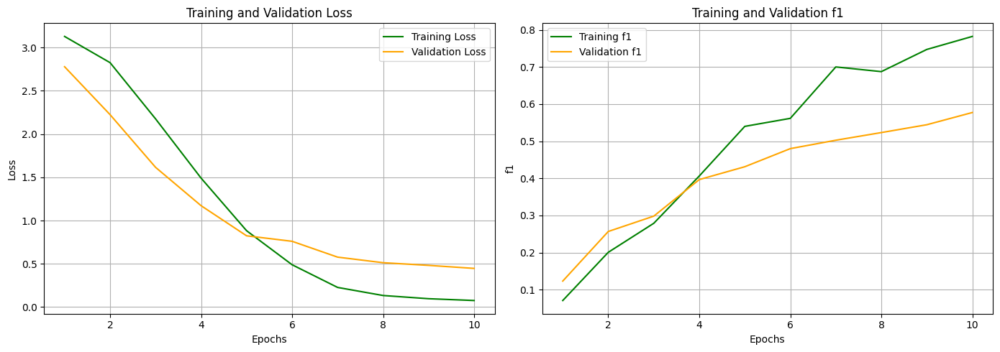

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - f1_score: 0.0439 - loss: 3.4833 - val_f1_score: 0.1857 - val_loss: 2.9089
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1630 - loss: 3.0797 - val_f1_score: 0.2745 - val_loss: 2.1671
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2941 - loss: 2.6569 - val_f1_score: 0.3436 - val_loss: 1.5305
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3938 - loss: 2.0889 - val_f1_score: 0.4167 - val_loss: 1.1439
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.4443 - loss: 1.5858 - val_f1_score: 0.4720 - val_loss: 0.8425
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.6378 - loss: 0.5841 - val_f1_score: 0.4516 - val_loss: 0.8317
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.6143 - loss: 0.2759 - val_f1_score: 0.5093 - val_loss: 0.6069
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.6954 - loss: 0.1727 - val_f1_score: 0.5509 - val

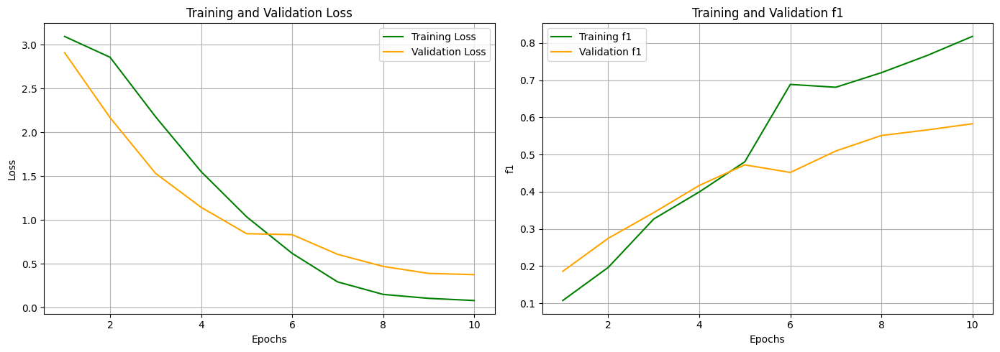

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - f1_score: 0.0438 - loss: 2.6404 - val_f1_score: 0.2074 - val_loss: 2.6647
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2431 - loss: 3.1699 - val_f1_score: 0.2356 - val_loss: 2.0661
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.3226 - loss: 2.4645 - val_f1_score: 0.3247 - val_loss: 1.7224
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.3476 - loss: 1.9701 - val_f1_score: 0.3671 - val_loss: 1.4015
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4095 - loss: 1.0121 - val_f1_score: 0.3971 - val_loss: 1.0994
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4809 - loss: 0.6161 - val_f1_score: 0.4145 - val_loss: 0.7895
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5068 - loss: 0.3440 - val_f1_score: 0.4418 - val_loss: 0.7348
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5874 - loss: 0.3465 - val_f1_score: 0.4509 - val

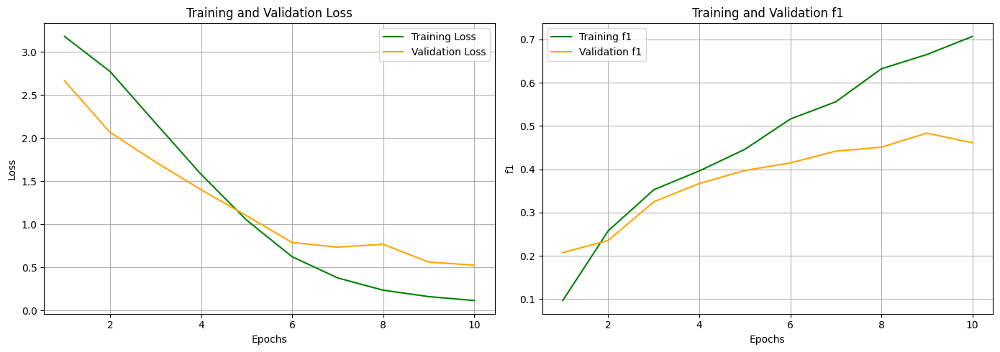

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - f1_score: 0.0666 - loss: 3.0456 - val_f1_score: 0.2419 - val_loss: 2.7763
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - f1_score: 0.2270 - loss: 2.6203 - val_f1_score: 0.2215 - val_loss: 2.2933
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3364 - loss: 2.3756 - val_f1_score: 0.3018 - val_loss: 1.5551
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4137 - loss: 1.5188 - val_f1_score: 0.3704 - val_loss: 1.1193
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.4794 - loss: 0.8590 - val_f1_score: 0.4060 - val_loss: 0.9609
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5334 - loss: 0.3647 - val_f1_score: 0.4560 - val_loss: 0.7608
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5802 - loss: 0.2285 - val_f1_score: 0.4744 - val_loss: 0.6379
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.6588 - loss: 0.1458 - val_f1_score: 0.4711 - va

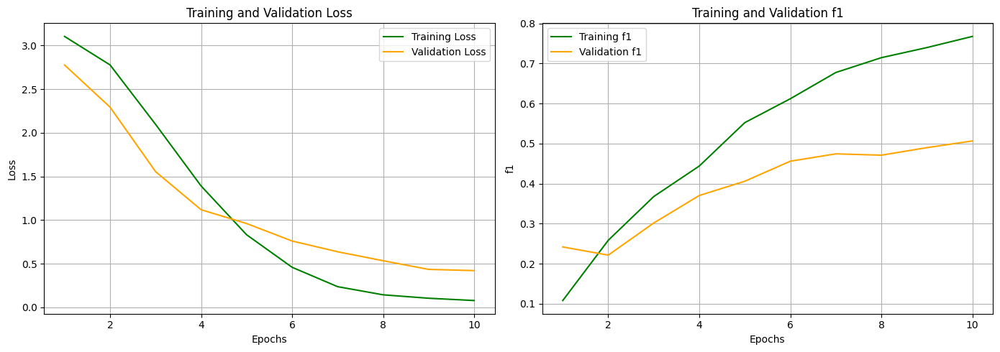

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - f1_score: 0.0530 - loss: 3.2193 - val_f1_score: 0.1920 - val_loss: 2.8446
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - f1_score: 0.2139 - loss: 2.6990 - val_f1_score: 0.2656 - val_loss: 2.0603
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3187 - loss: 2.5056 - val_f1_score: 0.2742 - val_loss: 1.7583
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3510 - loss: 1.7264 - val_f1_score: 0.3713 - val_loss: 1.3532
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4344 - loss: 0.8644 - val_f1_score: 0.3682 - val_loss: 1.2104
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4716 - loss: 0.4022 - val_f1_score: 0.4577 - val_loss: 1.0725
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.5372 - loss: 0.2982 - val_f1_score: 0.4738 - val_loss: 0.7804
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.6183 - loss: 0.1710 - val_f1_score: 0.4860 - val

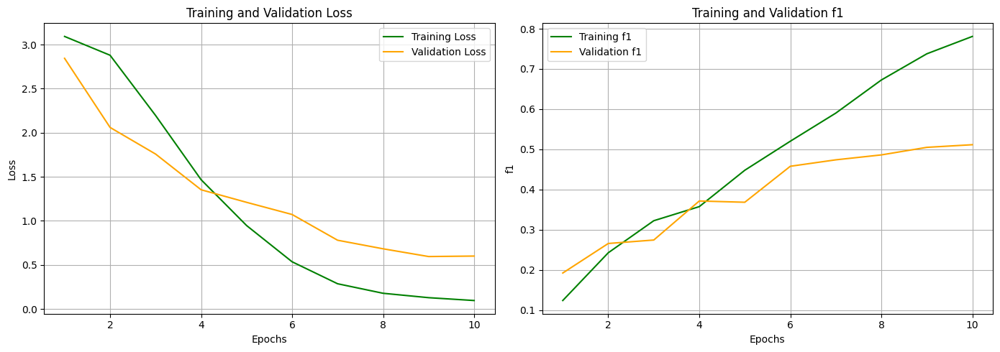

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - f1_score: 0.0801 - loss: 3.1727 - val_f1_score: 0.2799 - val_loss: 2.6661
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.3075 - loss: 2.4634 - val_f1_score: 0.3324 - val_loss: 1.9736
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.3996 - loss: 2.2203 - val_f1_score: 0.4150 - val_loss: 1.1948
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.5028 - loss: 1.2534 - val_f1_score: 0.4329 - val_loss: 0.9767
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - f1_score: 0.6032 - loss: 0.5404 - val_f1_score: 0.4819 - val_loss: 0.5979
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.6353 - loss: 0.2281 - val_f1_score: 0.5309 - val_loss: 0.7509
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - f1_score: 0.6829 - loss: 0.1335 - val_f1_score: 0.5591 - val_loss: 0.3755
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.7176 - loss: 0.0824 - val_f1_score: 0.574

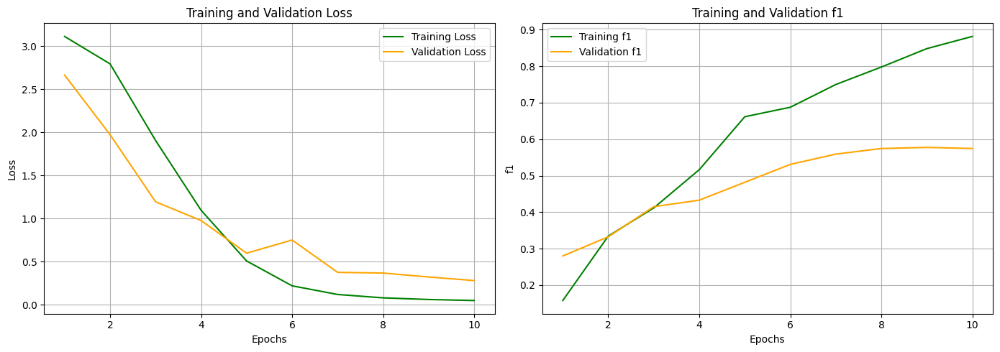

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - f1_score: 0.0691 - loss: 2.9862 - val_f1_score: 0.2154 - val_loss: 2.7185
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.2455 - loss: 2.6549 - val_f1_score: 0.2841 - val_loss: 2.1267
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.3495 - loss: 2.2365 - val_f1_score: 0.3431 - val_loss: 1.5353
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.4519 - loss: 1.3624 - val_f1_score: 0.4111 - val_loss: 1.0854
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - f1_score: 0.5244 - loss: 0.7131 - val_f1_score: 0.4400 - val_loss: 0.7065
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - f1_score: 0.6107 - loss: 0.2278 - val_f1_score: 0.4459 - val_loss: 0.7489
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.6316 - loss: 0.1204 - val_f1_score: 0.5026 - val_loss: 0.4709
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.7273 - loss: 0.0906 - val_f1_score: 0.547

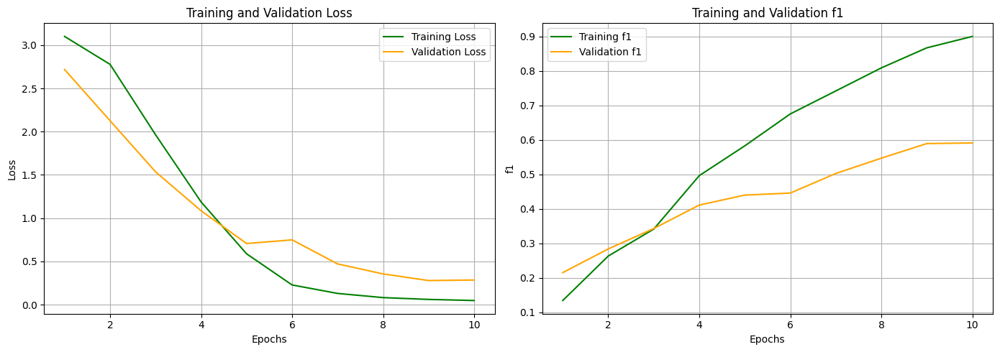

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - f1_score: 0.0328 - loss: 3.6845 - val_f1_score: 0.2563 - val_loss: 2.9342
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.2774 - loss: 2.9006 - val_f1_score: 0.2945 - val_loss: 2.3083
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.3663 - loss: 2.8017 - val_f1_score: 0.4023 - val_loss: 1.2079
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.4405 - loss: 1.2821 - val_f1_score: 0.5072 - val_loss: 0.8705
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.5875 - loss: 0.5594 - val_f1_score: 0.5177 - val_loss: 0.6328
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.6407 - loss: 0.2496 - val_f1_score: 0.5369 - val_loss: 0.5069
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - f1_score: 0.6283 - loss: 0.1350 - val_f1_score: 0.5823 - val_loss: 0.3682
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.7201 - loss: 0.0839 - val_f1_score: 0.586

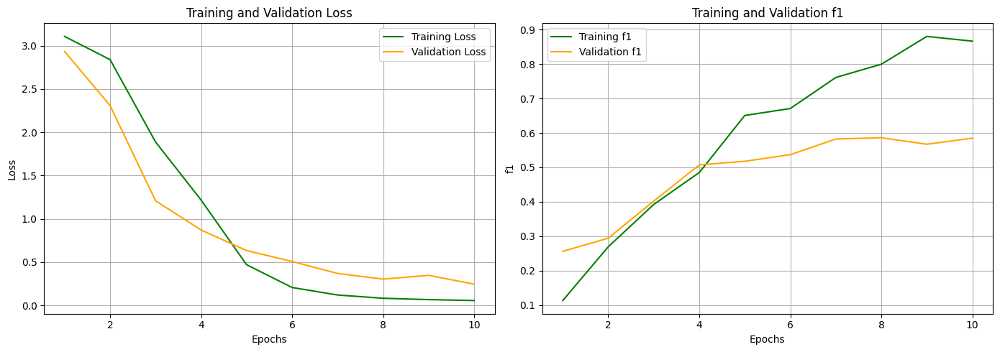

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - f1_score: 0.0338 - loss: 3.5047 - val_f1_score: 0.1829 - val_loss: 2.6335
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.2846 - loss: 2.5079 - val_f1_score: 0.3297 - val_loss: 1.9726
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - f1_score: 0.4223 - loss: 1.5552 - val_f1_score: 0.4812 - val_loss: 1.2800
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - f1_score: 0.5210 - loss: 1.0129 - val_f1_score: 0.5067 - val_loss: 0.7423
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - f1_score: 0.6283 - loss: 0.5859 - val_f1_score: 0.5614 - val_loss: 0.4920
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - f1_score: 0.6848 - loss: 0.1698 - val_f1_score: 0.5523 - val_loss: 0.4556
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.7486 - loss: 0.1047 - val_f1_score: 0.5678 - val_loss: 0.3521
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.7309 - loss: 0.0776 - val_f1_score: 0.585

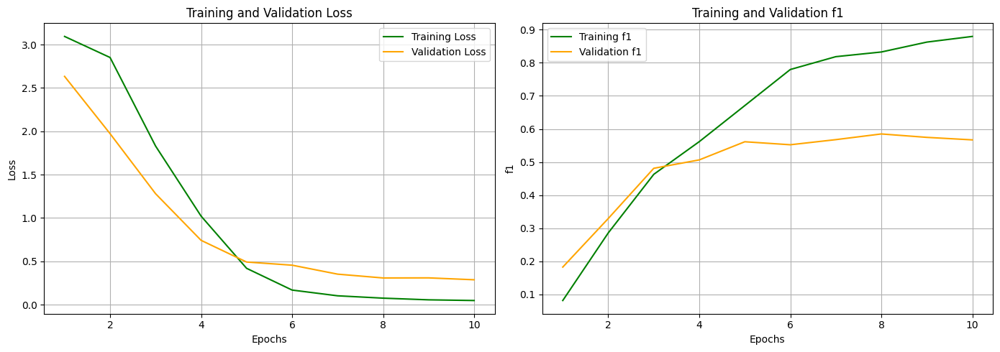

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - f1_score: 0.0783 - loss: 2.7718 - val_f1_score: 0.3069 - val_loss: 2.8103
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.3227 - loss: 2.1877 - val_f1_score: 0.3290 - val_loss: 2.2298
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - f1_score: 0.3693 - loss: 1.9532 - val_f1_score: 0.4067 - val_loss: 1.4099
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - f1_score: 0.4935 - loss: 1.2316 - val_f1_score: 0.4392 - val_loss: 0.8822
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - f1_score: 0.5568 - loss: 0.4254 - val_f1_score: 0.4744 - val_loss: 1.0168
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.5552 - loss: 0.2677 - val_f1_score: 0.5393 - val_loss: 0.5960
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - f1_score: 0.6479 - loss: 0.1199 - val_f1_score: 0.5766 - val_loss: 0.3865
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - f1_score: 0.7301 - loss: 0.0725 - val_f1_score: 0.593

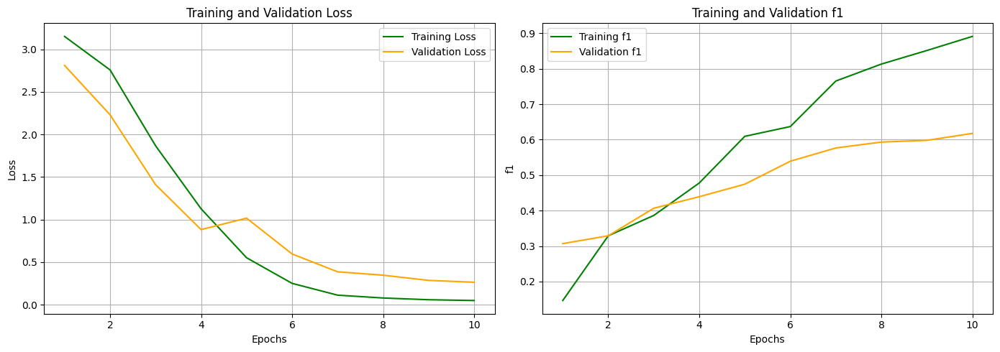

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - f1_score: 0.0594 - loss: 2.9773 - val_f1_score: 0.2541 - val_loss: 2.6469
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.2468 - loss: 2.3582 - val_f1_score: 0.2146 - val_loss: 2.3911
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - f1_score: 0.2932 - loss: 2.0478 - val_f1_score: 0.3687 - val_loss: 1.3675
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - f1_score: 0.4447 - loss: 0.8445 - val_f1_score: 0.4232 - val_loss: 1.4009
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - f1_score: 0.5646 - loss: 0.4887 - val_f1_score: 0.4748 - val_loss: 0.7527
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - f1_score: 0.6077 - loss: 0.1988 - val_f1_score: 0.5563 - val_loss: 0.5523
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - f1_score: 0.6870 - loss: 0.0968 - val_f1_score: 0.5644 - val_loss: 0.4403
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - f1_score: 0.7415 - loss: 0.0661 - val_f1_score: 0.579

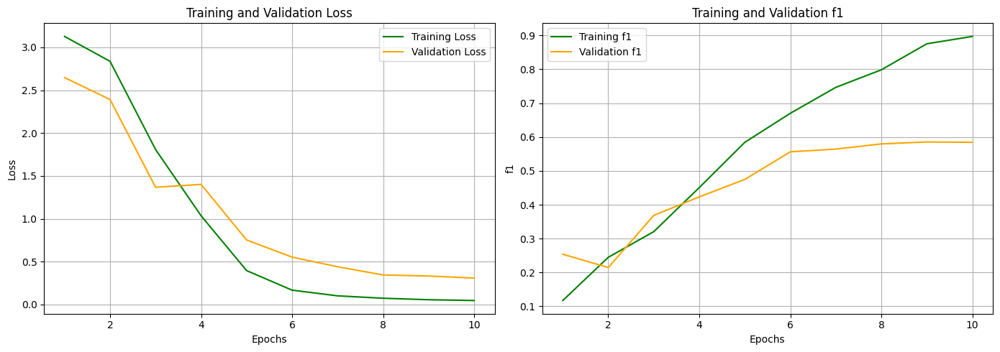

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - f1_score: 0.0495 - loss: 2.9020 - val_f1_score: 0.2372 - val_loss: 2.6635
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - f1_score: 0.2820 - loss: 2.3052 - val_f1_score: 0.2528 - val_loss: 2.4260
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.4135 - loss: 2.3812 - val_f1_score: 0.3221 - val_loss: 1.4632
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - f1_score: 0.4123 - loss: 0.8761 - val_f1_score: 0.4420 - val_loss: 1.1737
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - f1_score: 0.5121 - loss: 0.5099 - val_f1_score: 0.5127 - val_loss: 0.7618
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - f1_score: 0.5781 - loss: 0.2374 - val_f1_score: 0.5379 - val_loss: 0.6761
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - f1_score: 0.6595 - loss: 0.1332 - val_f1_score: 0.5682 - val_loss: 0.4307
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - f1_score: 0.6636 - loss: 0.0763 - val_f1_score: 0.587

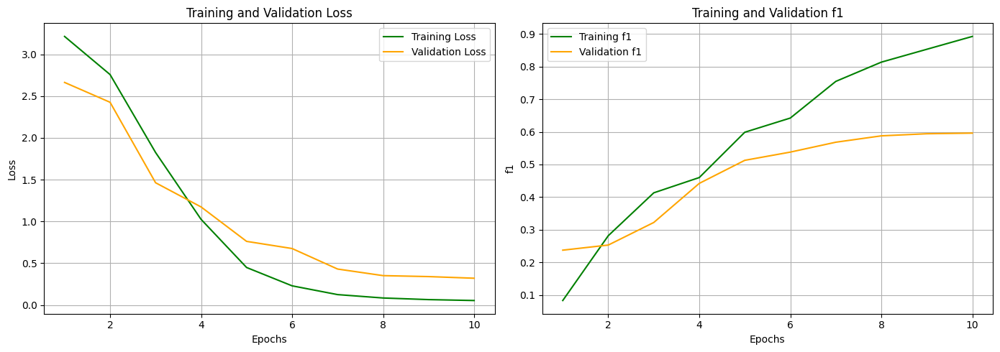

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - f1_score: 0.0403 - loss: 3.2697 - val_f1_score: 0.1827 - val_loss: 2.9062
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - f1_score: 0.2262 - loss: 2.4751 - val_f1_score: 0.2883 - val_loss: 2.2244
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - f1_score: 0.3592 - loss: 1.7975 - val_f1_score: 0.3909 - val_loss: 1.4174
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - f1_score: 0.4457 - loss: 0.8524 - val_f1_score: 0.5063 - val_loss: 0.8477
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.5954 - loss: 0.5374 - val_f1_score: 0.5425 - val_loss: 0.6221
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.6054 - loss: 0.1289 - val_f1_score: 0.5771 - val_loss: 0.4495
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - f1_score: 0.6708 - loss: 0.0885 - val_f1_score: 0.6036 - val_loss: 0.3370
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - f1_score: 0.7140 - loss: 0.0668 - val_f1_score: 0.605

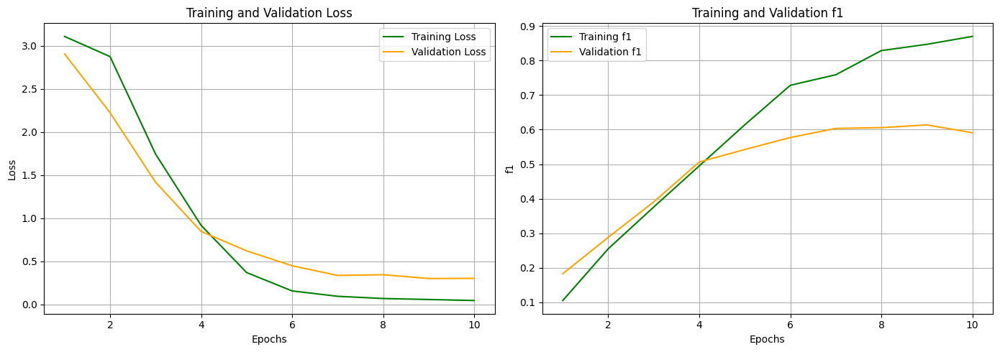

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - f1_score: 0.0204 - loss: 3.2490 - val_f1_score: 0.1843 - val_loss: 2.9090
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.2362 - loss: 2.9425 - val_f1_score: 0.3060 - val_loss: 2.1579
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - f1_score: 0.3803 - loss: 2.0143 - val_f1_score: 0.4749 - val_loss: 1.0984
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - f1_score: 0.4648 - loss: 1.0760 - val_f1_score: 0.4990 - val_loss: 0.6684
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - f1_score: 0.5893 - loss: 0.3641 - val_f1_score: 0.5210 - val_loss: 0.4767
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.6693 - loss: 0.1392 - val_f1_score: 0.5769 - val_loss: 0.3884
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - f1_score: 0.6900 - loss: 0.0823 - val_f1_score: 0.5969 - val_loss: 0.2925
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - f1_score: 0.7449 - loss: 0.0619 - val_f1_score: 0.625

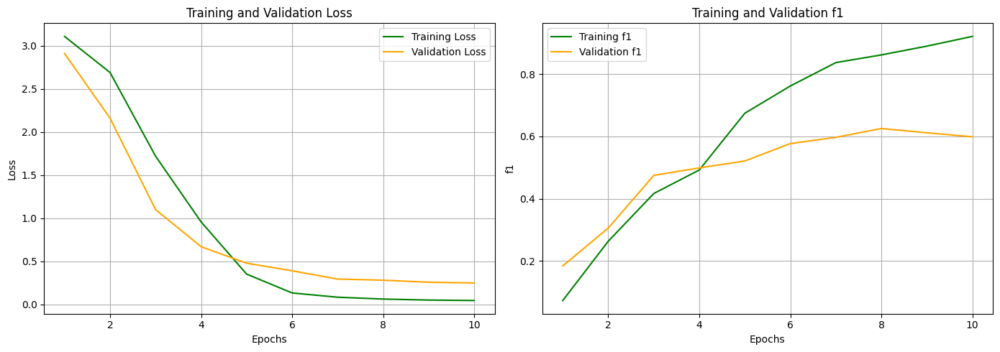

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - f1_score: 0.0527 - loss: 3.4301 - val_f1_score: 0.1533 - val_loss: 2.7670
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - f1_score: 0.2007 - loss: 2.6123 - val_f1_score: 0.2587 - val_loss: 2.2940
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.3258 - loss: 2.0866 - val_f1_score: 0.2298 - val_loss: 1.9076
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - f1_score: 0.4038 - loss: 1.3444 - val_f1_score: 0.3942 - val_loss: 1.1313
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - f1_score: 0.4982 - loss: 0.6127 - val_f1_score: 0.4451 - val_loss: 0.9917
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - f1_score: 0.5836 - loss: 0.2219 - val_f1_score: 0.4976 - val_loss: 0.5311
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - f1_score: 0.6182 - loss: 0.1279 - val_f1_score: 0.5771 - val_loss: 0.3967
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - f1_score: 0.7251 - loss: 0.0862 - val_f1_score: 0.584

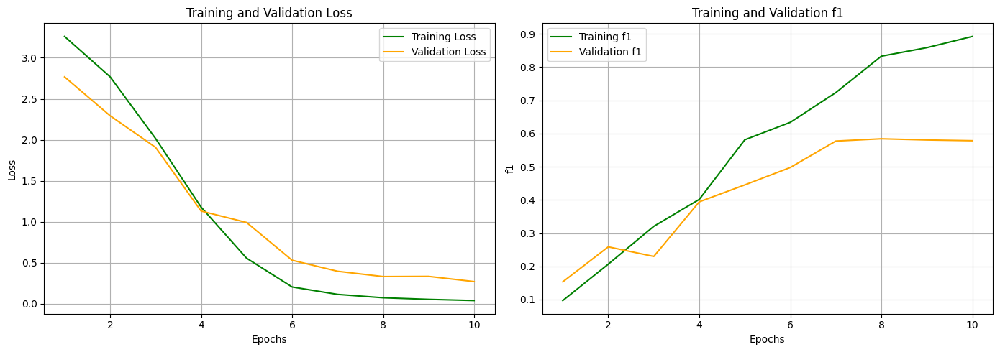

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


In [52]:
# Ejemplo de configuraciones de capas convolucionales
conv_layers_experiments = [
    [{'filters': 32, 'kernel_size': 3, 'pooling': 'max'}],
    [{'filters': 128, 'kernel_size': 3, 'pooling': 'max'}],
    [{'filters': 256, 'kernel_size': 3, 'pooling': 'max'}]
]

# Ejecutar los experimentos
results = []

for conv_config in conv_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(conv_layers_config=conv_config,epochs=10)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.6374652726058958
Experiment 1 Macro avg F1 std:  0.04064176649674396
Experiment 1 Accuracy mean:  0.8746666666666666
Experiment 1 Accuracy std:  0.030658614079634307
Experiment 2 Macro avg F1 mean:  0.7596957333195868
Experiment 2 Macro avg F1 std:  0.022527827773520064
Experiment 2 Accuracy mean:  0.9322222222222221
Experiment 2 Accuracy std:  0.0022222222222222365
Experiment 3 Macro avg F1 mean:  0.7461629048952821
Experiment 3 Macro avg F1 std:  0.022393008507583346
Experiment 3 Accuracy mean:  0.9266666666666667
Experiment 3 Accuracy std:  0.00444444444444444


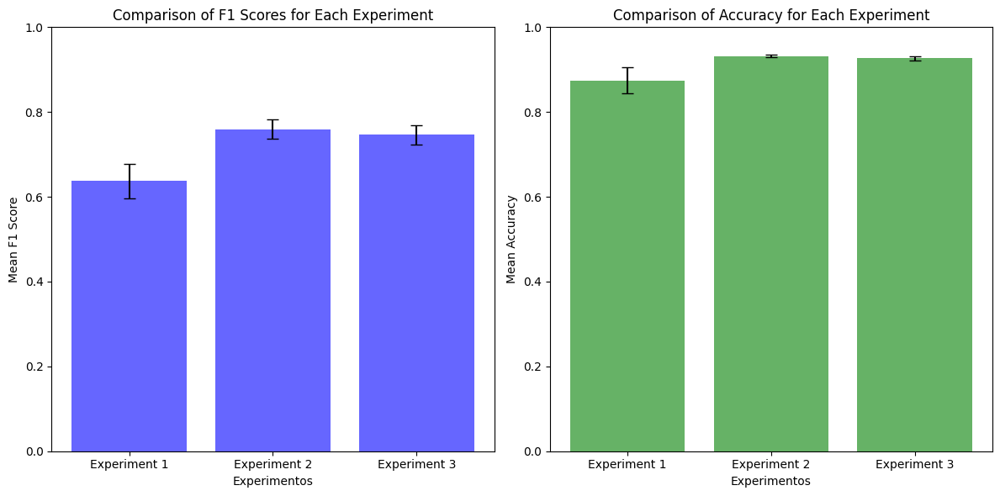

In [53]:
plot_experiment_metrics(results)

#### Número de Capes Convolucionals

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - f1_score: 0.0158 - loss: 3.5737 - val_f1_score: 0.0379 - val_loss: 2.5627
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - f1_score: 0.0771 - loss: 2.7225 - val_f1_score: 0.1593 - val_loss: 1.9347
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.1567 - loss: 2.3398 - val_f1_score: 0.2390 - val_loss: 1.5479
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - f1_score: 0.3060 - loss: 2.0505 - val_f1_score: 0.3263 - val_loss: 1.0374
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.3864 - loss: 0.8742 - val_f1_score: 0.3861 - val_loss: 0.9589


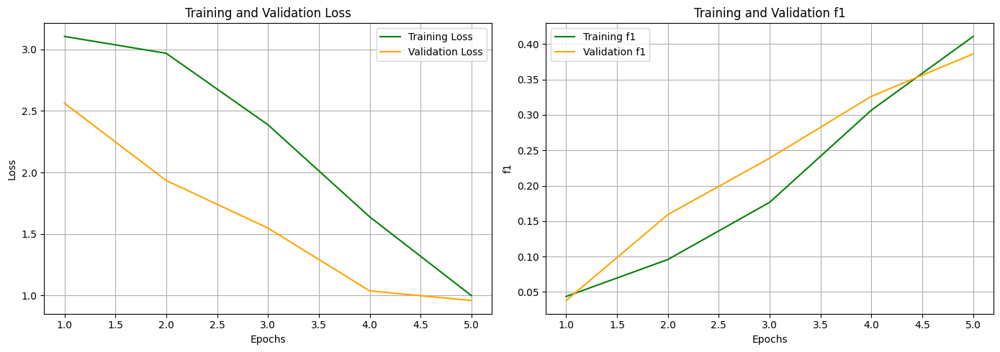

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step - f1_score: 0.0213 - loss: 3.2727 - val_f1_score: 0.0731 - val_loss: 2.5261
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - f1_score: 0.0775 - loss: 3.4432 - val_f1_score: 0.0943 - val_loss: 2.1381
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.1935 - loss: 2.1934 - val_f1_score: 0.2294 - val_loss: 1.4726
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.2987 - loss: 1.4145 - val_f1_score: 0.3531 - val_loss: 1.0073
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - f1_score: 0.4196 - loss: 0.7851 - val_f1_score: 0.3845 - val_loss: 0.8736


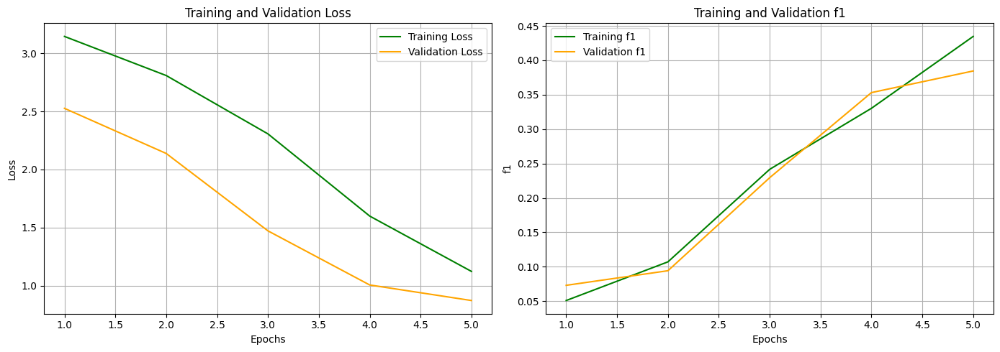

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - f1_score: 0.0321 - loss: 3.3675 - val_f1_score: 0.0896 - val_loss: 2.6346
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.1245 - loss: 3.3148 - val_f1_score: 0.1321 - val_loss: 2.0370
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.1854 - loss: 2.0687 - val_f1_score: 0.1730 - val_loss: 2.0357
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.2695 - loss: 1.6169 - val_f1_score: 0.3519 - val_loss: 1.3178
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - f1_score: 0.3882 - loss: 0.9171 - val_f1_score: 0.4304 - val_loss: 0.6756


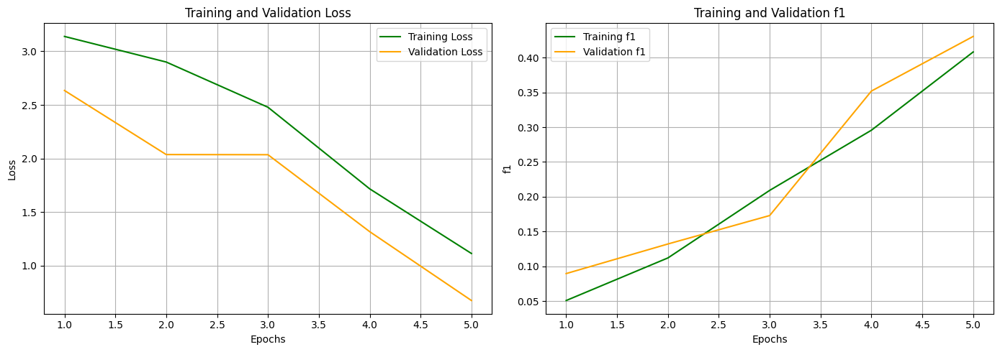

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - f1_score: 0.0123 - loss: 3.0375 - val_f1_score: 0.0596 - val_loss: 2.6357
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - f1_score: 0.0862 - loss: 2.8219 - val_f1_score: 0.1255 - val_loss: 2.0088
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.1814 - loss: 2.2295 - val_f1_score: 0.1799 - val_loss: 2.1889
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.2801 - loss: 1.9082 - val_f1_score: 0.3315 - val_loss: 1.3396
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.4157 - loss: 1.1403 - val_f1_score: 0.3533 - val_loss: 1.0645


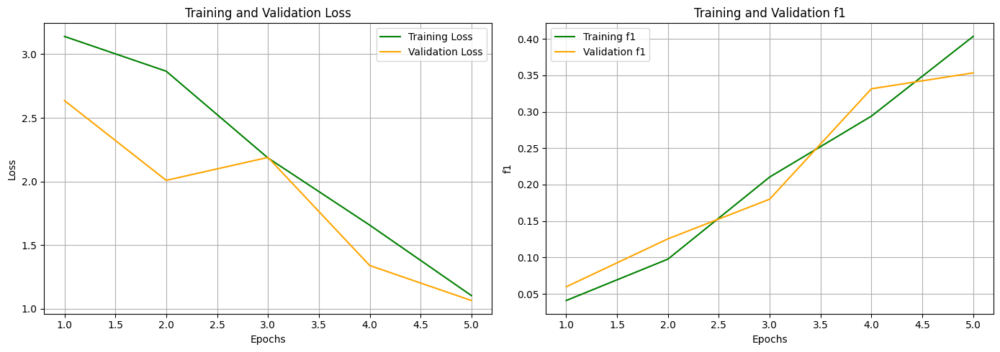

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 51ms/step - f1_score: 0.0141 - loss: 3.0298 - val_f1_score: 0.0817 - val_loss: 3.0029
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.0898 - loss: 2.9670 - val_f1_score: 0.1144 - val_loss: 2.2170
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - f1_score: 0.1533 - loss: 2.7370 - val_f1_score: 0.2397 - val_loss: 1.8225
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - f1_score: 0.2723 - loss: 1.5813 - val_f1_score: 0.3522 - val_loss: 1.1560
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.3729 - loss: 1.6633 - val_f1_score: 0.3764 - val_loss: 1.0965


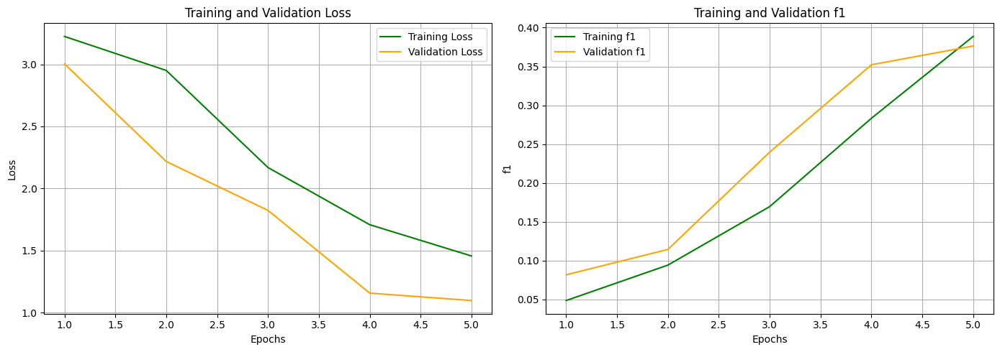

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - f1_score: 0.0069 - loss: 3.4829 - val_f1_score: 0.0050 - val_loss: 2.2561
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - f1_score: 0.0588 - loss: 3.2427 - val_f1_score: 0.0682 - val_loss: 2.3063
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - f1_score: 0.0658 - loss: 3.1153 - val_f1_score: 0.0957 - val_loss: 2.2113
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - f1_score: 0.0992 - loss: 2.3256 - val_f1_score: 0.0753 - val_loss: 2.7214
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - f1_score: 0.1014 - loss: 2.6115 - val_f1_score: 0.1571 - val_loss: 1.5702


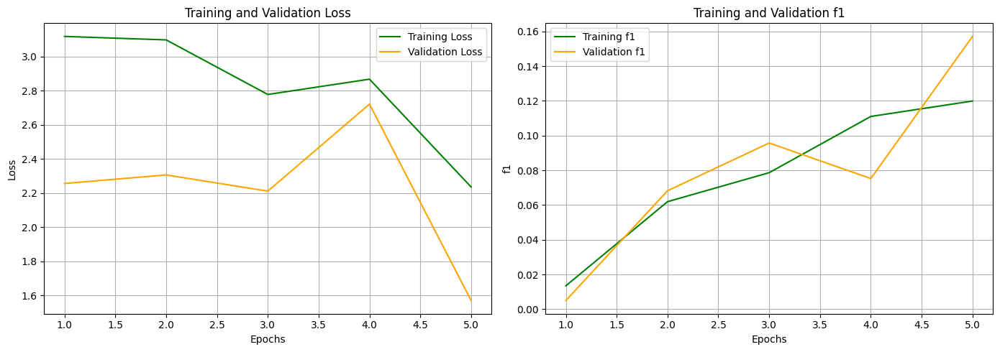

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step - f1_score: 0.0047 - loss: 2.8504 - val_f1_score: 0.0531 - val_loss: 2.8552
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - f1_score: 0.0653 - loss: 3.5530 - val_f1_score: 0.0256 - val_loss: 2.7642
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - f1_score: 0.0421 - loss: 2.3458 - val_f1_score: 0.0568 - val_loss: 2.3706
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step - f1_score: 0.0813 - loss: 2.4528 - val_f1_score: 0.1130 - val_loss: 2.1130
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - f1_score: 0.1749 - loss: 1.8085 - val_f1_score: 0.1119 - val_loss: 2.0914


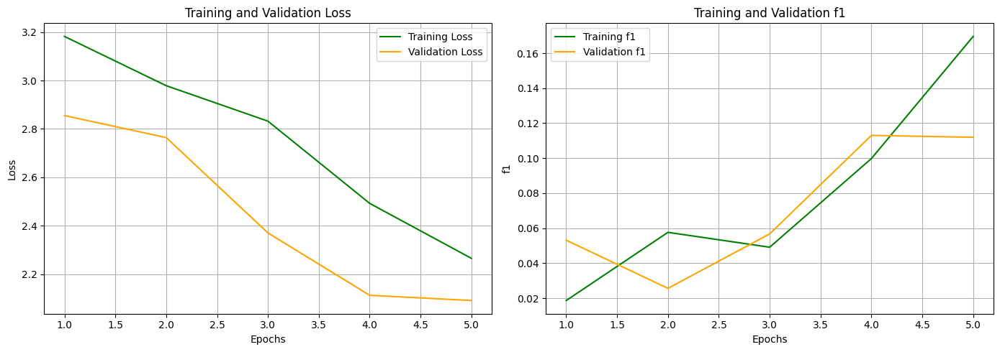

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 72ms/step - f1_score: 0.0064 - loss: 3.2743 - val_f1_score: 0.0168 - val_loss: 3.0084
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - f1_score: 0.0193 - loss: 2.5575 - val_f1_score: 0.0392 - val_loss: 2.5078
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - f1_score: 0.0546 - loss: 2.6204 - val_f1_score: 0.0390 - val_loss: 2.3491
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - f1_score: 0.0746 - loss: 2.8240 - val_f1_score: 0.1116 - val_loss: 2.1372
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - f1_score: 0.1448 - loss: 1.8995 - val_f1_score: 0.1089 - val_loss: 1.6108


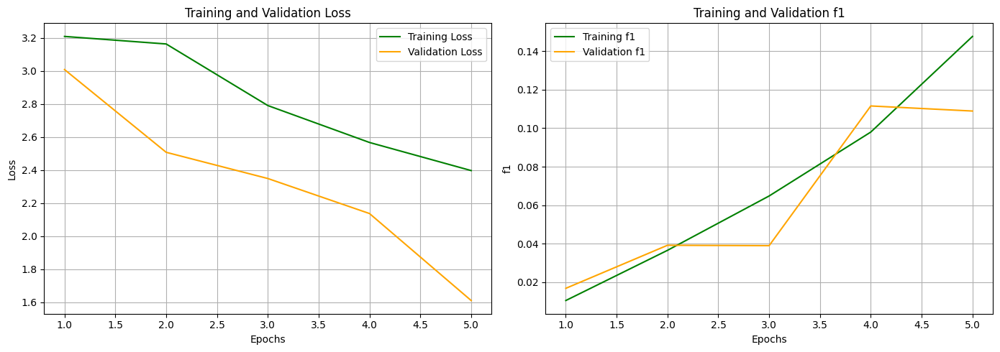

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - f1_score: 0.0026 - loss: 3.4142 - val_f1_score: 0.0363 - val_loss: 2.8302
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - f1_score: 0.0294 - loss: 3.3333 - val_f1_score: 0.0633 - val_loss: 2.8080
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - f1_score: 0.0657 - loss: 2.7019 - val_f1_score: 0.0741 - val_loss: 2.2656
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.1069 - loss: 2.2736 - val_f1_score: 0.1088 - val_loss: 2.2593
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step - f1_score: 0.1598 - loss: 2.3324 - val_f1_score: 0.1558 - val_loss: 2.2168


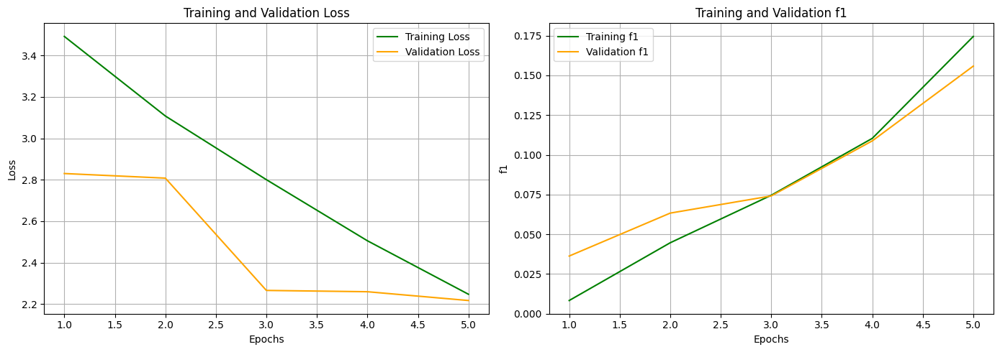

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - f1_score: 0.0238 - loss: 3.8138 - val_f1_score: 0.0047 - val_loss: 2.7143
Epoch 2/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - f1_score: 0.0301 - loss: 2.9692 - val_f1_score: 0.0598 - val_loss: 2.2766
Epoch 3/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - f1_score: 0.0484 - loss: 2.7372 - val_f1_score: 0.0357 - val_loss: 2.2717
Epoch 4/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - f1_score: 0.0662 - loss: 2.3142 - val_f1_score: 0.1321 - val_loss: 1.9130
Epoch 5/5
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - f1_score: 0.1443 - loss: 2.6239 - val_f1_score: 0.1353 - val_loss: 2.4703


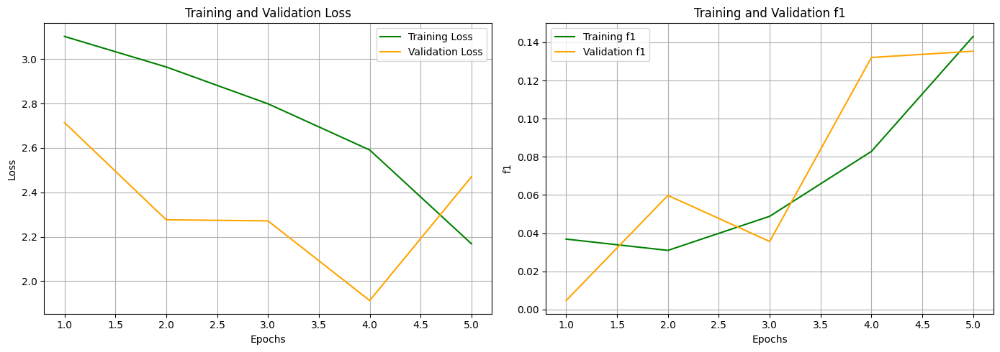

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


In [54]:
# Ejemplo de configuraciones de capas convolucionales
conv_layers_experiments = [
    [{'filters': 256, 'kernel_size': 3, 'pooling': 'max'},{'filters': 256, 'kernel_size': 3, 'pooling': 'max'}]
    ]

# Ejecutar los experimentos
results = []

for conv_config in conv_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(conv_layers_config=conv_config,epochs=10)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.47318636085966065
Experiment 1 Macro avg F1 std:  0.04382721030310167
Experiment 1 Accuracy mean:  0.7066666666666668
Experiment 1 Accuracy std:  0.06638458842417351
Experiment 2 Macro avg F1 mean:  0.16739589792795798
Experiment 2 Macro avg F1 std:  0.026308894590678495
Experiment 2 Accuracy mean:  0.2717777777777778
Experiment 2 Accuracy std:  0.1522126517672716


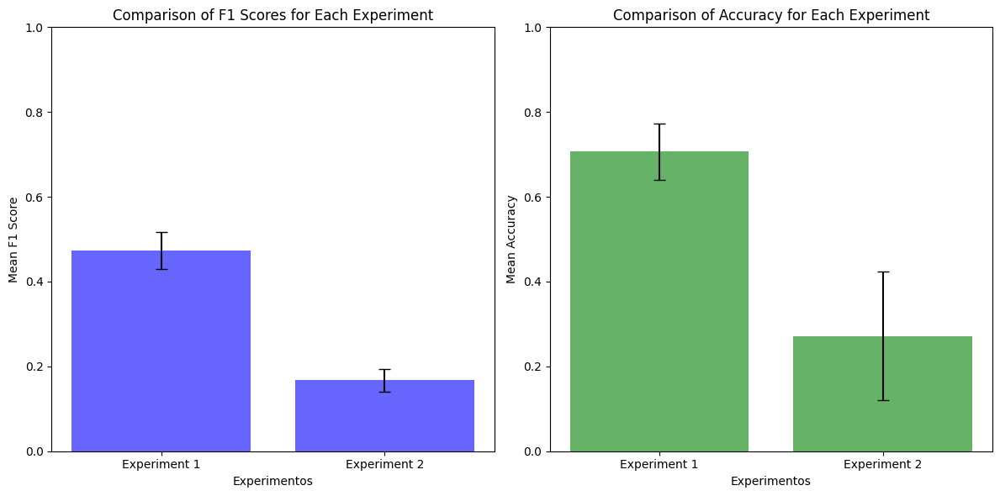

In [55]:
plot_experiment_metrics(results)

#### Provar diferents kernel size

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - f1_score: 0.0766 - loss: 3.0263 - val_f1_score: 0.2396 - val_loss: 2.6881
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - f1_score: 0.2555 - loss: 2.4540 - val_f1_score: 0.2378 - val_loss: 2.1665
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - f1_score: 0.3909 - loss: 2.0021 - val_f1_score: 0.3955 - val_loss: 1.0928
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - f1_score: 0.4210 - loss: 0.9377 - val_f1_score: 0.4261 - val_loss: 1.1270
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.5753 - loss: 0.5848 - val_f1_score: 0.5438 - val_loss: 0.6472
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.6344 - loss: 0.1922 - val_f1_score: 0.5059 - val_loss: 0.5103
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.6530 - loss: 0.1159 - val_f1_score: 0.5731 - val_loss: 0.3841
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - f1_score: 0.6671 - loss: 0.0676 - val_f1_score: 0.599

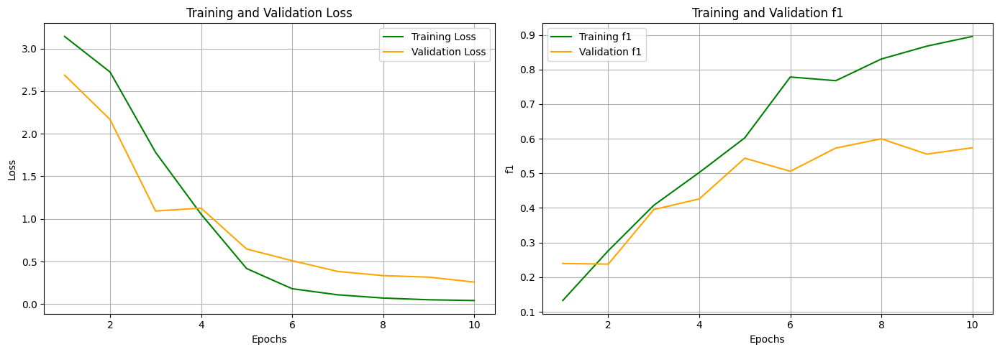

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - f1_score: 0.0724 - loss: 2.7194 - val_f1_score: 0.2123 - val_loss: 2.6276
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - f1_score: 0.2968 - loss: 2.7062 - val_f1_score: 0.3244 - val_loss: 1.9915
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - f1_score: 0.4456 - loss: 2.5309 - val_f1_score: 0.3798 - val_loss: 1.3400
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.4709 - loss: 1.1904 - val_f1_score: 0.4134 - val_loss: 1.0698
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - f1_score: 0.5611 - loss: 0.5035 - val_f1_score: 0.5100 - val_loss: 0.6763
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - f1_score: 0.6557 - loss: 0.1750 - val_f1_score: 0.5533 - val_loss: 0.4730
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - f1_score: 0.7078 - loss: 0.1010 - val_f1_score: 0.5894 - val_loss: 0.4255
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - f1_score: 0.6784 - loss: 0.0642 - val_f1_score: 0.605

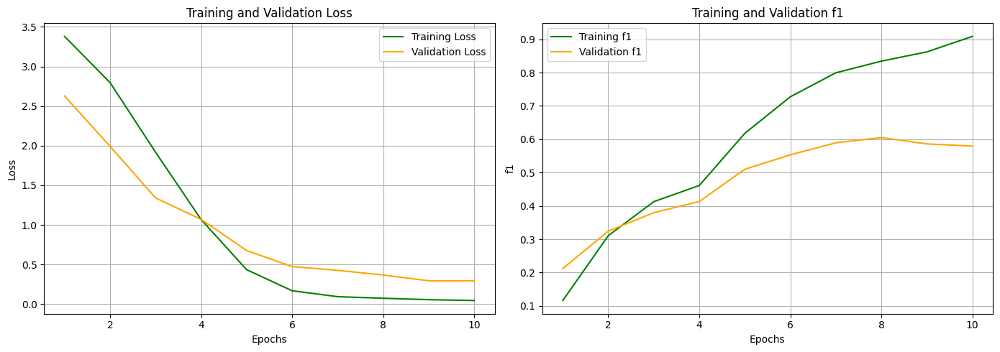

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.0369 - loss: 3.9121 - val_f1_score: 0.1628 - val_loss: 2.7388
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.2170 - loss: 2.3617 - val_f1_score: 0.2210 - val_loss: 2.4400
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - f1_score: 0.3490 - loss: 2.5116 - val_f1_score: 0.3433 - val_loss: 1.4423
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - f1_score: 0.4155 - loss: 1.2130 - val_f1_score: 0.4599 - val_loss: 1.0225
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.5767 - loss: 0.5011 - val_f1_score: 0.4867 - val_loss: 0.6215
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - f1_score: 0.6006 - loss: 0.1717 - val_f1_score: 0.5444 - val_loss: 0.3999
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - f1_score: 0.6378 - loss: 0.1347 - val_f1_score: 0.5604 - val_loss: 0.3850
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.7812 - loss: 0.0607 - val_f1_score: 0.611

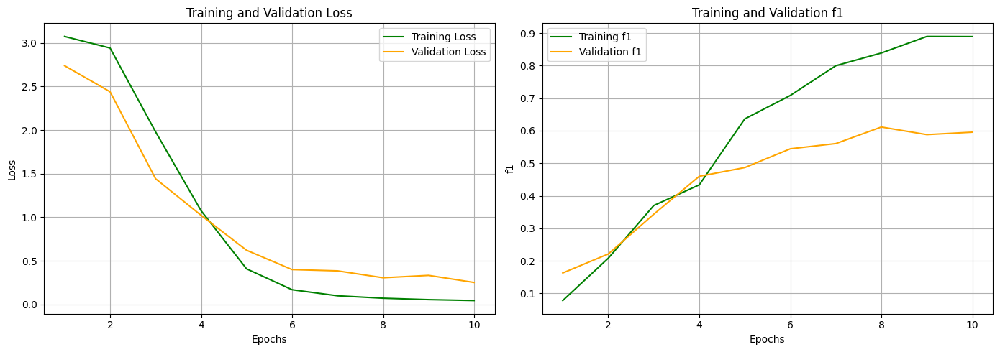

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - f1_score: 0.0261 - loss: 2.7395 - val_f1_score: 0.2103 - val_loss: 2.8144
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - f1_score: 0.2541 - loss: 2.5719 - val_f1_score: 0.2276 - val_loss: 2.1527
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.3276 - loss: 1.6196 - val_f1_score: 0.3237 - val_loss: 1.4352
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - f1_score: 0.4846 - loss: 1.0898 - val_f1_score: 0.4708 - val_loss: 0.9648
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - f1_score: 0.5861 - loss: 0.3459 - val_f1_score: 0.5147 - val_loss: 0.7039
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.6179 - loss: 0.2323 - val_f1_score: 0.5317 - val_loss: 0.4516
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - f1_score: 0.6648 - loss: 0.0945 - val_f1_score: 0.5814 - val_loss: 0.3653
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.7142 - loss: 0.0545 - val_f1_score: 0.571

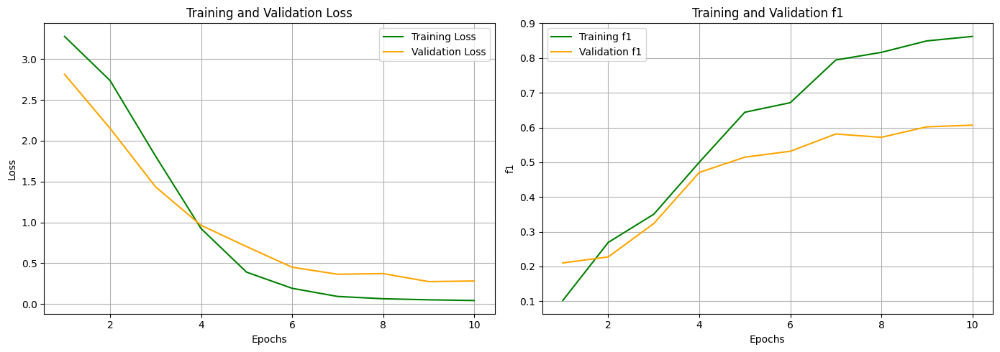

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - f1_score: 0.0531 - loss: 3.1169 - val_f1_score: 0.2144 - val_loss: 2.6071
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - f1_score: 0.2613 - loss: 2.8270 - val_f1_score: 0.3191 - val_loss: 1.9646
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.3837 - loss: 1.9822 - val_f1_score: 0.4365 - val_loss: 1.2092
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - f1_score: 0.5198 - loss: 0.8213 - val_f1_score: 0.4672 - val_loss: 0.9048
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.5231 - loss: 0.3821 - val_f1_score: 0.5195 - val_loss: 0.6387
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.5856 - loss: 0.1702 - val_f1_score: 0.5578 - val_loss: 0.4187
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - f1_score: 0.7036 - loss: 0.0973 - val_f1_score: 0.5594 - val_loss: 0.4260
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.7157 - loss: 0.0714 - val_f1_score: 0.589

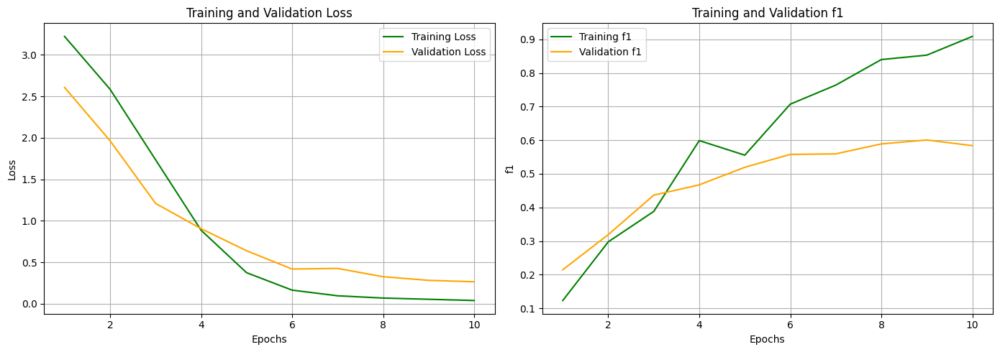

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - f1_score: 0.0526 - loss: 3.6252 - val_f1_score: 0.2429 - val_loss: 2.7656
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - f1_score: 0.2671 - loss: 3.5561 - val_f1_score: 0.2555 - val_loss: 2.0858
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.3286 - loss: 2.0823 - val_f1_score: 0.3903 - val_loss: 1.4002
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.4420 - loss: 1.0123 - val_f1_score: 0.4418 - val_loss: 1.0314
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.5481 - loss: 0.6277 - val_f1_score: 0.4661 - val_loss: 0.7663
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.6374 - loss: 0.1415 - val_f1_score: 0.5762 - val_loss: 0.4523
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.7588 - loss: 0.1035 - val_f1_score: 0.5875 - val_loss: 0.3995
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.7560 - loss: 0.0516 - val_f1_score: 0.6

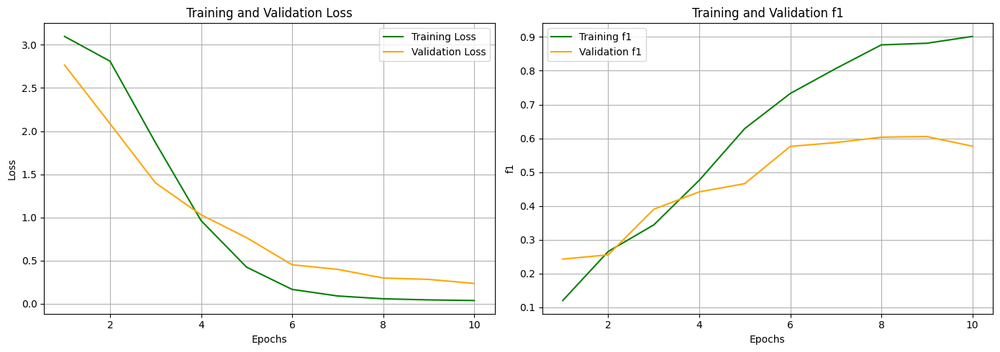

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - f1_score: 0.0253 - loss: 3.4509 - val_f1_score: 0.1488 - val_loss: 2.9565
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.2022 - loss: 2.7884 - val_f1_score: 0.2522 - val_loss: 2.2578
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.3425 - loss: 1.7226 - val_f1_score: 0.3284 - val_loss: 1.4081
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.4334 - loss: 0.9712 - val_f1_score: 0.3825 - val_loss: 1.0345
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.5411 - loss: 0.3814 - val_f1_score: 0.4934 - val_loss: 0.6088
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.6121 - loss: 0.1813 - val_f1_score: 0.5014 - val_loss: 0.4623
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - f1_score: 0.6593 - loss: 0.0902 - val_f1_score: 0.5399 - val_loss: 0.3351
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - f1_score: 0.7033 - loss: 0.0805 - val_f1_score: 0.539

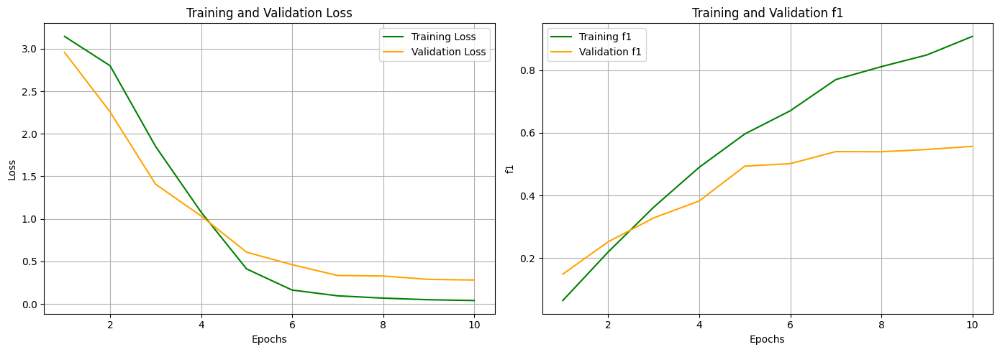

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - f1_score: 0.0368 - loss: 2.8422 - val_f1_score: 0.2819 - val_loss: 2.7914
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - f1_score: 0.2418 - loss: 2.7120 - val_f1_score: 0.3012 - val_loss: 1.7326
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.3366 - loss: 1.3840 - val_f1_score: 0.3381 - val_loss: 1.6346
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - f1_score: 0.4443 - loss: 1.3389 - val_f1_score: 0.3936 - val_loss: 1.2760
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - f1_score: 0.6029 - loss: 0.2973 - val_f1_score: 0.5071 - val_loss: 0.6116
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - f1_score: 0.6023 - loss: 0.3303 - val_f1_score: 0.5351 - val_loss: 0.4179
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - f1_score: 0.7068 - loss: 0.1074 - val_f1_score: 0.5331 - val_loss: 0.3868
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.7451 - loss: 0.0809 - val_f1_score: 0.5

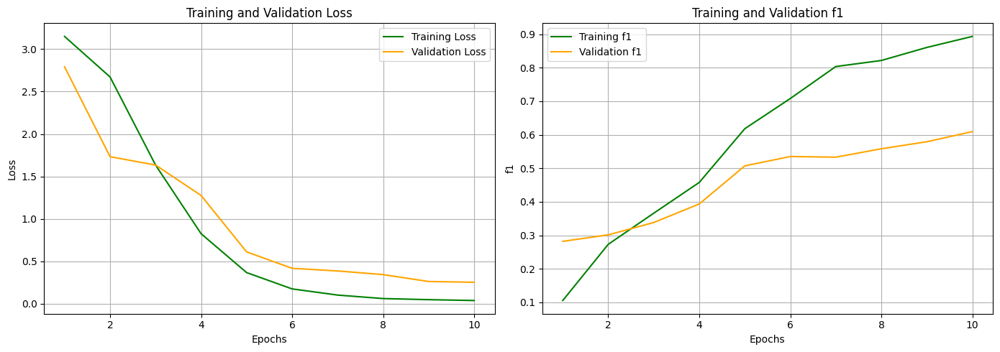

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - f1_score: 0.0290 - loss: 3.0535 - val_f1_score: 0.1343 - val_loss: 2.7347
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.1547 - loss: 2.7259 - val_f1_score: 0.2254 - val_loss: 2.0980
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.3568 - loss: 1.7394 - val_f1_score: 0.3563 - val_loss: 1.4821
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - f1_score: 0.4780 - loss: 1.0665 - val_f1_score: 0.4316 - val_loss: 1.1837
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step - f1_score: 0.5125 - loss: 0.3531 - val_f1_score: 0.4670 - val_loss: 0.8728
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.5909 - loss: 0.1872 - val_f1_score: 0.5149 - val_loss: 0.5247
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.6897 - loss: 0.1014 - val_f1_score: 0.5666 - val_loss: 0.4344
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 46ms/step - f1_score: 0.7275 - loss: 0.0763 - val_f1_score: 0.57

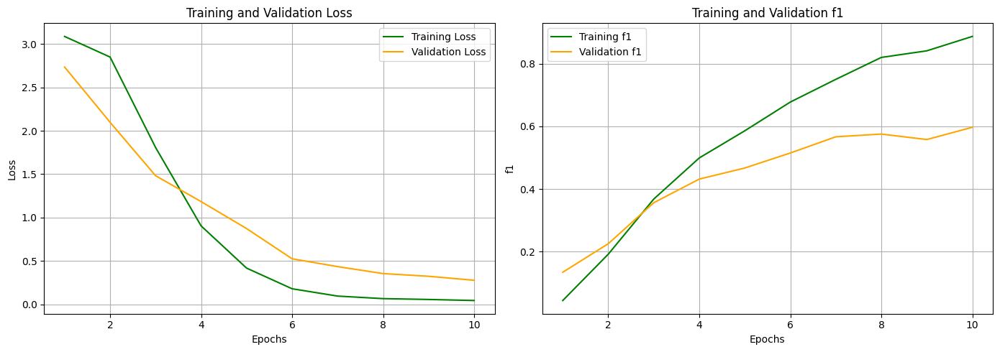

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - f1_score: 0.0176 - loss: 3.7469 - val_f1_score: 0.1518 - val_loss: 2.7546
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - f1_score: 0.1818 - loss: 2.6164 - val_f1_score: 0.2064 - val_loss: 2.2261
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.2948 - loss: 1.7407 - val_f1_score: 0.4309 - val_loss: 1.4060
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.4806 - loss: 1.0012 - val_f1_score: 0.3701 - val_loss: 1.2087
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.5262 - loss: 0.4845 - val_f1_score: 0.5014 - val_loss: 0.6043
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.6567 - loss: 0.1592 - val_f1_score: 0.5087 - val_loss: 0.4461
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.7082 - loss: 0.1319 - val_f1_score: 0.5657 - val_loss: 0.3455
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - f1_score: 0.7187 - loss: 0.0607 - val_f1_score: 0.572

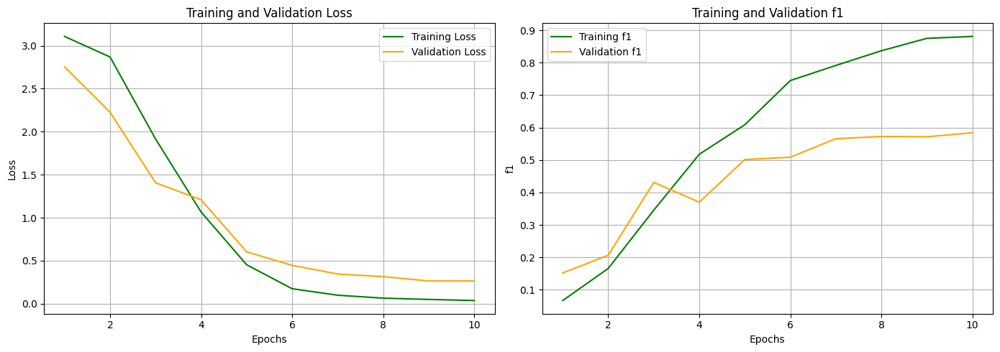

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - f1_score: 0.0193 - loss: 3.0072 - val_f1_score: 0.1799 - val_loss: 2.8130
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.2209 - loss: 3.4713 - val_f1_score: 0.2157 - val_loss: 1.9628
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.3376 - loss: 1.9421 - val_f1_score: 0.3592 - val_loss: 1.5844
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - f1_score: 0.4587 - loss: 1.0699 - val_f1_score: 0.4090 - val_loss: 0.8428
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.5298 - loss: 0.3722 - val_f1_score: 0.4874 - val_loss: 0.7027
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.7211 - loss: 0.1502 - val_f1_score: 0.5145 - val_loss: 0.5270
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - f1_score: 0.7152 - loss: 0.1174 - val_f1_score: 0.4812 - val_loss: 0.3271
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - f1_score: 0.7486 - loss: 0.0916 - val_f

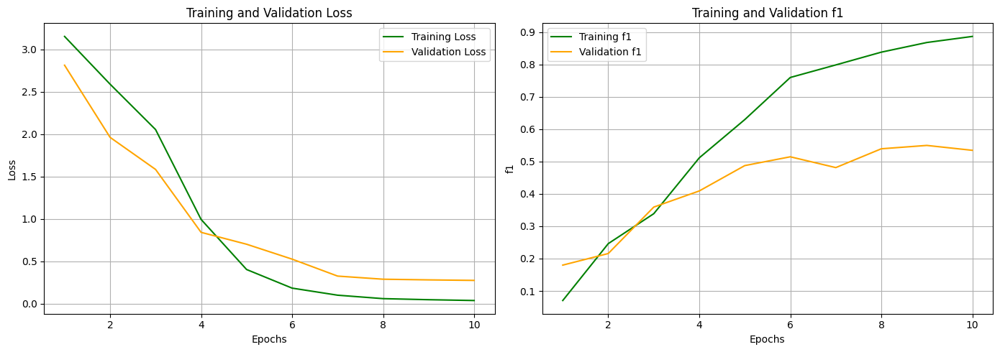

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - f1_score: 0.0216 - loss: 3.2475 - val_f1_score: 0.1268 - val_loss: 2.9171
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 69ms/step - f1_score: 0.1853 - loss: 2.9965 - val_f1_score: 0.2574 - val_loss: 2.0913
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 70ms/step - f1_score: 0.2971 - loss: 1.9220 - val_f1_score: 0.3382 - val_loss: 1.5171
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.4132 - loss: 1.0693 - val_f1_score: 0.4070 - val_loss: 1.0997
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - f1_score: 0.5580 - loss: 0.2914 - val_f1_score: 0.4855 - val_loss: 0.6836
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 82ms/step - f1_score: 0.6412 - loss: 0.1574 - val_f1_score: 0.5142 - val_loss: 0.5924
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step - f1_score: 0.6974 - loss: 0.0822 - val_f1_score: 0.5317 - val_loss: 0.4677
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - f1_score: 0.7361 - loss: 0.0603 - val_f1_score

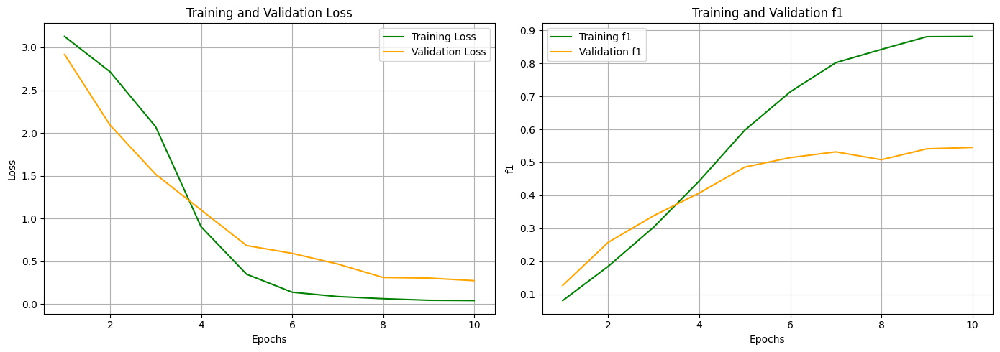

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - f1_score: 0.0246 - loss: 3.3464 - val_f1_score: 0.1128 - val_loss: 2.8870
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.1774 - loss: 2.9382 - val_f1_score: 0.2022 - val_loss: 2.1953
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - f1_score: 0.3280 - loss: 1.5230 - val_f1_score: 0.3520 - val_loss: 1.5029
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.4751 - loss: 0.9876 - val_f1_score: 0.4369 - val_loss: 0.7547
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.5610 - loss: 0.3401 - val_f1_score: 0.4692 - val_loss: 0.7019
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.5760 - loss: 0.1598 - val_f1_score: 0.4862 - val_loss: 0.5267
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.6844 - loss: 0.0922 - val_f1_score: 0.5208 - val_loss: 0.4512
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - f1_score: 0.6898 - loss: 0.0674 - val_f1_score: 0.5

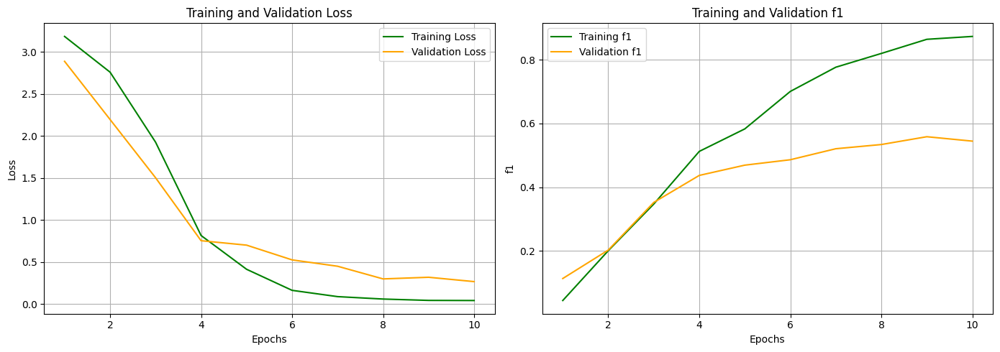

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - f1_score: 0.0284 - loss: 2.8704 - val_f1_score: 0.1868 - val_loss: 2.8823
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - f1_score: 0.1998 - loss: 2.2103 - val_f1_score: 0.2891 - val_loss: 2.2128
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - f1_score: 0.3713 - loss: 1.7335 - val_f1_score: 0.3791 - val_loss: 1.3963
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.4508 - loss: 0.6944 - val_f1_score: 0.4566 - val_loss: 0.8363
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - f1_score: 0.5950 - loss: 0.4708 - val_f1_score: 0.4668 - val_loss: 0.6473
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.6662 - loss: 0.1265 - val_f1_score: 0.5459 - val_loss: 0.4917
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - f1_score: 0.6712 - loss: 0.0728 - val_f1_score: 0.5330 - val_loss: 0.3604
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.7459 - loss: 0.0502 - val_f1_score: 0.

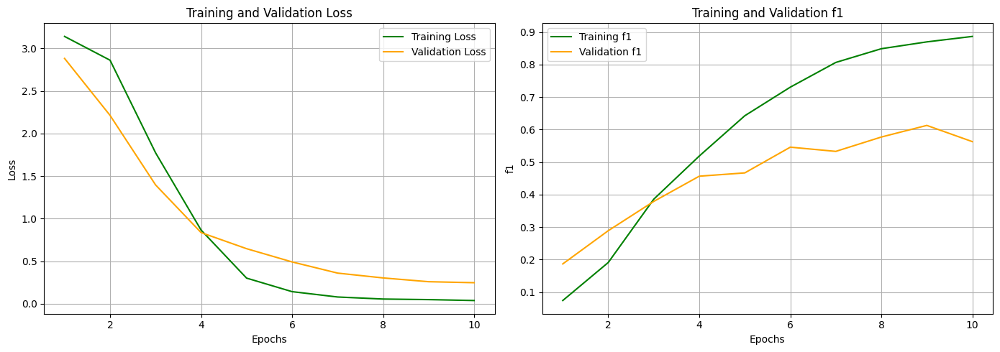

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - f1_score: 0.0200 - loss: 2.9664 - val_f1_score: 0.1468 - val_loss: 2.8163
Epoch 2/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - f1_score: 0.2150 - loss: 2.5594 - val_f1_score: 0.2438 - val_loss: 2.0395
Epoch 3/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.3657 - loss: 2.0389 - val_f1_score: 0.3958 - val_loss: 1.3948
Epoch 4/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.4495 - loss: 0.8132 - val_f1_score: 0.4562 - val_loss: 0.7876
Epoch 5/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.5832 - loss: 0.4069 - val_f1_score: 0.4926 - val_loss: 0.6743
Epoch 6/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - f1_score: 0.6731 - loss: 0.1498 - val_f1_score: 0.5323 - val_loss: 0.3831
Epoch 7/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.7521 - loss: 0.0658 - val_f1_score: 0.5333 - val_loss: 0.3540
Epoch 8/10
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - f1_score: 0.7012 - loss: 0.0471 - val_f1_score: 0.5

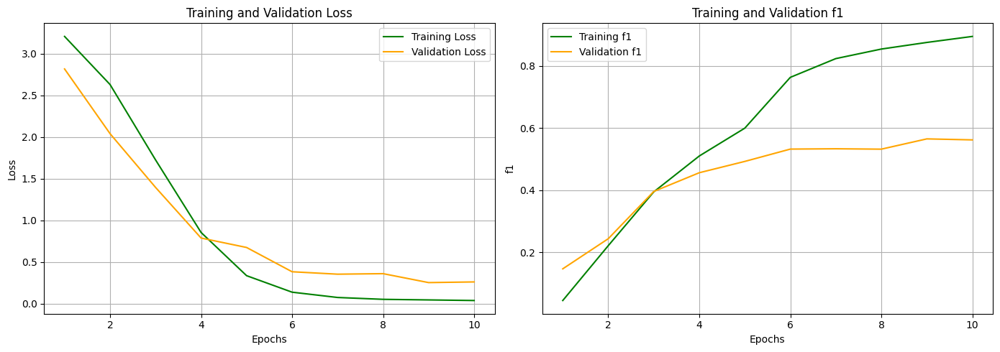

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


In [94]:
# Ejemplo de configuraciones de capas convolucionales
conv_layers_experiments = [
    [{'filters': 256, 'kernel_size': 3, 'pooling': 'max'}],
    [{'filters': 256, 'kernel_size': 5, 'pooling': 'max'}],
    [{'filters': 256, 'kernel_size': 7, 'pooling': 'max'}]
]

# Ejecutar los experimentos
results = []

for conv_config in conv_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(conv_layers_config=conv_config,epochs=10)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.7608688079608827
Experiment 1 Macro avg F1 std:  0.015284014200510601
Experiment 1 Accuracy mean:  0.9324444444444445
Experiment 1 Accuracy std:  0.004239729784075306
Experiment 2 Macro avg F1 mean:  0.7482266174441139
Experiment 2 Macro avg F1 std:  0.023776490845150218
Experiment 2 Accuracy mean:  0.9402222222222223
Experiment 2 Accuracy std:  0.00452155332208353
Experiment 3 Macro avg F1 mean:  0.7037460043053059
Experiment 3 Macro avg F1 std:  0.023293614740904342
Experiment 3 Accuracy mean:  0.9373333333333334
Experiment 3 Accuracy std:  0.003485419364746245


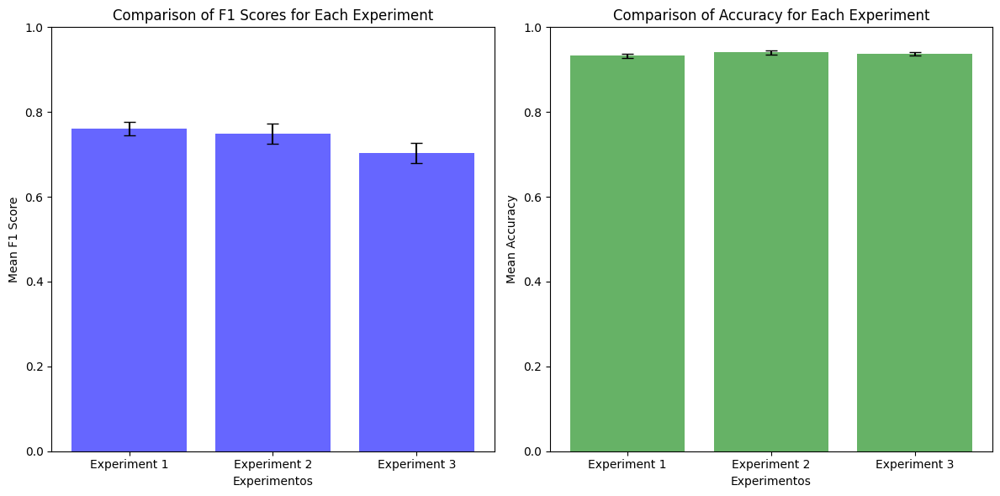

In [95]:
plot_experiment_metrics(results)

### Provar xarxes recurrents

In [114]:
def calculate_metrics(vocab_size=600, embedding_dim=100, CNN=True, architecture='LSTM', layer_configs=None, num_executions=5, batch_size=32, epochs=5):
    """
    Returns:
    - mean_macro_f1 (float), std_macro_f1 (float), mean_accuracy (float), std_accuracy (float), history_dict (dict)
    """
    macro_f1_scores = []
    accuracies = []
    history_dict = {'train_loss': [], 'val_loss': [], 'train_f1': [], 'val_f1': []}

    # Preprocesar datos
    prep_st = TextProcessor(train_sentences, val_sentences, test_sentences, train_labels, val_labels, test_labels, num_words=vocab_size, tech='stemming')
    prep_st.process_all()
    vocab_size = prep_st.num_words + 1

    for i in range(num_executions):
        class_weights = compute_class_weight(
            class_weight='balanced',
            classes=np.unique(prep_st.train_labels),
            y=prep_st.train_labels
        )
        class_weight_dict = dict(enumerate(class_weights))

        # Construcción del modelo
        model = Sequential()
        model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))

        if CNN:
            model.add(Conv1D(filters=256, kernel_size=3, activation='relu'))
            model.add(MaxPooling1D(pool_size=2))

        if architecture == 'LSTM':
            for layer in layer_configs:
                model.add(LSTM(units=layer['units'], return_sequences=layer['return_sequences']))

        elif architecture == 'GRU':
            for layer in layer_configs:
                model.add(GRU(units=layer['units'], return_sequences=layer['return_sequences']))

        model.add(BatchNormalization())
        model.add(GlobalMaxPooling1D())
        # Capas densas finales
        model.add(Dense(128, activation='relu'))
        model.add(Dense(num_labels, activation='softmax'))

        # Compilar y entrenar el modelo
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])
        history = model.fit(
            prep_st.train_pad_sequences, prep_st.train_encoded_labels,
            batch_size=batch_size, epochs=epochs,
            validation_data=(prep_st.val_pad_sequences, prep_st.val_encoded_labels),
            verbose=1, class_weight=class_weight_dict
        )

        # Guardar historia de entrenamiento
        history_dict['train_loss'].append(history.history['loss'])
        history_dict['val_loss'].append(history.history['val_loss'])
        history_dict['train_f1'].append(history.history['f1_score'])  # F1 macro en entrenamiento
        history_dict['val_f1'].append(history.history['val_f1_score'])  # F1 macro en validación
        plot_curves(history)

        # Predicción y cálculo de métricas
        probs = model.predict(prep_st.val_pad_sequences)
        _predicted_labels = np.argmax(probs, axis=1)
        predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)
        macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
        accuracy = accuracy_score(val_labels, predicted_labels)

        # Guardar resultados
        macro_f1_scores.append(macro_f1)
        accuracies.append(accuracy)

    # Calcular métricas promedio y desviación estándar
    mean_macro_f1 = np.mean(macro_f1_scores)
    std_macro_f1 = np.std(macro_f1_scores)
    mean_accuracy = np.mean(accuracies)
    std_accuracy = np.std(accuracies)

    return mean_macro_f1, std_macro_f1, mean_accuracy, std_accuracy, history_dict


#### Provar CNN + LSTM

Diferents valors de units

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.0484 - loss: 3.0564 - val_f1_score: 0.0861 - val_loss: 3.0246
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - f1_score: 0.1818 - loss: 2.7600 - val_f1_score: 0.2874 - val_loss: 2.7801
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - f1_score: 0.2993 - loss: 1.2006 - val_f1_score: 0.3298 - val_loss: 2.3746
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 28ms/step - f1_score: 0.3622 - loss: 0.6470 - val_f1_score: 0.3651 - val_loss: 1.6382
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - f1_score: 0.3880 - loss: 0.7677 - val_f1_score: 0.3710 - val_loss: 2.3050
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - f1_score: 0.4430 - loss: 0.2599 - val_f1_score: 0.5160 - val_loss: 0.6063
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.5628 - loss: 0.1127 - val_f1_score: 0.5463 - val_loss: 0.5149
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.6458 - loss: 0.1047 - val_f1_score: 0.595

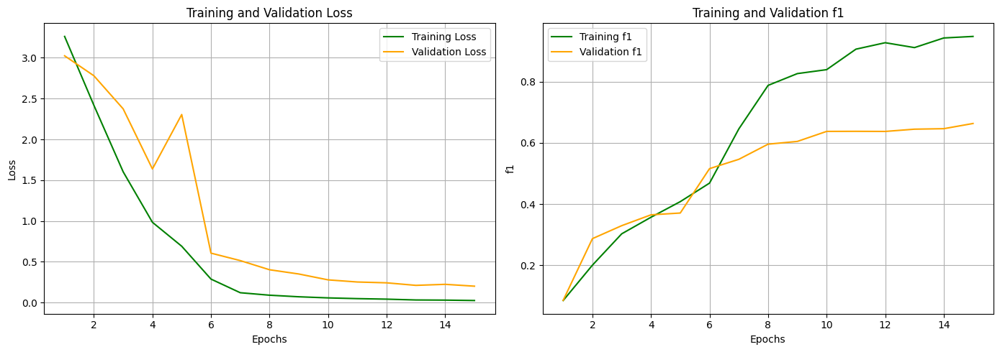

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - f1_score: 0.0436 - loss: 2.7044 - val_f1_score: 0.0104 - val_loss: 3.0761
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - f1_score: 0.1337 - loss: 2.4119 - val_f1_score: 0.1575 - val_loss: 2.8329
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.2955 - loss: 1.4806 - val_f1_score: 0.0917 - val_loss: 2.5190
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.3659 - loss: 1.3088 - val_f1_score: 0.4559 - val_loss: 1.3090
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - f1_score: 0.4367 - loss: 0.4476 - val_f1_score: 0.4341 - val_loss: 1.0971
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - f1_score: 0.5357 - loss: 0.2818 - val_f1_score: 0.4578 - val_loss: 0.7581
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.6523 - loss: 0.1025 - val_f1_score: 0.5301 - val_loss: 0.4424
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - f1_score: 0.7270 - loss: 0.0708 - val_f1_score: 0.571

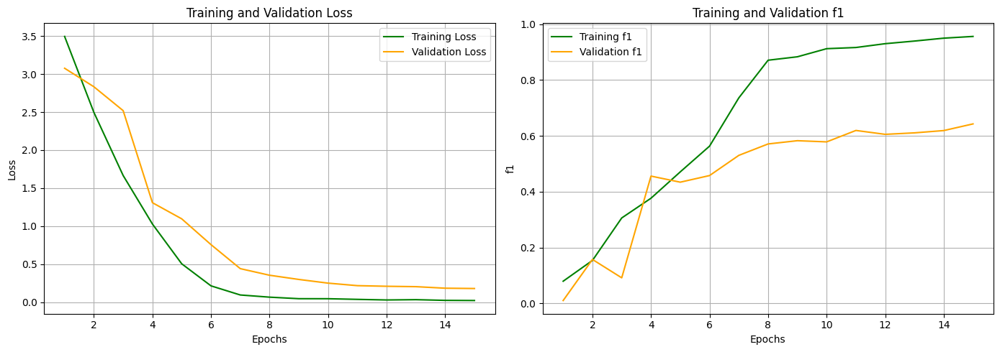

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 32ms/step - f1_score: 0.0309 - loss: 3.0242 - val_f1_score: 0.0669 - val_loss: 3.0539
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - f1_score: 0.1660 - loss: 2.5191 - val_f1_score: 0.2229 - val_loss: 2.7575
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.2956 - loss: 1.1449 - val_f1_score: 0.3297 - val_loss: 2.3174
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.3604 - loss: 0.9515 - val_f1_score: 0.4684 - val_loss: 1.2134
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.5264 - loss: 0.3326 - val_f1_score: 0.4914 - val_loss: 0.9380
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - f1_score: 0.6138 - loss: 0.1217 - val_f1_score: 0.5656 - val_loss: 0.4938
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.7028 - loss: 0.0756 - val_f1_score: 0.6252 - val_loss: 0.3563
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - f1_score: 0.7385 - loss: 0.0574 - val_f1_score: 0.639

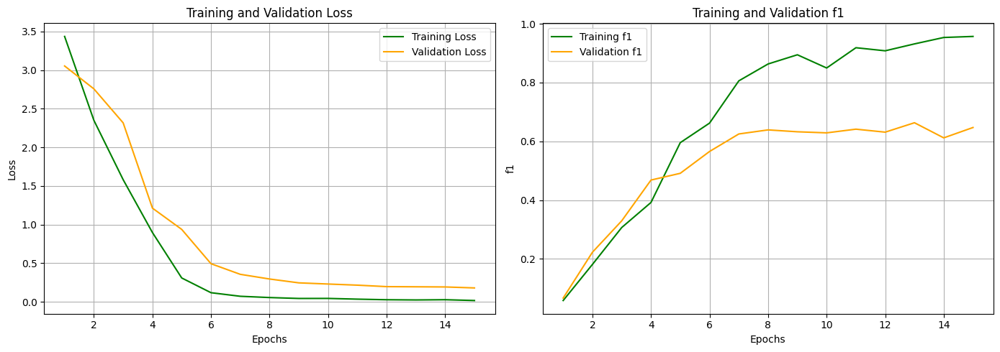

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - f1_score: 0.0261 - loss: 3.2954 - val_f1_score: 0.0610 - val_loss: 3.0573
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.1640 - loss: 2.9387 - val_f1_score: 0.2704 - val_loss: 2.7456
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.3033 - loss: 1.4599 - val_f1_score: 0.4248 - val_loss: 2.1249
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.4459 - loss: 1.0178 - val_f1_score: 0.4620 - val_loss: 1.5878
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.5185 - loss: 0.4126 - val_f1_score: 0.5634 - val_loss: 0.5203
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - f1_score: 0.6363 - loss: 0.2241 - val_f1_score: 0.5630 - val_loss: 0.5370
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - f1_score: 0.7255 - loss: 0.0816 - val_f1_score: 0.5918 - val_loss: 0.4210
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.7063 - loss: 0.0675 - val_f1_score: 0.60

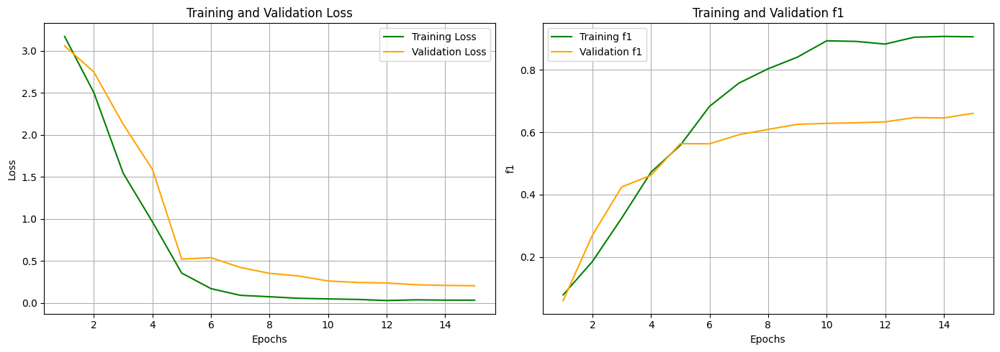

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - f1_score: 0.0089 - loss: 3.7253 - val_f1_score: 0.0083 - val_loss: 3.0074
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.1217 - loss: 2.4912 - val_f1_score: 0.0805 - val_loss: 2.9726
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.1572 - loss: 1.9554 - val_f1_score: 0.2597 - val_loss: 2.5863
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.3048 - loss: 0.9326 - val_f1_score: 0.3319 - val_loss: 1.8965
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.4483 - loss: 1.0584 - val_f1_score: 0.4306 - val_loss: 1.3906
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.5993 - loss: 0.2085 - val_f1_score: 0.3901 - val_loss: 1.2676
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.6238 - loss: 0.1566 - val_f1_score: 0.4459 - val_loss: 0.9192
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.6859 - loss: 0.1764 - val_f1_score: 0.54

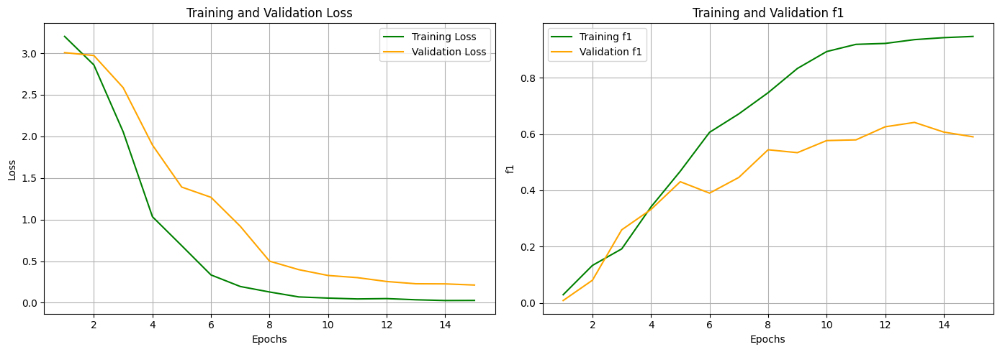

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.0521 - loss: 2.6733 - val_f1_score: 0.0695 - val_loss: 3.0417
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - f1_score: 0.1812 - loss: 2.4030 - val_f1_score: 0.3011 - val_loss: 2.9164
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.3226 - loss: 1.6385 - val_f1_score: 0.2901 - val_loss: 2.3641
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.3809 - loss: 0.7875 - val_f1_score: 0.3705 - val_loss: 1.8436
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.5091 - loss: 0.2820 - val_f1_score: 0.5050 - val_loss: 0.8634
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.6122 - loss: 0.1315 - val_f1_score: 0.5097 - val_loss: 0.5438
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.7152 - loss: 0.0840 - val_f1_score: 0.5846 - val_loss: 0.3267
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.7139 - loss: 0.0567 - val_f1_score: 0.61

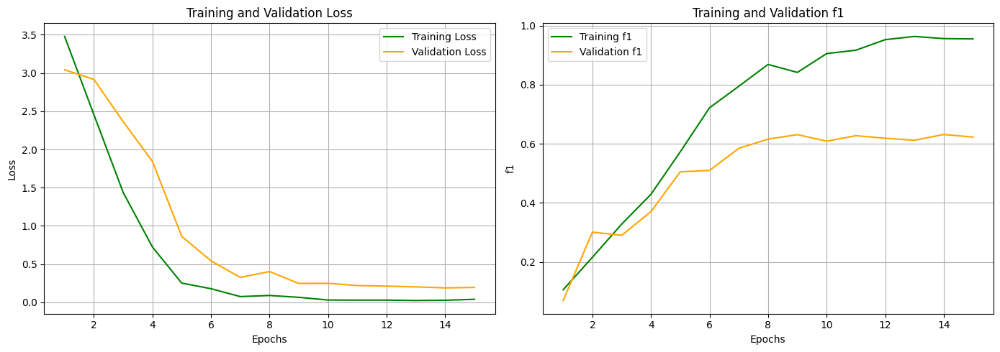

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.0629 - loss: 2.7596 - val_f1_score: 6.0205e-04 - val_loss: 3.0480
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - f1_score: 0.1494 - loss: 2.7064 - val_f1_score: 0.2060 - val_loss: 2.8869
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.3083 - loss: 1.5306 - val_f1_score: 0.3758 - val_loss: 2.4630
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.3891 - loss: 0.6697 - val_f1_score: 0.3660 - val_loss: 1.6904
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.4667 - loss: 0.4716 - val_f1_score: 0.4692 - val_loss: 1.1390
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - f1_score: 0.5947 - loss: 0.1194 - val_f1_score: 0.5465 - val_loss: 0.4873
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - f1_score: 0.6697 - loss: 0.0663 - val_f1_score: 0.5416 - val_loss: 0.4170
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.7013 - loss: 0.0746 - val_f1_score: 

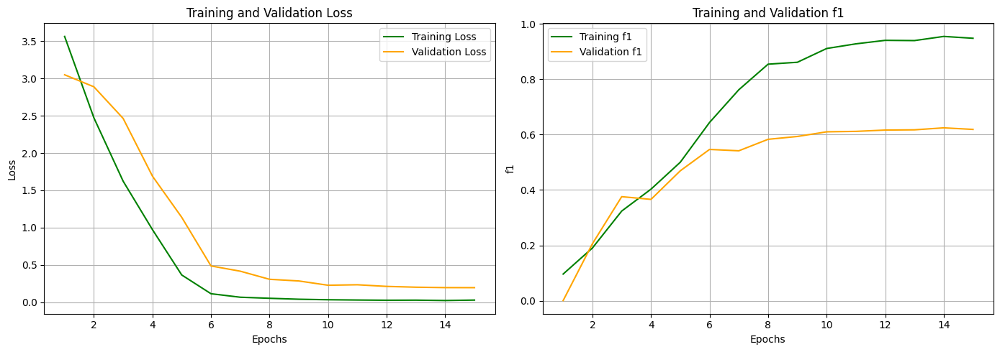

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 48ms/step - f1_score: 0.0562 - loss: 2.8317 - val_f1_score: 0.0727 - val_loss: 3.0495
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - f1_score: 0.1949 - loss: 2.2422 - val_f1_score: 0.1491 - val_loss: 2.8611
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.2321 - loss: 1.4195 - val_f1_score: 0.3026 - val_loss: 2.4907
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.3674 - loss: 0.8089 - val_f1_score: 0.4039 - val_loss: 1.5456
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.4821 - loss: 0.4391 - val_f1_score: 0.4736 - val_loss: 0.8184
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.5876 - loss: 0.1596 - val_f1_score: 0.5674 - val_loss: 0.4402
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.6673 - loss: 0.0823 - val_f1_score: 0.5586 - val_loss: 0.3403
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.7264 - loss: 0.0510 - val_f1_score: 0.55

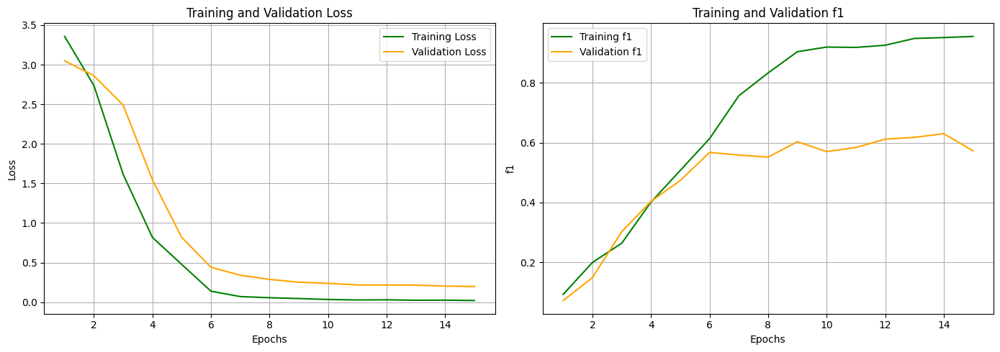

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - f1_score: 0.0443 - loss: 3.2456 - val_f1_score: 0.0732 - val_loss: 3.0348
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.1142 - loss: 2.2713 - val_f1_score: 0.1601 - val_loss: 2.9451
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - f1_score: 0.2359 - loss: 1.7764 - val_f1_score: 0.3694 - val_loss: 2.3118
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.3410 - loss: 1.2274 - val_f1_score: 0.4096 - val_loss: 1.6124
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.5427 - loss: 0.2466 - val_f1_score: 0.4946 - val_loss: 0.8055
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.6133 - loss: 0.1388 - val_f1_score: 0.5597 - val_loss: 0.4871
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - f1_score: 0.6745 - loss: 0.0634 - val_f1_score: 0.6004 - val_loss: 0.3803
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.7448 - loss: 0.0342 - val_f1_score: 0.6

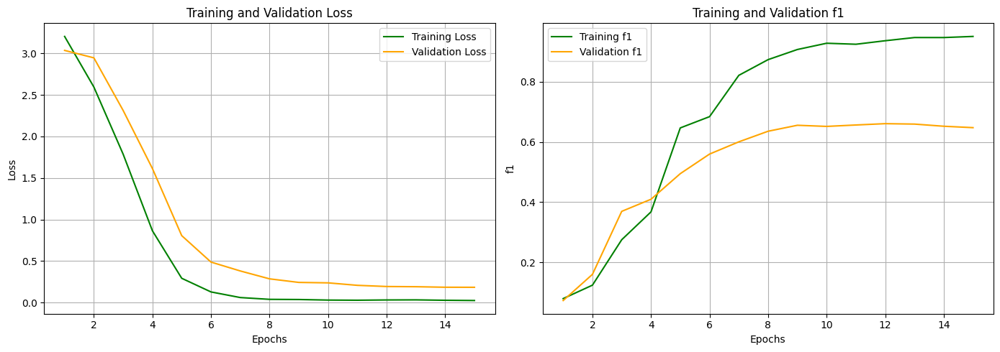

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 70ms/step - f1_score: 0.0411 - loss: 3.2952 - val_f1_score: 0.0609 - val_loss: 3.0822
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - f1_score: 0.1578 - loss: 2.7288 - val_f1_score: 0.2333 - val_loss: 2.8155
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.2297 - loss: 2.1151 - val_f1_score: 0.2869 - val_loss: 2.5175
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - f1_score: 0.4220 - loss: 0.6892 - val_f1_score: 0.3429 - val_loss: 1.8873
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.4251 - loss: 0.4658 - val_f1_score: 0.3232 - val_loss: 1.2134
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.5244 - loss: 0.6171 - val_f1_score: 0.4987 - val_loss: 0.6785
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.6350 - loss: 0.1037 - val_f1_score: 0.5678 - val_loss: 0.4266
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.7670 - loss: 0.0464 - val_f1_score: 0.58

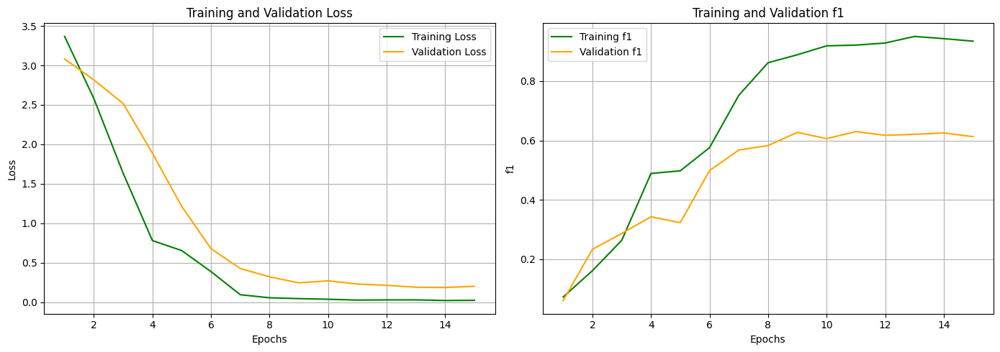

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 68ms/step - f1_score: 0.0236 - loss: 3.1787 - val_f1_score: 0.1112 - val_loss: 3.0603
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - f1_score: 0.1754 - loss: 3.0377 - val_f1_score: 0.2632 - val_loss: 2.8499
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step - f1_score: 0.3053 - loss: 2.0321 - val_f1_score: 0.2727 - val_loss: 2.5081
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - f1_score: 0.3429 - loss: 1.4017 - val_f1_score: 0.3904 - val_loss: 1.8617
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - f1_score: 0.4371 - loss: 0.7149 - val_f1_score: 0.4631 - val_loss: 1.2263
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - f1_score: 0.5442 - loss: 0.2000 - val_f1_score: 0.5093 - val_loss: 0.6740
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step - f1_score: 0.5937 - loss: 0.1045 - val_f1_score: 0.5662 - val_loss: 0.4535
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step - f1_score: 0.6917 - loss: 0.0597 - val_f1_score: 

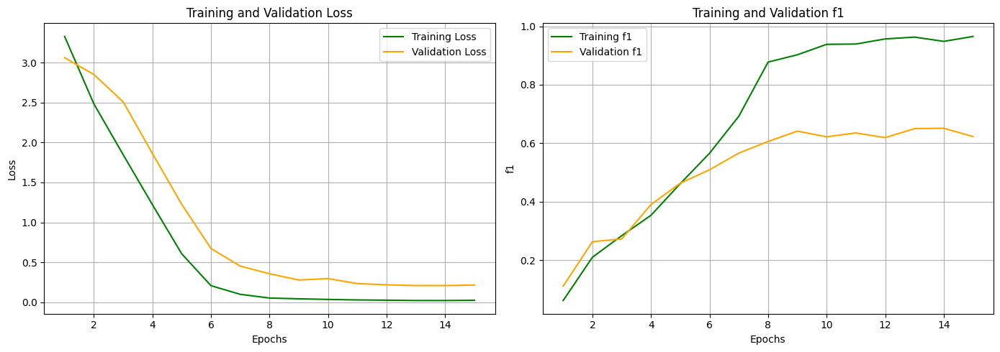

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - f1_score: 0.0366 - loss: 3.0236 - val_f1_score: 0.0867 - val_loss: 2.9842
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.1293 - loss: 3.0542 - val_f1_score: 0.1958 - val_loss: 2.9664
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - f1_score: 0.2746 - loss: 1.8498 - val_f1_score: 0.3529 - val_loss: 2.3380
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - f1_score: 0.3219 - loss: 0.9372 - val_f1_score: 0.3637 - val_loss: 2.2129
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - f1_score: 0.4868 - loss: 0.4388 - val_f1_score: 0.4683 - val_loss: 1.0593
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - f1_score: 0.5947 - loss: 0.2289 - val_f1_score: 0.5430 - val_loss: 0.4898
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - f1_score: 0.7087 - loss: 0.0711 - val_f1_score: 0.5930 - val_loss: 0.4013
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - f1_score: 0.7473 - loss: 0.0497 - val_f1_score: 0

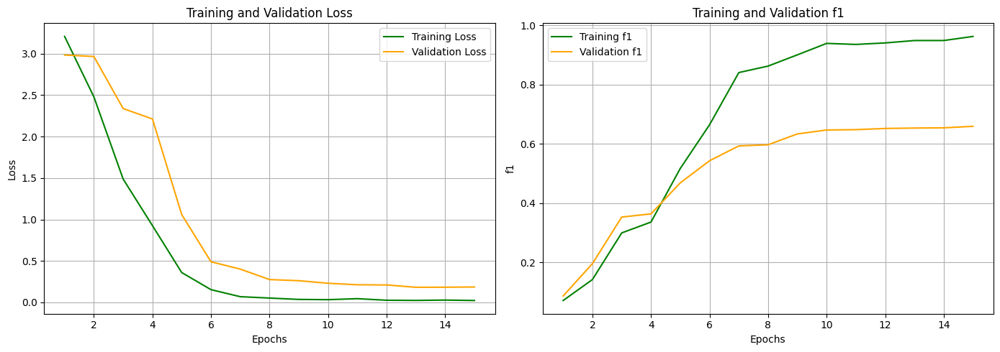

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step - f1_score: 0.0429 - loss: 3.2347 - val_f1_score: 0.0847 - val_loss: 3.0400
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - f1_score: 0.1822 - loss: 2.0218 - val_f1_score: 0.1139 - val_loss: 2.6920
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.2574 - loss: 1.8992 - val_f1_score: 0.3070 - val_loss: 2.4447
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - f1_score: 0.4113 - loss: 0.6236 - val_f1_score: 0.3888 - val_loss: 1.7094
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 72ms/step - f1_score: 0.4625 - loss: 0.3015 - val_f1_score: 0.4369 - val_loss: 0.8044
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 78ms/step - f1_score: 0.6892 - loss: 0.1127 - val_f1_score: 0.5592 - val_loss: 0.4312
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.6789 - loss: 0.0761 - val_f1_score: 0.5782 - val_loss: 0.3741
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - f1_score: 0.7580 - loss: 0.0454 - val_f1_score: 

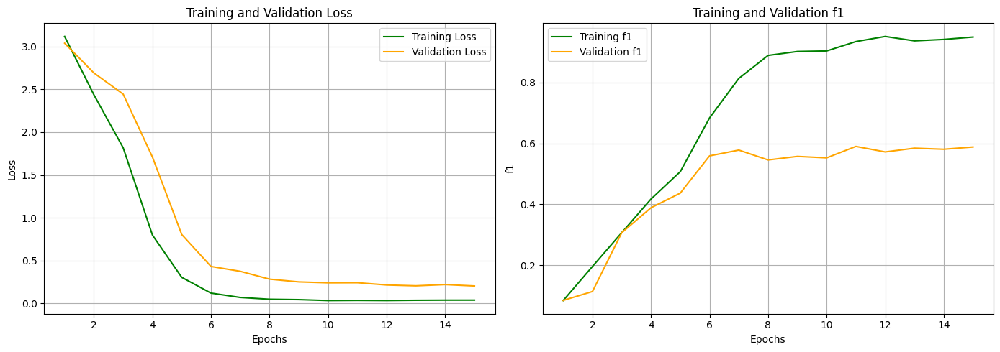

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - f1_score: 0.0461 - loss: 2.9507 - val_f1_score: 0.0682 - val_loss: 3.0419
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - f1_score: 0.1381 - loss: 2.7008 - val_f1_score: 0.2481 - val_loss: 2.8068
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - f1_score: 0.3263 - loss: 1.2213 - val_f1_score: 0.3403 - val_loss: 2.3465
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - f1_score: 0.3823 - loss: 0.7368 - val_f1_score: 0.4158 - val_loss: 2.0981
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - f1_score: 0.4143 - loss: 0.6287 - val_f1_score: 0.3234 - val_loss: 1.7265
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - f1_score: 0.5674 - loss: 0.2010 - val_f1_score: 0.5171 - val_loss: 0.5707
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - f1_score: 0.6180 - loss: 0.0612 - val_f1_score: 0.5978 - val_loss: 0.3539
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.7430 - loss: 0.0504 - val_f1_score: 

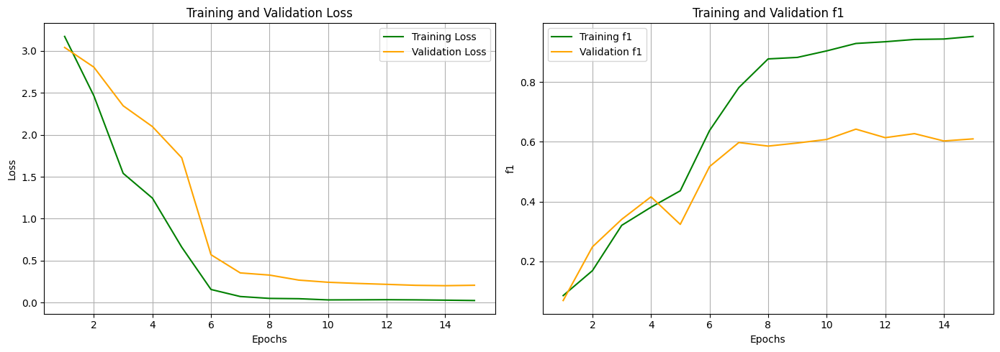

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 85ms/step - f1_score: 0.0399 - loss: 3.5186 - val_f1_score: 0.0292 - val_loss: 3.0595
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 76ms/step - f1_score: 0.0919 - loss: 2.6234 - val_f1_score: 0.2561 - val_loss: 2.8213
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - f1_score: 0.2591 - loss: 1.3895 - val_f1_score: 0.3255 - val_loss: 2.6355
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - f1_score: 0.3569 - loss: 1.0751 - val_f1_score: 0.3141 - val_loss: 2.2209
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 77ms/step - f1_score: 0.4543 - loss: 0.3585 - val_f1_score: 0.3789 - val_loss: 1.3054
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.4901 - loss: 0.3976 - val_f1_score: 0.4431 - val_loss: 1.1837
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step - f1_score: 0.5013 - loss: 0.3040 - val_f1_score: 0.5219 - val_loss: 0.4505
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.7120 - loss: 0.0637 - val_f1_score:

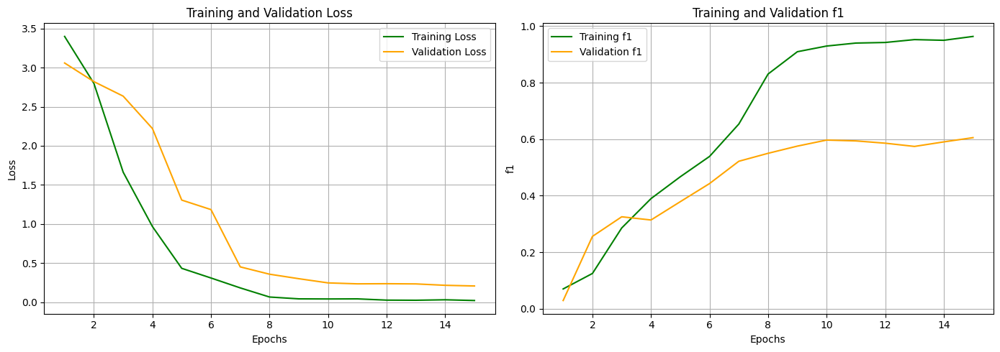

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


In [105]:
lstm_layers_experiments = [
    [{'units': 32, 'return_sequences': True}],
    [{'units': 64, 'return_sequences': True}],
    [{'units': 128, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for lstm_config in lstm_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(architecture='LSTM', layer_configs=lstm_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.8039162372105899
Experiment 1 Macro avg F1 std:  0.06557428172302235
Experiment 1 Accuracy mean:  0.9595555555555556
Experiment 1 Accuracy std:  0.007780951733338502
Experiment 2 Macro avg F1 mean:  0.77798135188966
Experiment 2 Macro avg F1 std:  0.03633411029832794
Experiment 2 Accuracy mean:  0.9615555555555556
Experiment 2 Accuracy std:  0.0038232556742411558
Experiment 3 Macro avg F1 mean:  0.7896886703072568
Experiment 3 Macro avg F1 std:  0.03368234029694736
Experiment 3 Accuracy mean:  0.960888888888889
Experiment 3 Accuracy std:  0.0017777777777777811


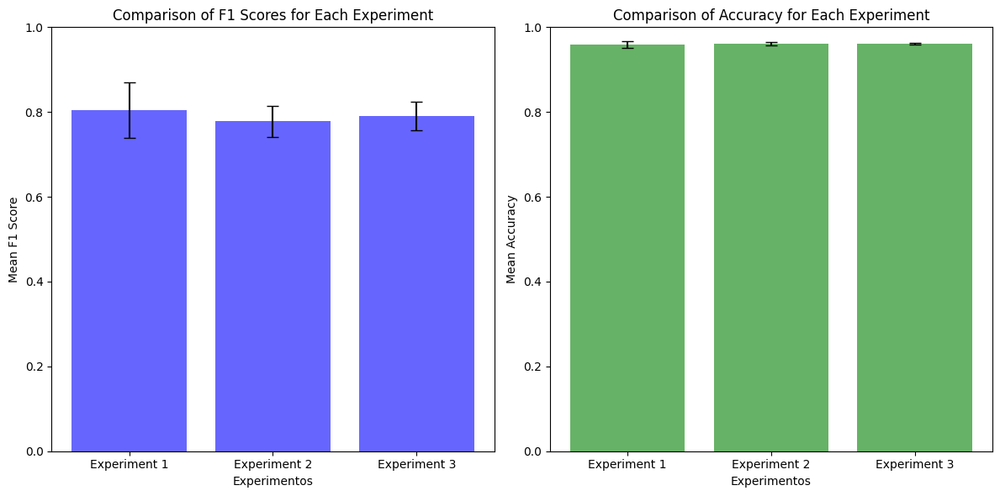

In [106]:
plot_experiment_metrics(results)

Més capes

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - f1_score: 0.0180 - loss: 3.3895 - val_f1_score: 0.0568 - val_loss: 3.0640
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - f1_score: 0.0872 - loss: 2.9797 - val_f1_score: 0.1457 - val_loss: 2.8507
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - f1_score: 0.2063 - loss: 2.7088 - val_f1_score: 0.1839 - val_loss: 2.3434
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - f1_score: 0.2356 - loss: 1.9531 - val_f1_score: 0.2636 - val_loss: 2.0383
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - f1_score: 0.3403 - loss: 1.4981 - val_f1_score: 0.2713 - val_loss: 2.3108
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - f1_score: 0.3475 - loss: 0.9247 - val_f1_score: 0.3657 - val_loss: 1.5904
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 46ms/step - f1_score: 0.3797 - loss: 0.9906 - val_f1_score: 0.4264 - val_loss: 1.2814
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - f1_score: 0.4341 - loss: 0.4435 - val_f1_score: 0.4

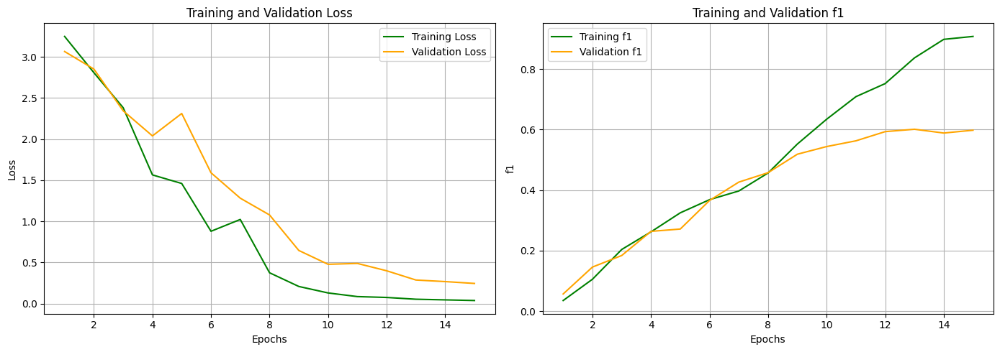

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 44ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - f1_score: 0.0147 - loss: 3.1710 - val_f1_score: 0.0247 - val_loss: 3.0493
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.0750 - loss: 3.0166 - val_f1_score: 0.1468 - val_loss: 2.9886
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - f1_score: 0.1682 - loss: 2.0936 - val_f1_score: 0.0792 - val_loss: 2.8988
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.1781 - loss: 2.2099 - val_f1_score: 0.2323 - val_loss: 2.1355
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.2629 - loss: 1.0370 - val_f1_score: 0.0887 - val_loss: 3.2353
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.2291 - loss: 1.3389 - val_f1_score: 0.3096 - val_loss: 1.5911
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - f1_score: 0.3893 - loss: 0.7585 - val_f1_score: 0.2559 - val_loss: 2.4058
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.3883 - loss: 0.5692 - val_f1_score: 0.3

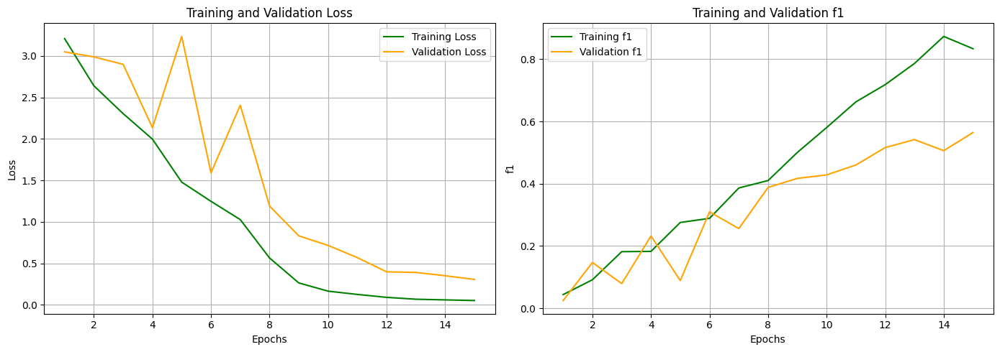

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - f1_score: 0.0095 - loss: 3.5714 - val_f1_score: 0.0170 - val_loss: 3.0755
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.0965 - loss: 2.8783 - val_f1_score: 0.0123 - val_loss: 3.0928
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - f1_score: 0.0708 - loss: 2.7377 - val_f1_score: 0.1390 - val_loss: 2.7192
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.1369 - loss: 2.0087 - val_f1_score: 0.2175 - val_loss: 2.3177
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.2768 - loss: 1.1185 - val_f1_score: 0.0751 - val_loss: 3.4457
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - f1_score: 0.3347 - loss: 1.0783 - val_f1_score: 0.1812 - val_loss: 2.5031
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.3600 - loss: 1.1779 - val_f1_score: 0.3617 - val_loss: 1.7048
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 48ms/step - f1_score: 0.4264 - loss: 0.7115 - val_f1_score: 0.

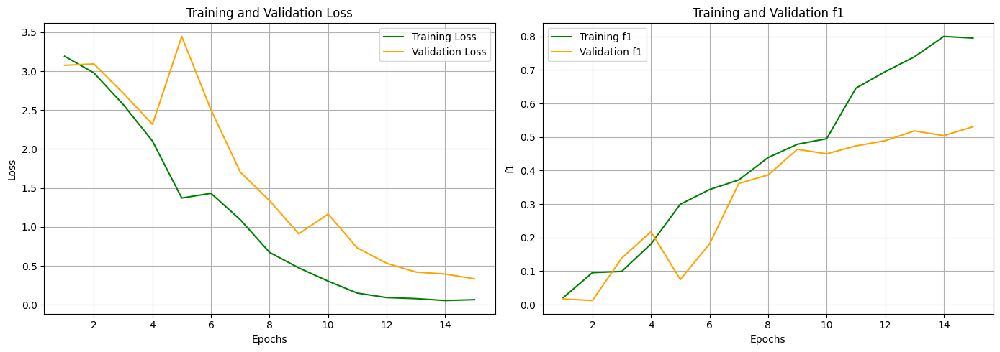

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 47ms/step - f1_score: 0.0381 - loss: 2.8677 - val_f1_score: 0.0246 - val_loss: 3.0458
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - f1_score: 0.1178 - loss: 3.2923 - val_f1_score: 0.1633 - val_loss: 2.7610
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.1634 - loss: 2.2026 - val_f1_score: 0.2243 - val_loss: 2.5080
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - f1_score: 0.2385 - loss: 1.7459 - val_f1_score: 0.2220 - val_loss: 2.1927
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - f1_score: 0.3128 - loss: 1.5858 - val_f1_score: 0.2770 - val_loss: 2.1071
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - f1_score: 0.3455 - loss: 0.7726 - val_f1_score: 0.2422 - val_loss: 1.5376
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 36ms/step - f1_score: 0.3668 - loss: 0.8458 - val_f1_score: 0.2798 - val_loss: 1.2754
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.3865 - loss: 0.8670 - val_f1_score: 0.

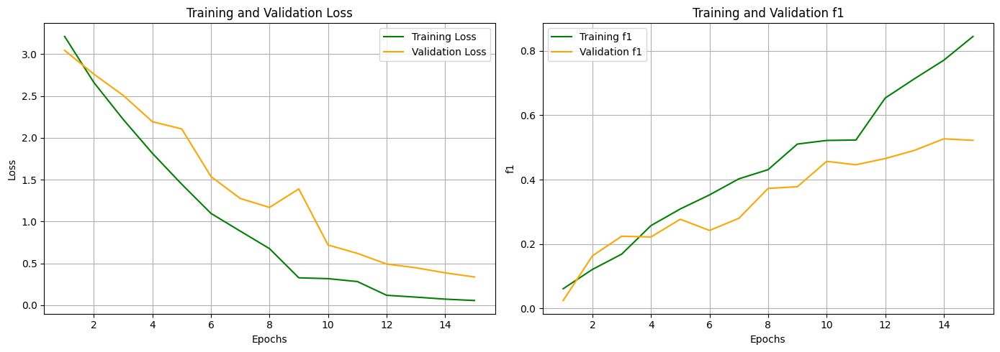

29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - f1_score: 0.0300 - loss: 2.6154 - val_f1_score: 0.0050 - val_loss: 3.0904
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 47ms/step - f1_score: 0.0324 - loss: 3.2881 - val_f1_score: 0.1420 - val_loss: 2.9201
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - f1_score: 0.1383 - loss: 2.3294 - val_f1_score: 0.1589 - val_loss: 2.9209
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - f1_score: 0.2174 - loss: 1.9603 - val_f1_score: 0.1426 - val_loss: 2.3769
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.2611 - loss: 1.7812 - val_f1_score: 0.2771 - val_loss: 1.9144
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - f1_score: 0.3290 - loss: 1.0293 - val_f1_score: 0.3073 - val_loss: 1.8718
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.3318 - loss: 1.1812 - val_f1_score: 0.3237 - val_loss: 1.5173
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.4015 - loss: 0.7987 - val_f1_score: 0.31

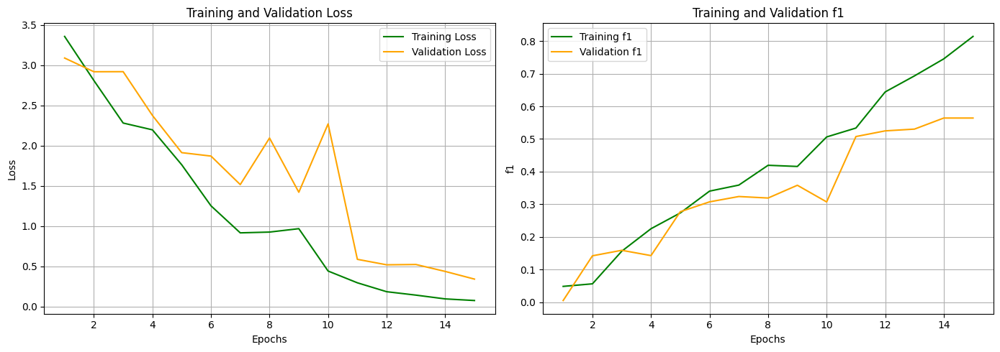

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - f1_score: 0.0057 - loss: 3.4627 - val_f1_score: 0.0378 - val_loss: 3.0472
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 46ms/step - f1_score: 0.0414 - loss: 3.1028 - val_f1_score: 0.0112 - val_loss: 3.0111
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.0310 - loss: 3.6327 - val_f1_score: 0.0080 - val_loss: 2.8705
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - f1_score: 0.0788 - loss: 2.4452 - val_f1_score: 0.0734 - val_loss: 2.8538
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.1145 - loss: 2.6970 - val_f1_score: 0.1825 - val_loss: 2.2975
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.2022 - loss: 1.5184 - val_f1_score: 0.2048 - val_loss: 2.1138
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.2372 - loss: 1.8126 - val_f1_score: 0.2796 - val_loss: 1.9526
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.3125 - loss: 1.3702 - val_f1_score: 0.26

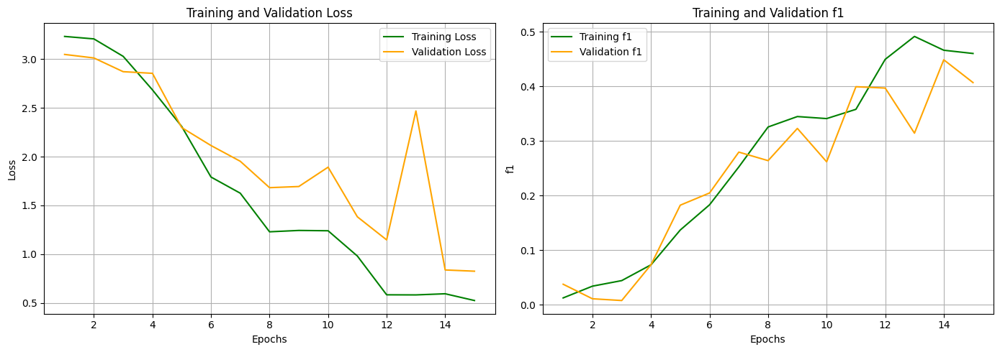

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - f1_score: 0.0107 - loss: 3.2675 - val_f1_score: 0.0083 - val_loss: 3.0597
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - f1_score: 0.0520 - loss: 3.4839 - val_f1_score: 0.0330 - val_loss: 2.8409
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - f1_score: 0.1019 - loss: 1.9316 - val_f1_score: 0.0466 - val_loss: 2.9603
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - f1_score: 0.1064 - loss: 1.8855 - val_f1_score: 0.0715 - val_loss: 2.8548
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - f1_score: 0.1528 - loss: 1.9656 - val_f1_score: 0.1948 - val_loss: 2.3442
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - f1_score: 0.2076 - loss: 2.1478 - val_f1_score: 0.1836 - val_loss: 2.6234
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 50ms/step - f1_score: 0.2398 - loss: 1.2641 - val_f1_score: 0.2738 - val_loss: 2.1279
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.2472 - loss: 1.2703 - val_f1_score: 0.3

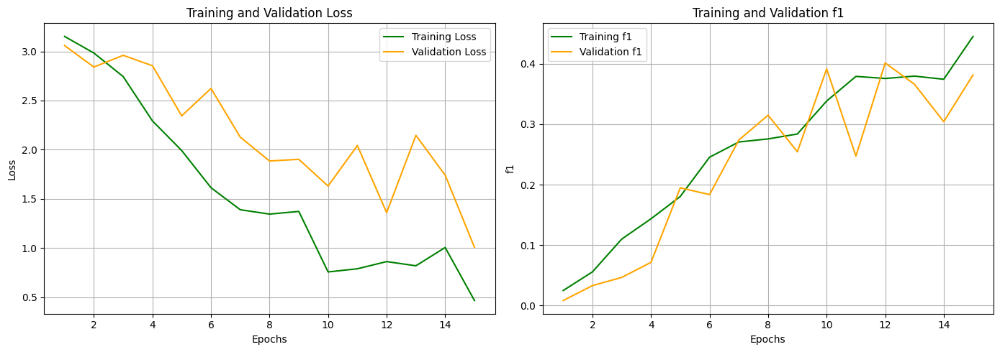

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - f1_score: 0.0067 - loss: 3.6867 - val_f1_score: 0.0092 - val_loss: 3.0608
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - f1_score: 0.0395 - loss: 2.8776 - val_f1_score: 0.0708 - val_loss: 3.0666
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.0471 - loss: 2.7470 - val_f1_score: 0.0482 - val_loss: 2.9054
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.0768 - loss: 2.3562 - val_f1_score: 0.1217 - val_loss: 2.6599
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 51ms/step - f1_score: 0.1325 - loss: 2.2844 - val_f1_score: 0.1649 - val_loss: 2.4277
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - f1_score: 0.1830 - loss: 1.7460 - val_f1_score: 0.1367 - val_loss: 2.6181
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - f1_score: 0.1706 - loss: 1.8348 - val_f1_score: 0.2090 - val_loss: 2.6126
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - f1_score: 0.2570 - loss: 1.3574 - val_f1_score: 0

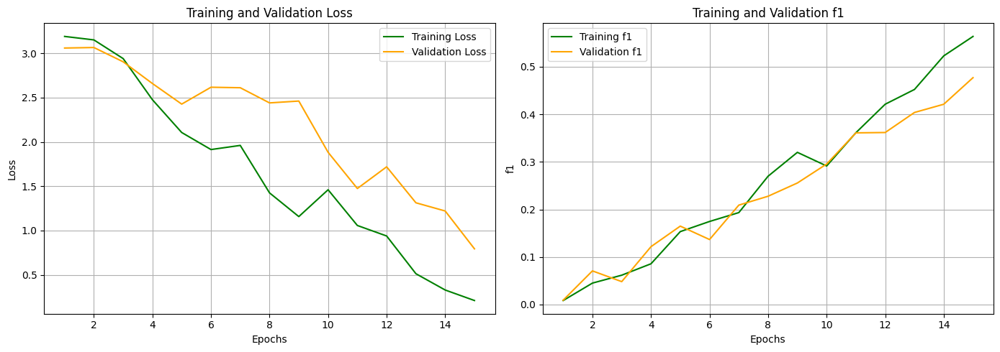

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - f1_score: 0.0096 - loss: 2.8471 - val_f1_score: 0.0292 - val_loss: 3.0540
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 56ms/step - f1_score: 0.0550 - loss: 2.6011 - val_f1_score: 0.0712 - val_loss: 3.0247
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - f1_score: 0.0624 - loss: 2.4804 - val_f1_score: 0.0893 - val_loss: 2.8125
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - f1_score: 0.1093 - loss: 2.3977 - val_f1_score: 0.1086 - val_loss: 2.4713
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.1599 - loss: 1.5873 - val_f1_score: 0.1941 - val_loss: 2.5403
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.2195 - loss: 1.7786 - val_f1_score: 0.1524 - val_loss: 2.3166
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.2248 - loss: 2.0513 - val_f1_score: 0.3112 - val_loss: 1.9404
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - f1_score: 0.2937 - loss: 1.1735 - val_f1_score: 0.

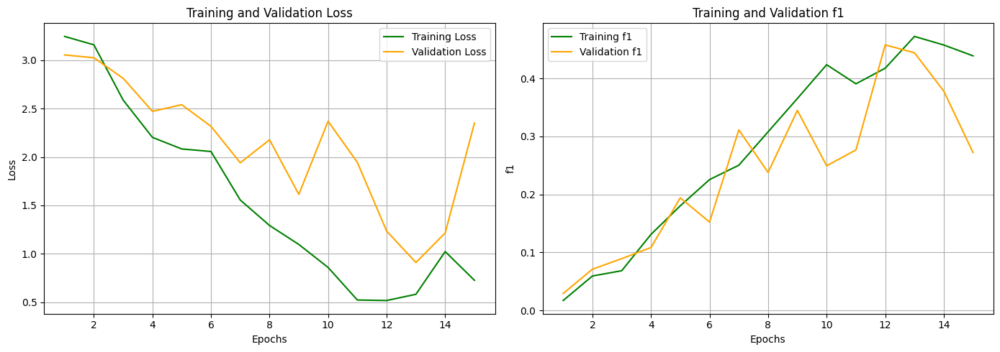

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step - f1_score: 0.0166 - loss: 3.1067 - val_f1_score: 0.0231 - val_loss: 3.0680
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 49ms/step - f1_score: 0.0424 - loss: 2.8321 - val_f1_score: 0.0047 - val_loss: 2.9269
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - f1_score: 0.0558 - loss: 2.6317 - val_f1_score: 0.0341 - val_loss: 2.6185
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 50ms/step - f1_score: 0.0922 - loss: 2.7526 - val_f1_score: 0.1261 - val_loss: 2.5195
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.0988 - loss: 3.1462 - val_f1_score: 0.1473 - val_loss: 2.5905
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - f1_score: 0.1613 - loss: 2.4254 - val_f1_score: 0.1468 - val_loss: 2.0321
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - f1_score: 0.2022 - loss: 1.8985 - val_f1_score: 0.1998 - val_loss: 1.9955
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - f1_score: 0.2316 - loss: 1.5940 - val_f1_score: 0.15

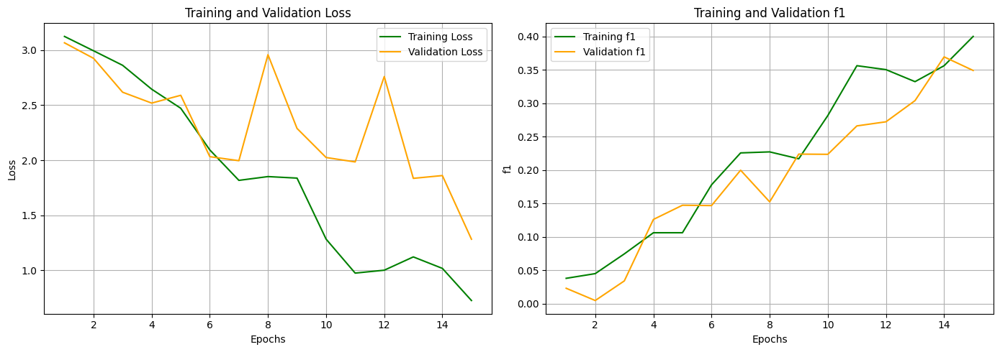

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step


In [107]:
lstm_layers_experiments = [
    [{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True}],
    [{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for lstm_config in lstm_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(architecture='LSTM', layer_configs=lstm_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.6370877317478686
Experiment 1 Macro avg F1 std:  0.03197545457724721
Experiment 1 Accuracy mean:  0.9280000000000002
Experiment 1 Accuracy std:  0.008385761006272542
Experiment 2 Macro avg F1 mean:  0.3907184881264203
Experiment 2 Macro avg F1 std:  0.08370865350163144
Experiment 2 Accuracy mean:  0.6284444444444446
Experiment 2 Accuracy std:  0.16461042674324305


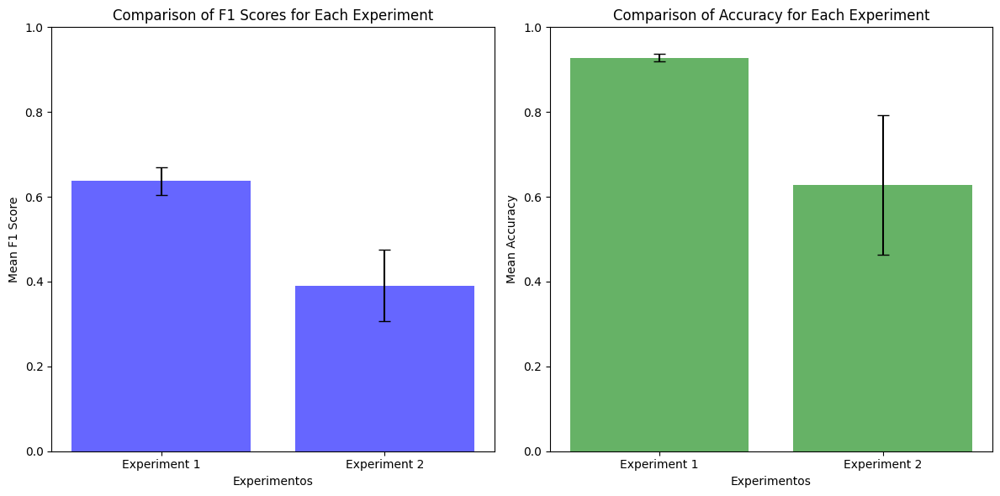

In [108]:
plot_experiment_metrics(results)

#### Provar CNN + GRU

Diferents valors de units

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - f1_score: 0.0291 - loss: 3.5195 - val_f1_score: 0.1241 - val_loss: 2.9756
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.1640 - loss: 3.3043 - val_f1_score: 0.3033 - val_loss: 2.7924
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - f1_score: 0.2926 - loss: 1.9208 - val_f1_score: 0.3672 - val_loss: 2.1972
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.3529 - loss: 1.3207 - val_f1_score: 0.3838 - val_loss: 1.8434
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.4610 - loss: 0.5357 - val_f1_score: 0.3983 - val_loss: 1.4975
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - f1_score: 0.4810 - loss: 0.4829 - val_f1_score: 0.4769 - val_loss: 0.9442
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.5557 - loss: 0.1390 - val_f1_score: 0.5593 - val_loss: 0.6098
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.6402 - loss: 0.0802 - val_f1_score: 0.56

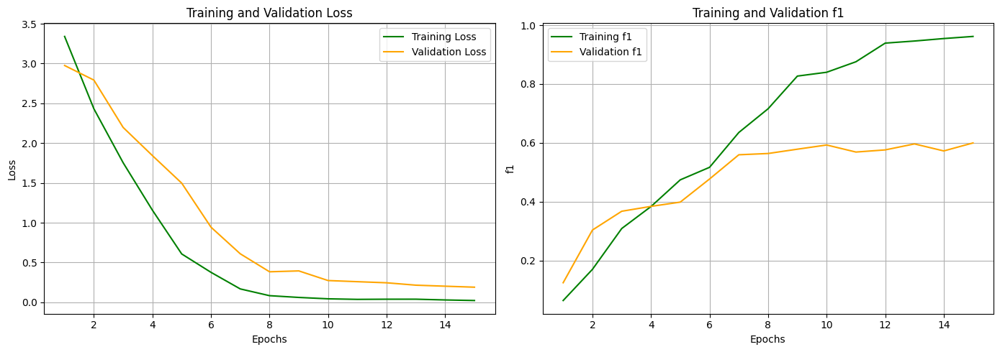

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - f1_score: 0.0442 - loss: 3.0082 - val_f1_score: 0.0716 - val_loss: 3.0632
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.1808 - loss: 2.5679 - val_f1_score: 0.2938 - val_loss: 2.8747
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - f1_score: 0.2991 - loss: 1.3504 - val_f1_score: 0.3095 - val_loss: 2.4382
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.3782 - loss: 0.5865 - val_f1_score: 0.4479 - val_loss: 1.4388
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.5659 - loss: 0.1947 - val_f1_score: 0.4853 - val_loss: 0.8617
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - f1_score: 0.6223 - loss: 0.1197 - val_f1_score: 0.5911 - val_loss: 0.4461
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.7279 - loss: 0.0656 - val_f1_score: 0.6144 - val_loss: 0.2894
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.7881 - loss: 0.0440 - val_f1_score: 0.633

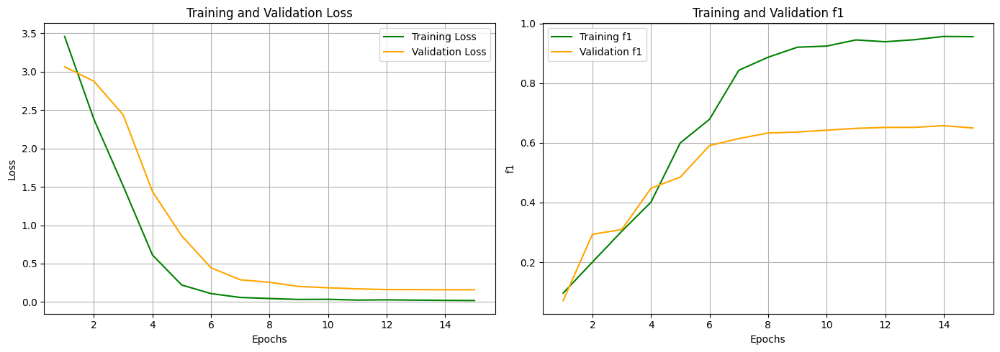

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - f1_score: 0.0428 - loss: 3.2835 - val_f1_score: 0.1321 - val_loss: 2.9976
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.2043 - loss: 1.9441 - val_f1_score: 0.2639 - val_loss: 2.9318
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.3205 - loss: 1.6455 - val_f1_score: 0.3288 - val_loss: 2.3377
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.3932 - loss: 0.8004 - val_f1_score: 0.3984 - val_loss: 1.7087
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.4568 - loss: 0.4084 - val_f1_score: 0.4200 - val_loss: 1.3875
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.4953 - loss: 0.2675 - val_f1_score: 0.5168 - val_loss: 0.7040
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.6295 - loss: 0.0979 - val_f1_score: 0.5929 - val_loss: 0.4380
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.7301 - loss: 0.0749 - val_f1_score: 0.595

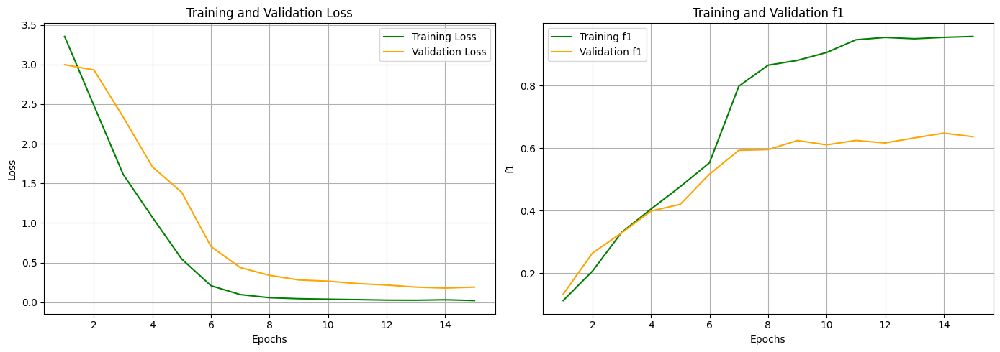

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - f1_score: 0.0381 - loss: 3.4558 - val_f1_score: 0.1732 - val_loss: 2.9647
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - f1_score: 0.2014 - loss: 2.9687 - val_f1_score: 0.1967 - val_loss: 2.7700
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.3175 - loss: 1.6521 - val_f1_score: 0.3544 - val_loss: 2.4716
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.3836 - loss: 0.7876 - val_f1_score: 0.3530 - val_loss: 1.7768
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.4362 - loss: 0.3544 - val_f1_score: 0.4256 - val_loss: 1.2355
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.5058 - loss: 0.3550 - val_f1_score: 0.4803 - val_loss: 0.8774
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - f1_score: 0.6470 - loss: 0.1349 - val_f1_score: 0.5533 - val_loss: 0.4755
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - f1_score: 0.7079 - loss: 0.0574 - val_f1_score: 0.61

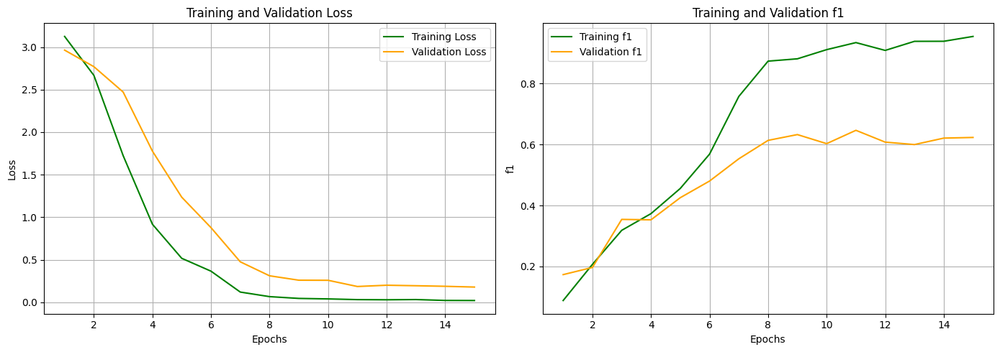

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - f1_score: 0.0827 - loss: 3.0498 - val_f1_score: 0.1575 - val_loss: 3.0132
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - f1_score: 0.2055 - loss: 2.4282 - val_f1_score: 0.2986 - val_loss: 2.7676
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - f1_score: 0.3670 - loss: 1.1836 - val_f1_score: 0.3580 - val_loss: 2.4639
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - f1_score: 0.4182 - loss: 0.5996 - val_f1_score: 0.3530 - val_loss: 1.9120
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.4662 - loss: 0.4989 - val_f1_score: 0.3474 - val_loss: 1.4739
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - f1_score: 0.5490 - loss: 0.2281 - val_f1_score: 0.5723 - val_loss: 0.5440
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.6506 - loss: 0.0804 - val_f1_score: 0.5959 - val_loss: 0.4478
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - f1_score: 0.7232 - loss: 0.0667 - val_f1_score: 0.5

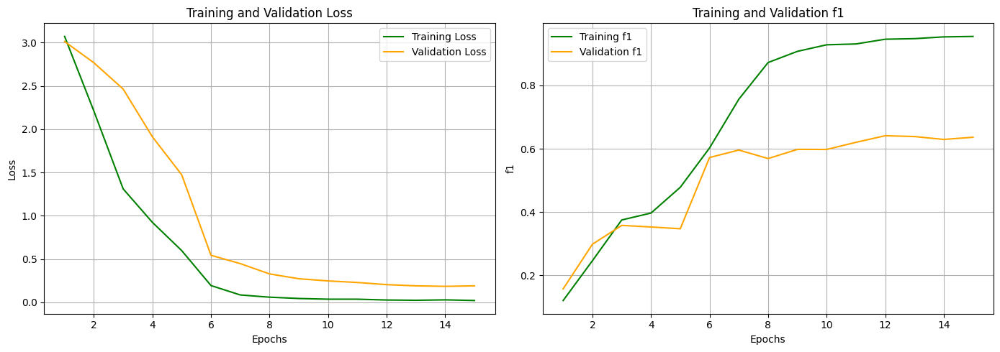

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - f1_score: 0.0936 - loss: 3.6086 - val_f1_score: 0.1236 - val_loss: 3.0412
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - f1_score: 0.1957 - loss: 2.3129 - val_f1_score: 0.2518 - val_loss: 2.7654
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.3144 - loss: 1.4869 - val_f1_score: 0.3961 - val_loss: 2.1618
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.3870 - loss: 0.4362 - val_f1_score: 0.3334 - val_loss: 1.8147
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.4529 - loss: 0.5456 - val_f1_score: 0.4474 - val_loss: 0.9169
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.5383 - loss: 0.2622 - val_f1_score: 0.5091 - val_loss: 0.7591
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.6532 - loss: 0.1490 - val_f1_score: 0.5485 - val_loss: 0.4280
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.7092 - loss: 0.0639 - val_f1_score: 0.56

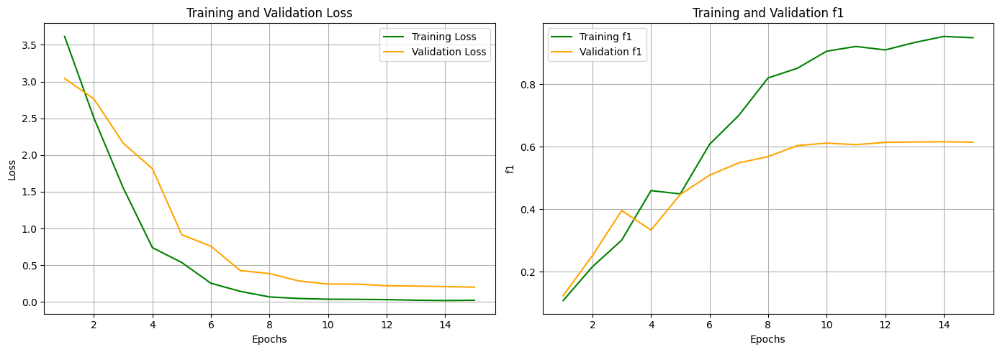

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - f1_score: 0.0489 - loss: 3.5287 - val_f1_score: 0.0847 - val_loss: 3.0458
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - f1_score: 0.2191 - loss: 2.7128 - val_f1_score: 0.2734 - val_loss: 2.7528
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - f1_score: 0.3571 - loss: 0.9984 - val_f1_score: 0.3517 - val_loss: 2.4083
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - f1_score: 0.4718 - loss: 0.5104 - val_f1_score: 0.4575 - val_loss: 1.5213
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.5398 - loss: 0.2328 - val_f1_score: 0.5736 - val_loss: 0.6421
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.6549 - loss: 0.0926 - val_f1_score: 0.5909 - val_loss: 0.3704
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.7362 - loss: 0.0489 - val_f1_score: 0.5796 - val_loss: 0.2685
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - f1_score: 0.7323 - loss: 0.0348 - val_f1_score: 0.

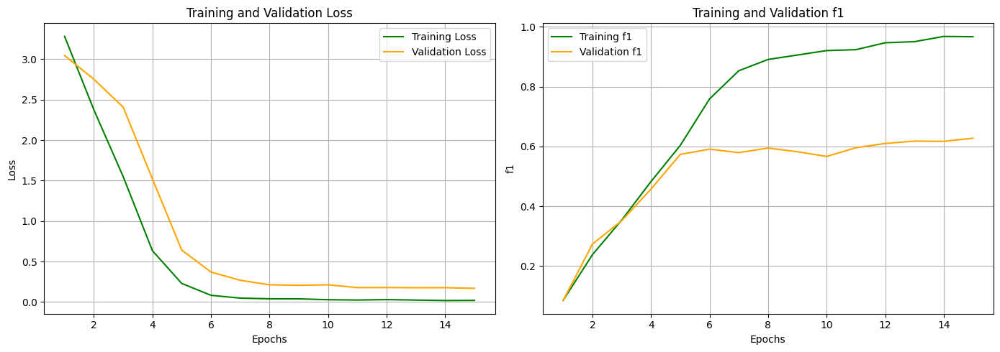

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 55ms/step - f1_score: 0.0592 - loss: 3.0828 - val_f1_score: 0.0832 - val_loss: 3.0293
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.1962 - loss: 3.3947 - val_f1_score: 0.2852 - val_loss: 2.7187
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.3674 - loss: 1.3896 - val_f1_score: 0.3910 - val_loss: 2.0527
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - f1_score: 0.4300 - loss: 0.4372 - val_f1_score: 0.3960 - val_loss: 1.5511
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.4581 - loss: 0.4646 - val_f1_score: 0.4378 - val_loss: 0.9837
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.6055 - loss: 0.0833 - val_f1_score: 0.5843 - val_loss: 0.3613
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.7334 - loss: 0.0525 - val_f1_score: 0.6060 - val_loss: 0.2912
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - f1_score: 0.7590 - loss: 0.0334 - val_f1_score: 0.61

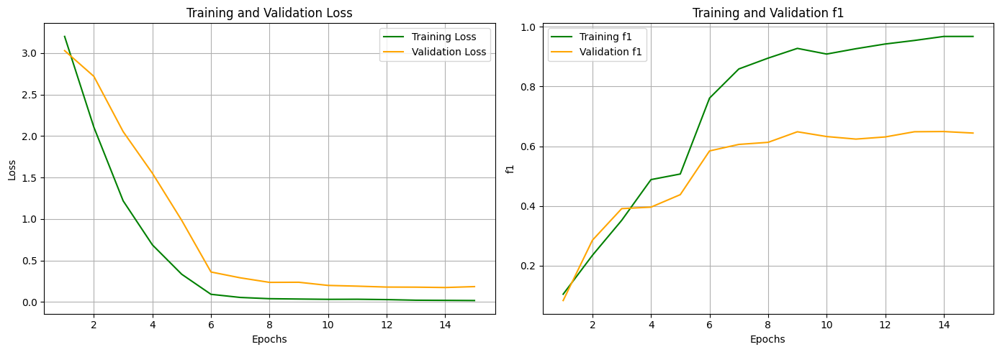

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 46ms/step - f1_score: 0.0552 - loss: 3.1962 - val_f1_score: 0.1598 - val_loss: 3.0096
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.2135 - loss: 1.7806 - val_f1_score: 0.2586 - val_loss: 2.8915
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - f1_score: 0.2864 - loss: 1.3724 - val_f1_score: 0.3835 - val_loss: 2.0828
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.4366 - loss: 0.4070 - val_f1_score: 0.3774 - val_loss: 2.3744
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.4299 - loss: 0.3576 - val_f1_score: 0.4644 - val_loss: 0.9117
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.6140 - loss: 0.1386 - val_f1_score: 0.5849 - val_loss: 0.3888
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - f1_score: 0.6561 - loss: 0.1029 - val_f1_score: 0.5769 - val_loss: 0.4980
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.6713 - loss: 0.0931 - val_f1_score: 0.58

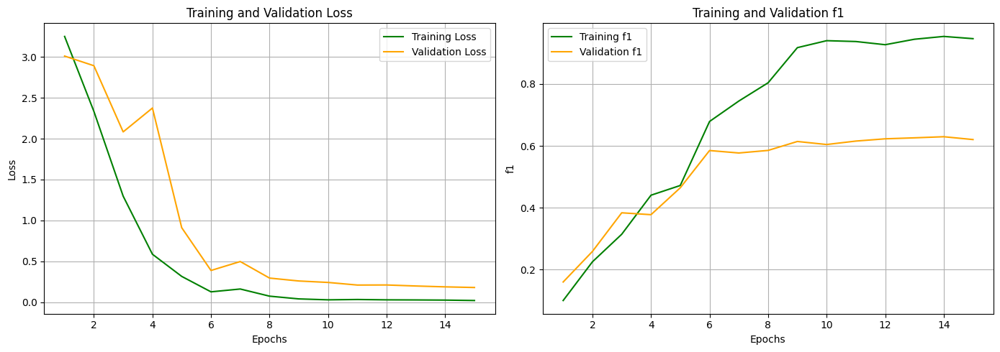

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - f1_score: 0.0515 - loss: 3.2365 - val_f1_score: 0.0734 - val_loss: 3.0655
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.1585 - loss: 2.2852 - val_f1_score: 0.2426 - val_loss: 2.8384
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.2764 - loss: 1.3937 - val_f1_score: 0.2482 - val_loss: 2.6275
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.3834 - loss: 0.6674 - val_f1_score: 0.3687 - val_loss: 1.6498
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.4630 - loss: 0.3752 - val_f1_score: 0.4091 - val_loss: 1.7573
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.5835 - loss: 0.1995 - val_f1_score: 0.5480 - val_loss: 0.6191
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.6820 - loss: 0.0751 - val_f1_score: 0.5530 - val_loss: 0.4659
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.7792 - loss: 0.0569 - val_f1_score: 0.59

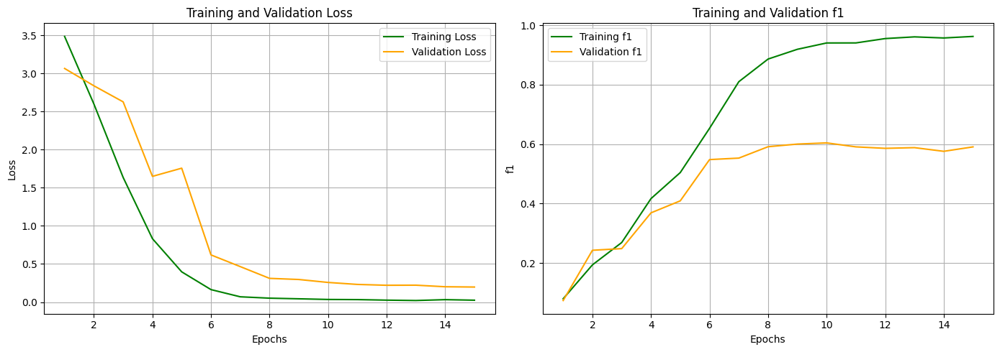

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - f1_score: 0.0307 - loss: 3.5531 - val_f1_score: 0.1717 - val_loss: 2.9874
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step - f1_score: 0.2260 - loss: 1.6169 - val_f1_score: 0.1951 - val_loss: 2.8405
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.2633 - loss: 2.4931 - val_f1_score: 0.3586 - val_loss: 2.4067
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - f1_score: 0.4123 - loss: 0.6482 - val_f1_score: 0.4896 - val_loss: 1.3418
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - f1_score: 0.5907 - loss: 0.1513 - val_f1_score: 0.5001 - val_loss: 0.7304
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.7003 - loss: 0.0908 - val_f1_score: 0.5662 - val_loss: 0.4301
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - f1_score: 0.7484 - loss: 0.0478 - val_f1_score: 0.5753 - val_loss: 0.3841
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - f1_score: 0.7335 - loss: 0.0449 - val_f1_score: 0

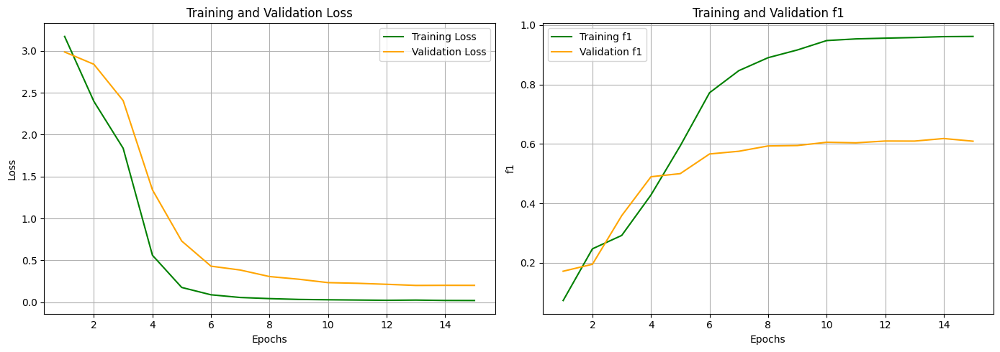

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 76ms/step - f1_score: 0.0380 - loss: 3.4544 - val_f1_score: 0.1629 - val_loss: 3.0564
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.2290 - loss: 3.0936 - val_f1_score: 0.3201 - val_loss: 2.7986
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - f1_score: 0.3633 - loss: 1.4347 - val_f1_score: 0.3135 - val_loss: 2.2500
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step - f1_score: 0.4109 - loss: 0.5842 - val_f1_score: 0.4193 - val_loss: 1.4171
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 58ms/step - f1_score: 0.5520 - loss: 0.2230 - val_f1_score: 0.4849 - val_loss: 0.9975
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - f1_score: 0.7447 - loss: 0.0915 - val_f1_score: 0.5426 - val_loss: 0.4839
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - f1_score: 0.7104 - loss: 0.0705 - val_f1_score: 0.5773 - val_loss: 0.3564
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - f1_score: 0.8214 - loss: 0.0341 - val_f1_score: 0.

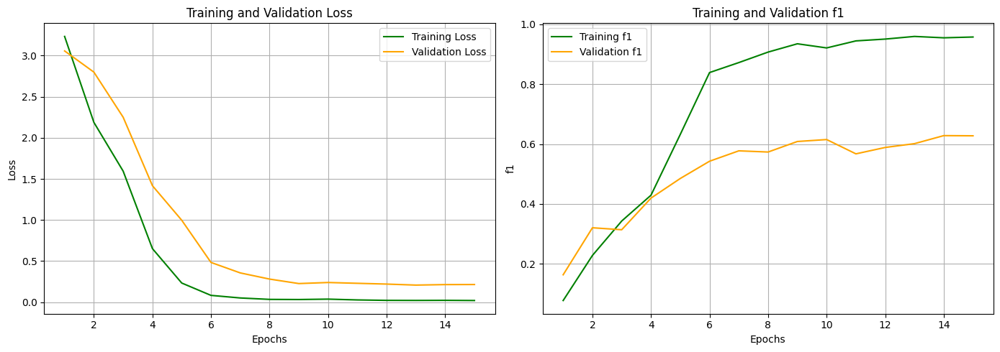

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - f1_score: 0.0531 - loss: 3.5339 - val_f1_score: 0.1946 - val_loss: 3.0586
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.2089 - loss: 1.9919 - val_f1_score: 0.2315 - val_loss: 2.9933
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - f1_score: 0.3235 - loss: 0.7753 - val_f1_score: 0.2766 - val_loss: 2.4742
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.3537 - loss: 1.0821 - val_f1_score: 0.4739 - val_loss: 1.3202
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - f1_score: 0.5356 - loss: 0.4081 - val_f1_score: 0.3480 - val_loss: 1.4684
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.5865 - loss: 0.3401 - val_f1_score: 0.5802 - val_loss: 0.4440
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - f1_score: 0.7191 - loss: 0.0823 - val_f1_score: 0.5321 - val_loss: 0.6537
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 69ms/step - f1_score: 0.7469 - loss: 0.0781 - val_f1_score: 0

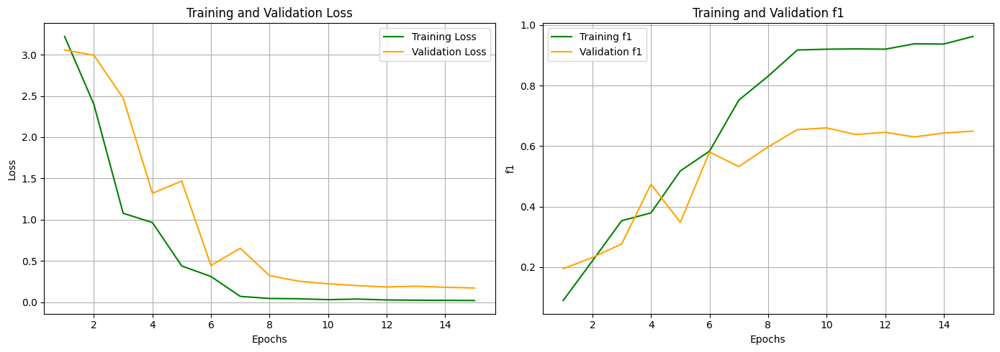

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - f1_score: 0.0762 - loss: 2.8187 - val_f1_score: 0.2126 - val_loss: 3.0019
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.2611 - loss: 2.0308 - val_f1_score: 0.2951 - val_loss: 2.8089
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - f1_score: 0.3764 - loss: 1.1372 - val_f1_score: 0.3866 - val_loss: 2.0792
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.4611 - loss: 0.4496 - val_f1_score: 0.5687 - val_loss: 1.1610
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 71ms/step - f1_score: 0.6507 - loss: 0.1193 - val_f1_score: 0.5675 - val_loss: 0.5816
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step - f1_score: 0.7266 - loss: 0.0504 - val_f1_score: 0.6038 - val_loss: 0.3681
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.7254 - loss: 0.0443 - val_f1_score: 0.6104 - val_loss: 0.2782
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - f1_score: 0.7823 - loss: 0.0317 - val_f1_score: 0

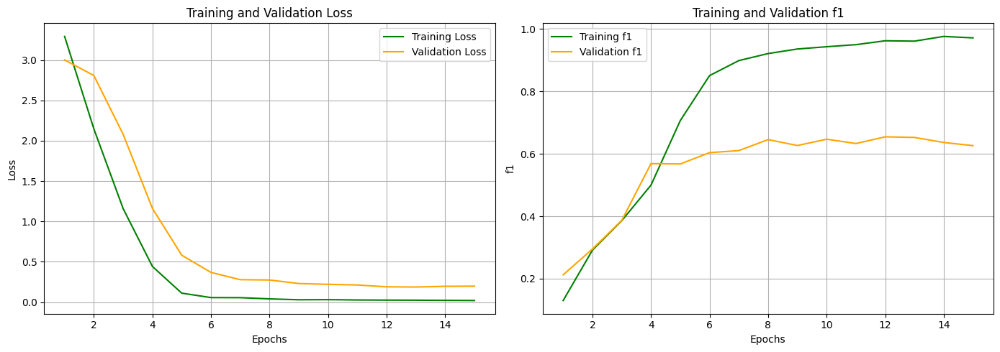

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - f1_score: 0.0736 - loss: 2.9901 - val_f1_score: 0.1627 - val_loss: 3.0346
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 73ms/step - f1_score: 0.1734 - loss: 2.5702 - val_f1_score: 0.2918 - val_loss: 2.8620
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 70ms/step - f1_score: 0.3004 - loss: 1.5813 - val_f1_score: 0.4158 - val_loss: 2.3130
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - f1_score: 0.4816 - loss: 0.6091 - val_f1_score: 0.4757 - val_loss: 1.3514
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - f1_score: 0.6158 - loss: 0.1974 - val_f1_score: 0.5647 - val_loss: 0.6358
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.6706 - loss: 0.0783 - val_f1_score: 0.6118 - val_loss: 0.3774
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - f1_score: 0.6756 - loss: 0.0497 - val_f1_score: 0.6557 - val_loss: 0.2885
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - f1_score: 0.7344 - loss: 0.0252 - val_f1_score: 0

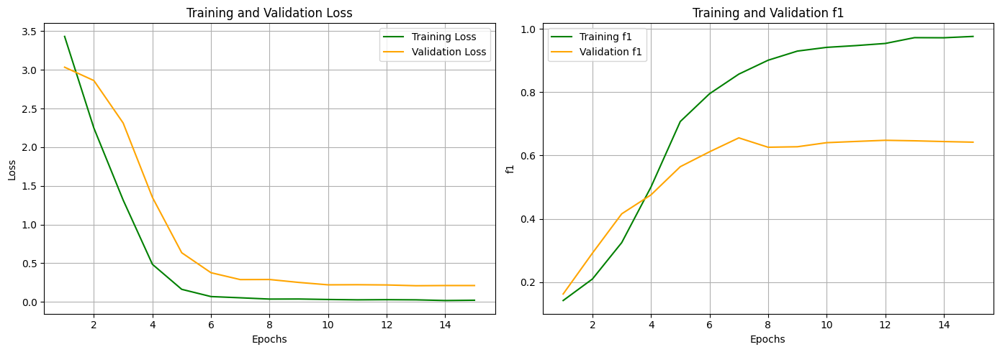

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step


In [ ]:
gru_layers_experiments = [
    [{'units': 32, 'return_sequences': True}],
    [{'units': 64, 'return_sequences': True}],
    [{'units': 128, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for gru_config in gru_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(architecture='GRU', layer_configs=gru_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.804971021147493
Experiment 1 Macro avg F1 std:  0.02543118234978756
Experiment 1 Accuracy mean:  0.9604444444444444
Experiment 1 Accuracy std:  0.0032659863237108917
Experiment 2 Macro avg F1 mean:  0.7928778820337914
Experiment 2 Macro avg F1 std:  0.030545170615581662
Experiment 2 Accuracy mean:  0.9606666666666666
Experiment 2 Accuracy std:  0.0047453681120139275
Experiment 3 Macro avg F1 mean:  0.8071801398299803
Experiment 3 Macro avg F1 std:  0.01989514299885076
Experiment 3 Accuracy mean:  0.9613333333333334
Experiment 3 Accuracy std:  0.0008314794192830975


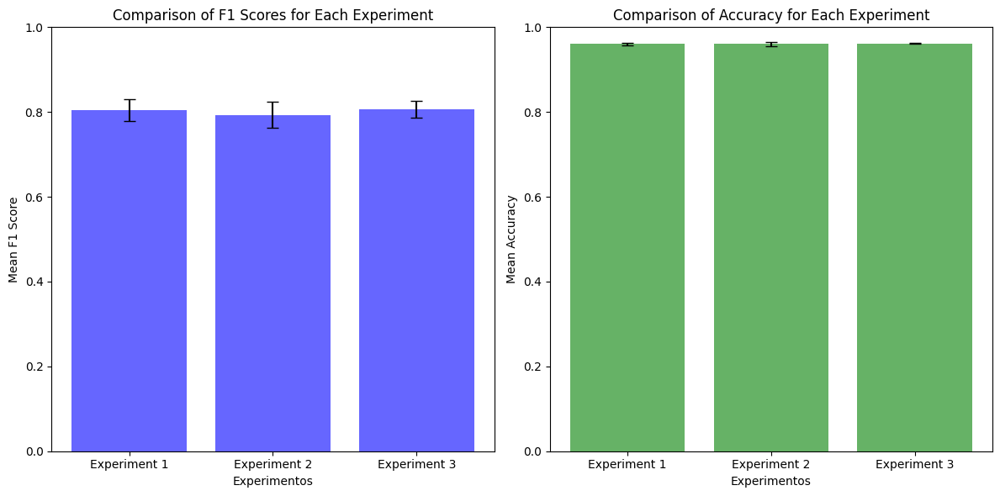

In [ ]:
plot_experiment_metrics(results)

Més capes

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - f1_score: 0.0197 - loss: 3.4800 - val_f1_score: 0.0607 - val_loss: 3.0027
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.0971 - loss: 3.8183 - val_f1_score: 0.2618 - val_loss: 2.8135
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.1845 - loss: 2.6431 - val_f1_score: 0.2646 - val_loss: 2.3260
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.3141 - loss: 2.2452 - val_f1_score: 0.3485 - val_loss: 1.9632
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - f1_score: 0.3494 - loss: 0.6368 - val_f1_score: 0.2758 - val_loss: 1.8498
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.3567 - loss: 0.8348 - val_f1_score: 0.3608 - val_loss: 1.6196
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.4323 - loss: 0.8410 - val_f1_score: 0.4515 - val_loss: 0.8274
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - f1_score: 0.5608 - loss: 0.1941 - val_f1_score: 0.45

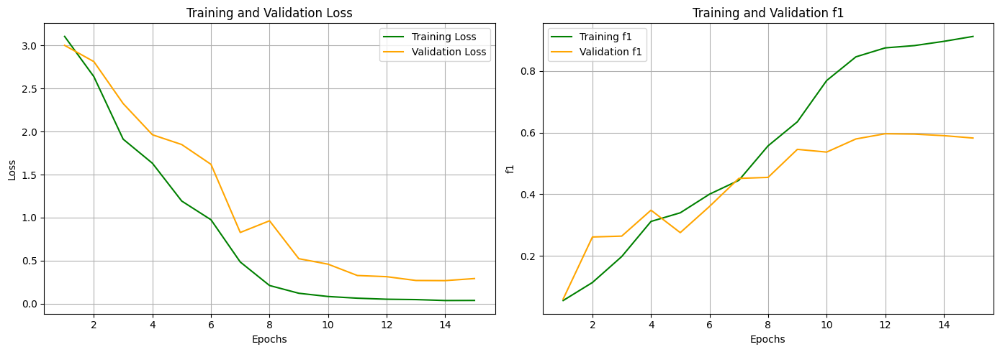

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - f1_score: 0.0199 - loss: 2.9327 - val_f1_score: 0.0672 - val_loss: 3.0326
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step - f1_score: 0.1433 - loss: 3.1662 - val_f1_score: 0.1498 - val_loss: 2.7595
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.2188 - loss: 1.6874 - val_f1_score: 0.1705 - val_loss: 2.6754
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.3186 - loss: 1.6961 - val_f1_score: 0.3906 - val_loss: 1.6380
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - f1_score: 0.4237 - loss: 0.8085 - val_f1_score: 0.2677 - val_loss: 1.2215
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.4152 - loss: 1.5803 - val_f1_score: 0.3968 - val_loss: 1.1098
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - f1_score: 0.5468 - loss: 0.3227 - val_f1_score: 0.4668 - val_loss: 0.8941
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - f1_score: 0.4998 - loss: 0.3134 - val_f1_score: 0.4

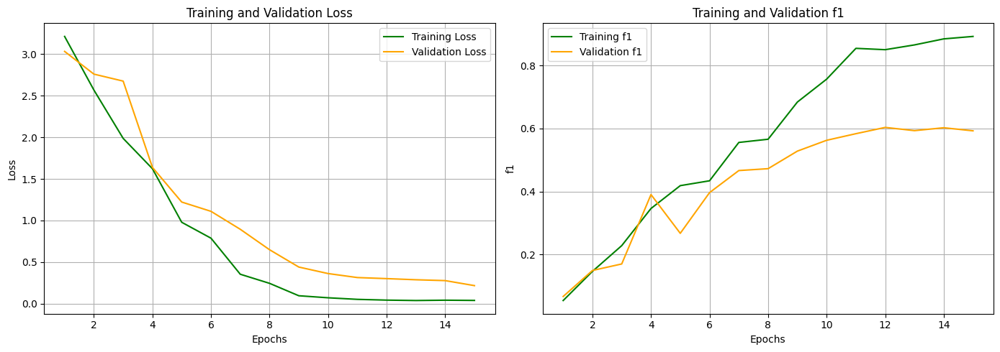

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 56ms/step - f1_score: 0.0735 - loss: 2.6209 - val_f1_score: 0.0517 - val_loss: 3.0615
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - f1_score: 0.1615 - loss: 2.1648 - val_f1_score: 0.1733 - val_loss: 2.7881
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - f1_score: 0.2742 - loss: 2.5372 - val_f1_score: 0.3167 - val_loss: 2.2603
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.3287 - loss: 1.3250 - val_f1_score: 0.4236 - val_loss: 1.4160
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.4011 - loss: 0.9561 - val_f1_score: 0.3742 - val_loss: 1.3220
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - f1_score: 0.4809 - loss: 0.4739 - val_f1_score: 0.4812 - val_loss: 0.7251
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.5067 - loss: 0.4962 - val_f1_score: 0.4305 - val_loss: 1.0445
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.5910 - loss: 0.1984 - val_f1_score: 0.55

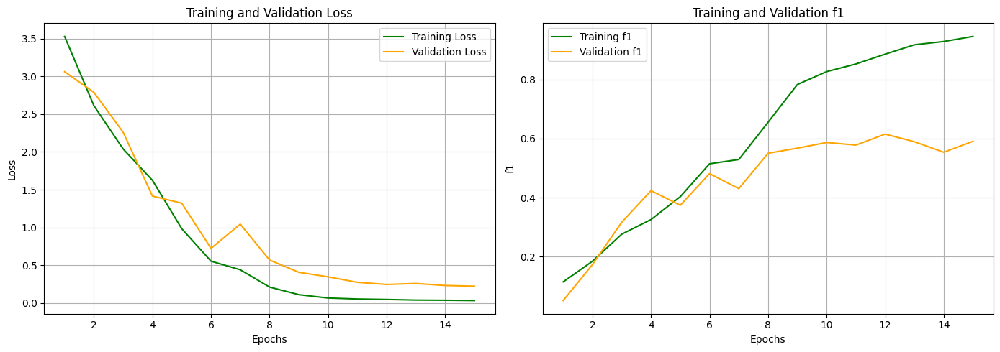

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 18s 54ms/step - f1_score: 0.0246 - loss: 3.3556 - val_f1_score: 0.0658 - val_loss: 3.0399
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - f1_score: 0.1417 - loss: 2.9140 - val_f1_score: 0.2108 - val_loss: 2.8430
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - f1_score: 0.2382 - loss: 1.8754 - val_f1_score: 0.2776 - val_loss: 2.2897
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - f1_score: 0.3587 - loss: 1.2399 - val_f1_score: 0.2700 - val_loss: 1.7761
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 43ms/step - f1_score: 0.4147 - loss: 1.2235 - val_f1_score: 0.4364 - val_loss: 1.1512
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.4903 - loss: 0.6894 - val_f1_score: 0.4336 - val_loss: 1.1491
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 47ms/step - f1_score: 0.5084 - loss: 0.4153 - val_f1_score: 0.4413 - val_loss: 1.0560
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - f1_score: 0.5446 - loss: 0.3401 - val_f1_score: 0.

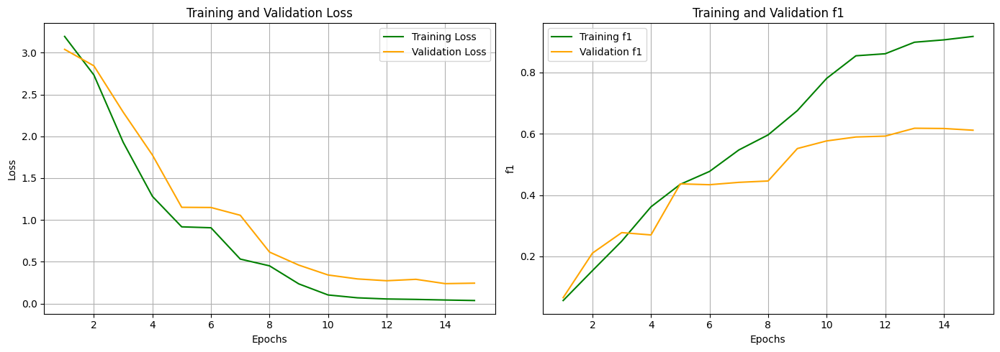

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 44ms/step - f1_score: 0.0299 - loss: 2.7349 - val_f1_score: 0.0034 - val_loss: 3.0398
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - f1_score: 0.0805 - loss: 3.4645 - val_f1_score: 0.2205 - val_loss: 2.8421
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.2500 - loss: 1.8715 - val_f1_score: 0.2218 - val_loss: 2.7020
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - f1_score: 0.2568 - loss: 1.3781 - val_f1_score: 0.3662 - val_loss: 1.6621
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 55ms/step - f1_score: 0.3716 - loss: 0.8290 - val_f1_score: 0.4040 - val_loss: 1.4705
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.3953 - loss: 0.4431 - val_f1_score: 0.3563 - val_loss: 2.1935
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.3448 - loss: 0.8970 - val_f1_score: 0.4228 - val_loss: 1.1583
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - f1_score: 0.4382 - loss: 0.4142 - val_f1_score: 0

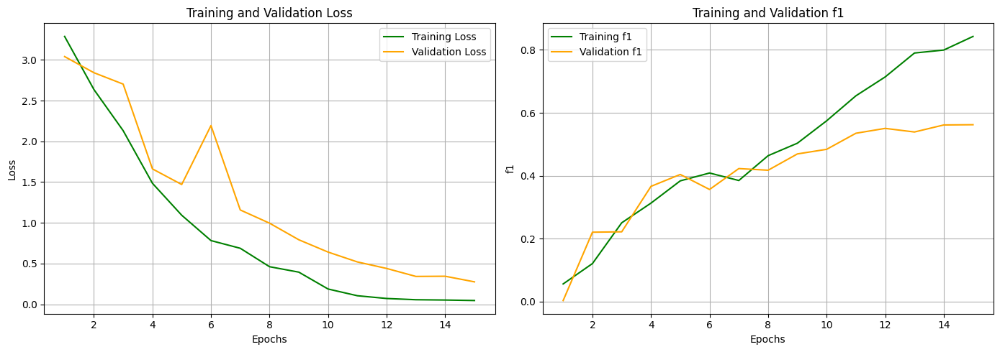

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - f1_score: 0.0168 - loss: 2.5287 - val_f1_score: 0.0050 - val_loss: 3.0930
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.0606 - loss: 2.7930 - val_f1_score: 0.1026 - val_loss: 2.9428
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - f1_score: 0.0947 - loss: 2.6711 - val_f1_score: 0.1348 - val_loss: 2.6074
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 44ms/step - f1_score: 0.1822 - loss: 2.1026 - val_f1_score: 0.1525 - val_loss: 2.5386
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - f1_score: 0.2366 - loss: 2.4326 - val_f1_score: 0.2282 - val_loss: 2.2211
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 45ms/step - f1_score: 0.3476 - loss: 1.0977 - val_f1_score: 0.3212 - val_loss: 2.1817
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step - f1_score: 0.3633 - loss: 0.9108 - val_f1_score: 0.3634 - val_loss: 1.7961
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.4632 - loss: 0.5139 - val_f1_score: 

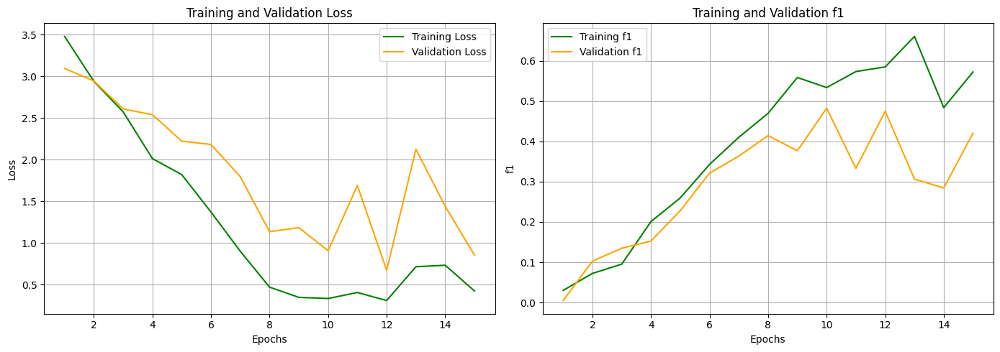

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 43ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - f1_score: 0.0329 - loss: 3.4991 - val_f1_score: 6.0205e-04 - val_loss: 3.0528
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - f1_score: 0.0665 - loss: 3.3202 - val_f1_score: 0.0646 - val_loss: 2.8857
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - f1_score: 0.1005 - loss: 2.1569 - val_f1_score: 0.0968 - val_loss: 2.7911
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - f1_score: 0.1798 - loss: 2.0506 - val_f1_score: 0.1812 - val_loss: 2.6992
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step - f1_score: 0.2381 - loss: 1.6800 - val_f1_score: 0.2402 - val_loss: 1.7359
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - f1_score: 0.3070 - loss: 1.5637 - val_f1_score: 0.3272 - val_loss: 1.5561
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - f1_score: 0.3537 - loss: 1.1057 - val_f1_score: 0.3279 - val_loss: 1.7933
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - f1_score: 0.4351 - loss: 0.4828 - val_f1_score

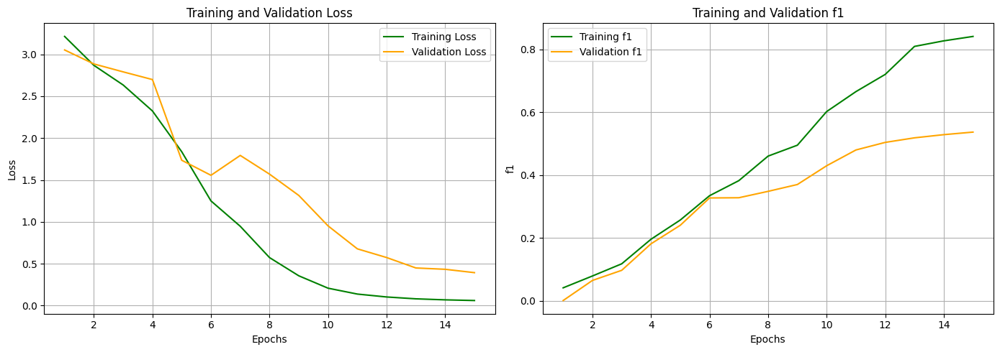

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step - f1_score: 0.0178 - loss: 3.1778 - val_f1_score: 0.0233 - val_loss: 3.0412
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - f1_score: 0.1188 - loss: 3.0680 - val_f1_score: 0.0937 - val_loss: 2.8520
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.1657 - loss: 1.7629 - val_f1_score: 0.1785 - val_loss: 2.6005
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 49ms/step - f1_score: 0.2531 - loss: 1.7565 - val_f1_score: 0.2483 - val_loss: 2.2700
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step - f1_score: 0.3203 - loss: 1.3136 - val_f1_score: 0.2007 - val_loss: 2.8042
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - f1_score: 0.2745 - loss: 1.4889 - val_f1_score: 0.3621 - val_loss: 1.5825
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.3235 - loss: 1.1205 - val_f1_score: 0.3056 - val_loss: 1.8179
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - f1_score: 0.4144 - loss: 0.5349 - val_f1_score: 0

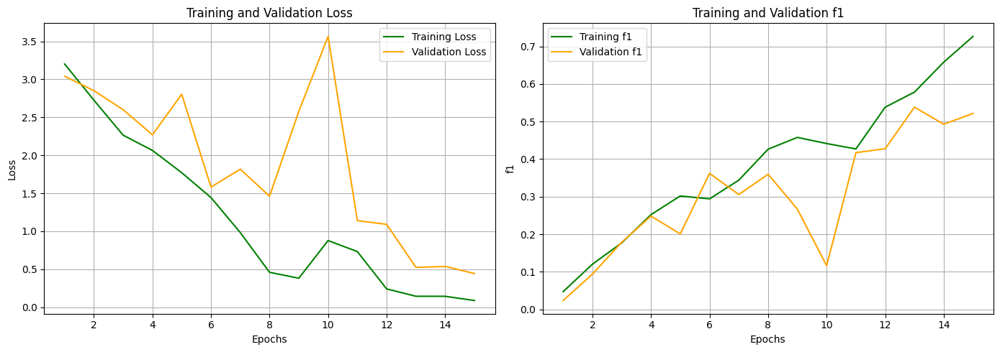

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step - f1_score: 0.0306 - loss: 2.8389 - val_f1_score: 0.1296 - val_loss: 3.0093
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - f1_score: 0.1136 - loss: 2.4021 - val_f1_score: 0.0541 - val_loss: 2.7963
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - f1_score: 0.1365 - loss: 2.7098 - val_f1_score: 0.2042 - val_loss: 2.3582
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - f1_score: 0.2151 - loss: 1.6037 - val_f1_score: 0.1656 - val_loss: 2.5125
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - f1_score: 0.2566 - loss: 1.7894 - val_f1_score: 0.2844 - val_loss: 1.9411
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - f1_score: 0.3198 - loss: 1.3139 - val_f1_score: 0.3436 - val_loss: 2.1175
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - f1_score: 0.3760 - loss: 0.7764 - val_f1_score: 0.3228 - val_loss: 1.4626
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.3546 - loss: 0.5930 - val_f1_score: 0.

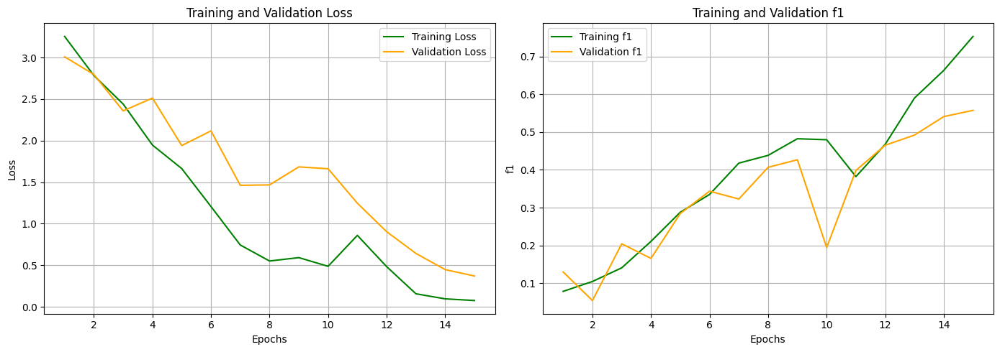

29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - f1_score: 0.0155 - loss: 2.6142 - val_f1_score: 0.0060 - val_loss: 3.0523
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 57ms/step - f1_score: 0.0687 - loss: 3.1845 - val_f1_score: 0.1452 - val_loss: 2.5303
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 72ms/step - f1_score: 0.1174 - loss: 2.5943 - val_f1_score: 0.1753 - val_loss: 2.5321
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 56ms/step - f1_score: 0.1918 - loss: 2.1966 - val_f1_score: 0.1360 - val_loss: 2.2372
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step - f1_score: 0.2518 - loss: 2.0389 - val_f1_score: 0.2752 - val_loss: 1.7802
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - f1_score: 0.2947 - loss: 1.1980 - val_f1_score: 0.3050 - val_loss: 1.6630
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - f1_score: 0.2665 - loss: 1.2294 - val_f1_score: 0.2459 - val_loss: 1.8826
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step - f1_score: 0.3133 - loss: 1.0541 - val_f1_score: 0.

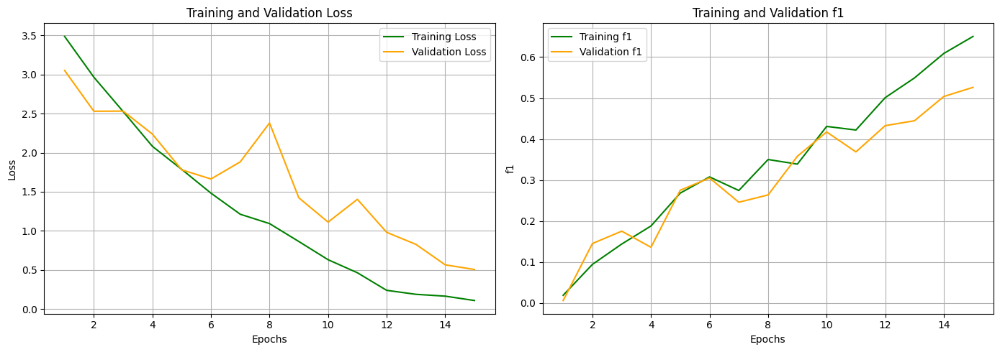

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step


In [ ]:
gru_layers_experiments = [
    [{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True}],
    [{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True},{'units': 32, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for gru_config in gru_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(architecture='GRU', layer_configs=gru_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.7122908724444684
Experiment 1 Macro avg F1 std:  0.04317488598971698
Experiment 1 Accuracy mean:  0.9428888888888889
Experiment 1 Accuracy std:  0.00796907603424048
Experiment 2 Macro avg F1 mean:  0.5769906956907124
Experiment 2 Macro avg F1 std:  0.062306248673234726
Experiment 2 Accuracy mean:  0.8755555555555554
Experiment 2 Accuracy std:  0.05073290017822585


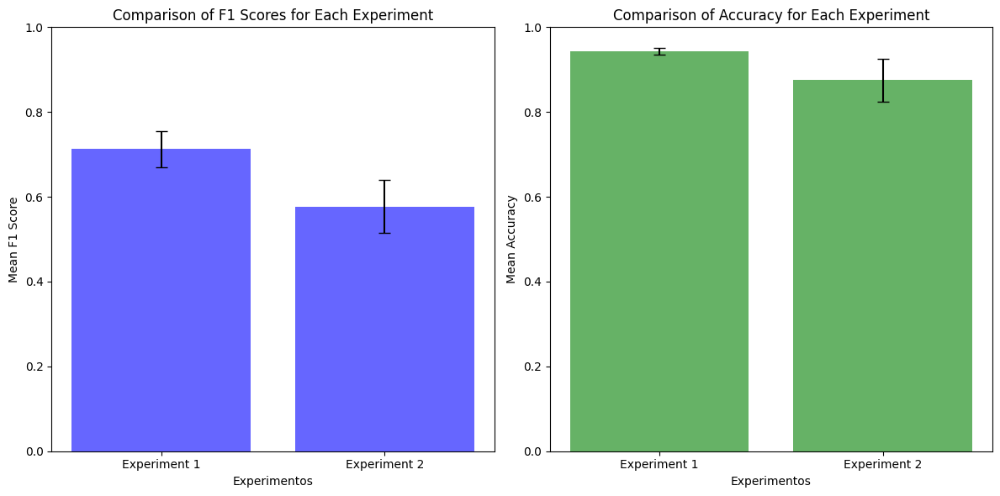

In [ ]:
plot_experiment_metrics(results)

#### Provar LSTM

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - f1_score: 0.0325 - loss: 3.0056 - val_f1_score: 0.1270 - val_loss: 3.0233
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.1884 - loss: 2.7356 - val_f1_score: 0.2515 - val_loss: 2.7810
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - f1_score: 0.3319 - loss: 1.2264 - val_f1_score: 0.3724 - val_loss: 2.3621
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.4279 - loss: 1.1504 - val_f1_score: 0.4866 - val_loss: 1.4434
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.5285 - loss: 0.3296 - val_f1_score: 0.4846 - val_loss: 0.7161
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.5537 - loss: 0.2100 - val_f1_score: 0.5514 - val_loss: 0.5359
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.6764 - loss: 0.1314 - val_f1_score: 0.5661 - val_loss: 0.3496
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - f1_score: 0.6827 - loss: 0.0838 - val_f1_score: 0.579

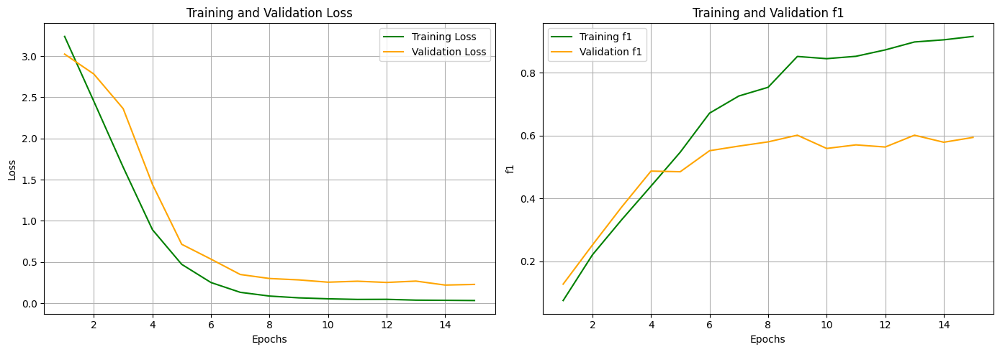

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - f1_score: 0.0463 - loss: 3.2044 - val_f1_score: 0.1797 - val_loss: 3.0195
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - f1_score: 0.1870 - loss: 2.4026 - val_f1_score: 0.2408 - val_loss: 2.8363
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.3086 - loss: 1.7492 - val_f1_score: 0.4172 - val_loss: 2.3424
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - f1_score: 0.4352 - loss: 1.0268 - val_f1_score: 0.4971 - val_loss: 1.5421
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - f1_score: 0.4587 - loss: 0.5172 - val_f1_score: 0.3688 - val_loss: 1.4631
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - f1_score: 0.4584 - loss: 0.4577 - val_f1_score: 0.4283 - val_loss: 0.8168
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - f1_score: 0.5241 - loss: 0.1923 - val_f1_score: 0.5230 - val_loss: 0.5536
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - f1_score: 0.6605 - loss: 0.1051 - val_f1_score: 0.524

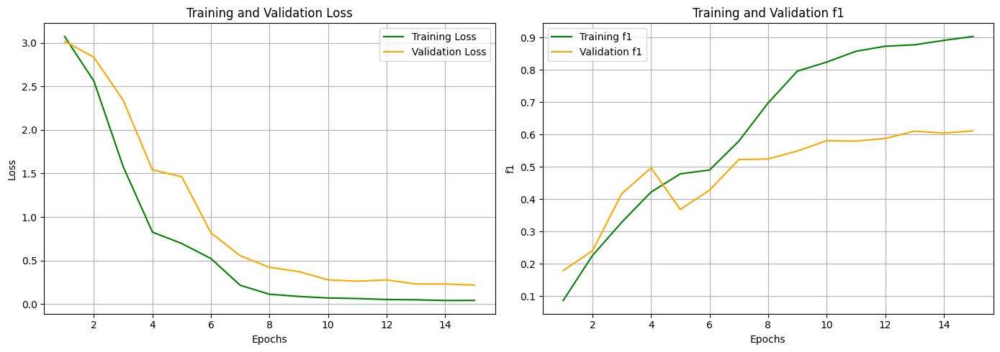

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 28ms/step - f1_score: 0.0534 - loss: 3.5603 - val_f1_score: 0.1628 - val_loss: 3.0339
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - f1_score: 0.2495 - loss: 3.7510 - val_f1_score: 0.3003 - val_loss: 2.7863
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - f1_score: 0.3714 - loss: 1.0773 - val_f1_score: 0.4602 - val_loss: 2.2613
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - f1_score: 0.4656 - loss: 0.9707 - val_f1_score: 0.4817 - val_loss: 1.4171
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.5053 - loss: 0.4273 - val_f1_score: 0.5611 - val_loss: 0.5878
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.6435 - loss: 0.1304 - val_f1_score: 0.5691 - val_loss: 0.4348
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - f1_score: 0.6431 - loss: 0.1007 - val_f1_score: 0.6075 - val_loss: 0.3157
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.7675 - loss: 0.0642 - val_f1_score: 0.61

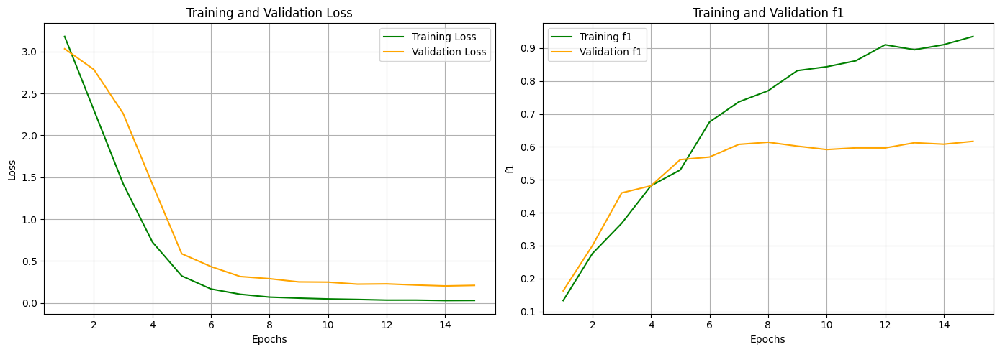

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - f1_score: 0.0429 - loss: 3.3831 - val_f1_score: 0.1344 - val_loss: 3.0391
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.2001 - loss: 2.4135 - val_f1_score: 0.2637 - val_loss: 2.8677
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.2653 - loss: 1.2123 - val_f1_score: 0.3768 - val_loss: 2.4251
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - f1_score: 0.3991 - loss: 0.9085 - val_f1_score: 0.4441 - val_loss: 1.6174
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.4811 - loss: 0.4138 - val_f1_score: 0.4993 - val_loss: 0.8376
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - f1_score: 0.5608 - loss: 0.3059 - val_f1_score: 0.5464 - val_loss: 0.5029
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - f1_score: 0.6301 - loss: 0.1374 - val_f1_score: 0.5388 - val_loss: 0.3781
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - f1_score: 0.6526 - loss: 0.0953 - val_f1_score: 0.56

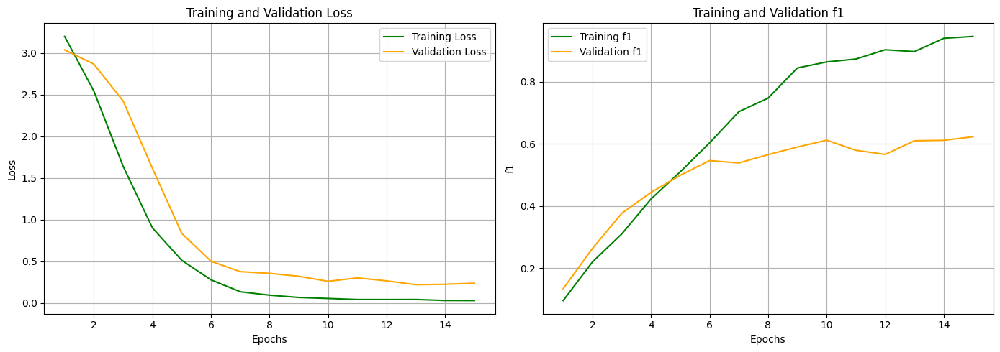

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 27ms/step - f1_score: 0.0541 - loss: 2.9132 - val_f1_score: 0.1316 - val_loss: 3.0230
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - f1_score: 0.1913 - loss: 2.1328 - val_f1_score: 0.2718 - val_loss: 2.8624
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.3412 - loss: 1.9831 - val_f1_score: 0.4393 - val_loss: 2.2946
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - f1_score: 0.4332 - loss: 0.5411 - val_f1_score: 0.4731 - val_loss: 1.4754
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - f1_score: 0.4763 - loss: 0.5472 - val_f1_score: 0.4844 - val_loss: 0.8717
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.5134 - loss: 0.2365 - val_f1_score: 0.5236 - val_loss: 0.5818
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.5833 - loss: 0.1677 - val_f1_score: 0.5320 - val_loss: 0.4310
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - f1_score: 0.6769 - loss: 0.0974 - val_f1_score: 0.549

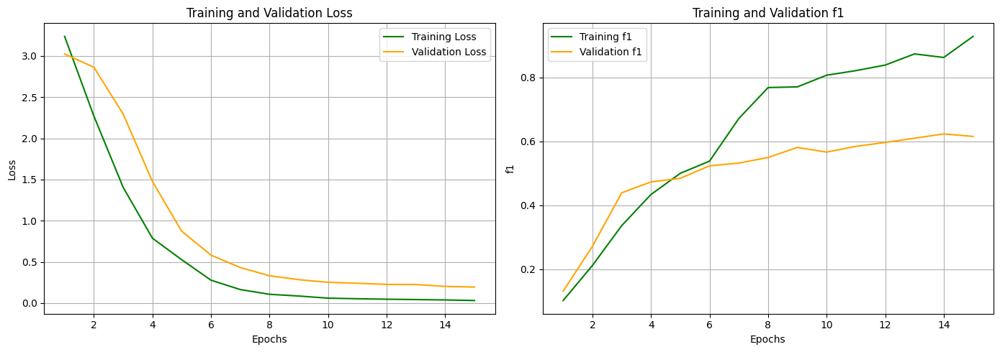

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - f1_score: 0.0533 - loss: 3.3878 - val_f1_score: 0.1542 - val_loss: 3.0261
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.2007 - loss: 2.2866 - val_f1_score: 0.2848 - val_loss: 2.8864
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.3447 - loss: 1.0933 - val_f1_score: 0.4032 - val_loss: 2.5181
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - f1_score: 0.4159 - loss: 0.6380 - val_f1_score: 0.4541 - val_loss: 1.6306
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 30ms/step - f1_score: 0.5321 - loss: 0.2840 - val_f1_score: 0.5961 - val_loss: 0.7150
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - f1_score: 0.6055 - loss: 0.1374 - val_f1_score: 0.5665 - val_loss: 0.5894
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 31ms/step - f1_score: 0.6612 - loss: 0.1052 - val_f1_score: 0.6009 - val_loss: 0.3460
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - f1_score: 0.7564 - loss: 0.0699 - val_f1_score: 0.618

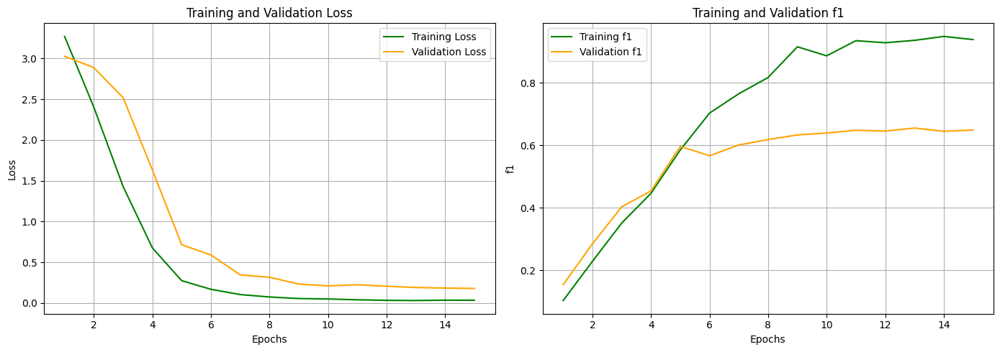

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.0322 - loss: 3.5022 - val_f1_score: 0.1259 - val_loss: 3.0098
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.2383 - loss: 2.5652 - val_f1_score: 0.3299 - val_loss: 2.8217
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.3750 - loss: 1.1772 - val_f1_score: 0.3556 - val_loss: 2.4655
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 42ms/step - f1_score: 0.4434 - loss: 0.7995 - val_f1_score: 0.5701 - val_loss: 1.0983
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.6198 - loss: 0.2006 - val_f1_score: 0.5769 - val_loss: 0.5833
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - f1_score: 0.6722 - loss: 0.1083 - val_f1_score: 0.6023 - val_loss: 0.3428
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 41ms/step - f1_score: 0.7057 - loss: 0.0815 - val_f1_score: 0.5979 - val_loss: 0.3292
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.7234 - loss: 0.0555 - val_f1_score: 0.602

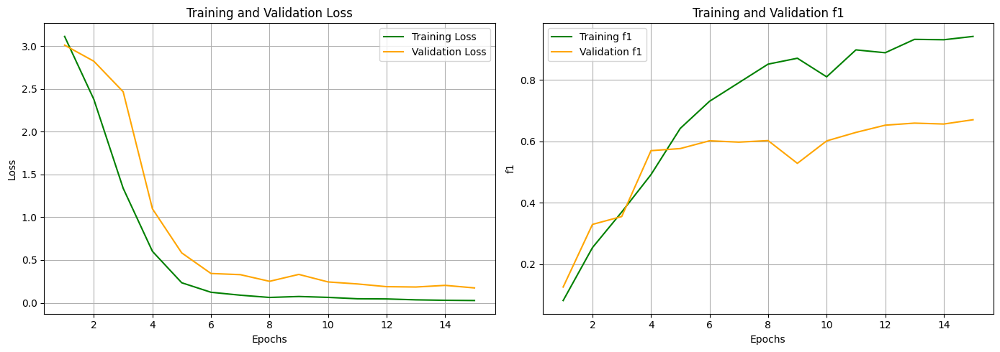

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step - f1_score: 0.0356 - loss: 3.1247 - val_f1_score: 0.2284 - val_loss: 3.0002
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.2081 - loss: 2.9110 - val_f1_score: 0.3957 - val_loss: 2.7864
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.3407 - loss: 1.4938 - val_f1_score: 0.2833 - val_loss: 2.4457
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 43ms/step - f1_score: 0.4333 - loss: 0.6778 - val_f1_score: 0.5143 - val_loss: 1.5299
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.4490 - loss: 0.4478 - val_f1_score: 0.5518 - val_loss: 0.6310
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - f1_score: 0.5790 - loss: 0.2656 - val_f1_score: 0.5431 - val_loss: 0.5162
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - f1_score: 0.6714 - loss: 0.0888 - val_f1_score: 0.5658 - val_loss: 0.3107
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.6963 - loss: 0.0814 - val_f1_score: 0.58

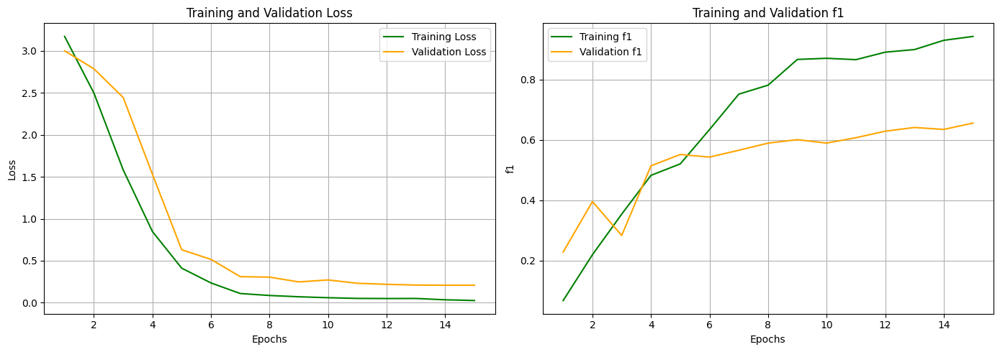

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - f1_score: 0.0748 - loss: 2.8434 - val_f1_score: 0.1455 - val_loss: 2.9921
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - f1_score: 0.2258 - loss: 2.5570 - val_f1_score: 0.3375 - val_loss: 2.8109
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - f1_score: 0.3723 - loss: 1.3949 - val_f1_score: 0.3122 - val_loss: 2.4097
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 45ms/step - f1_score: 0.3843 - loss: 0.9360 - val_f1_score: 0.4882 - val_loss: 1.6046
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - f1_score: 0.4280 - loss: 0.7336 - val_f1_score: 0.4872 - val_loss: 0.8160
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.5474 - loss: 0.2080 - val_f1_score: 0.5105 - val_loss: 0.5777
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - f1_score: 0.6255 - loss: 0.1524 - val_f1_score: 0.5371 - val_loss: 0.4687
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.6782 - loss: 0.0981 - val_f1_score: 0.5

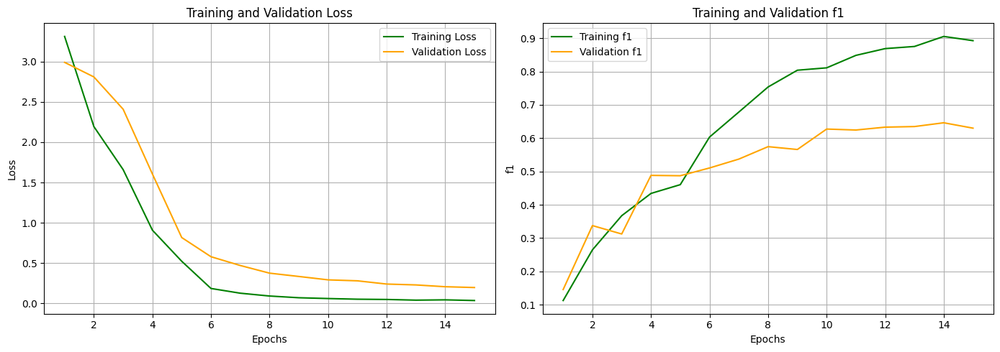

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - f1_score: 0.0717 - loss: 2.9992 - val_f1_score: 0.1299 - val_loss: 2.9995
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.2216 - loss: 1.9976 - val_f1_score: 0.1904 - val_loss: 2.8535
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.2893 - loss: 1.5981 - val_f1_score: 0.4159 - val_loss: 2.3783
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.4620 - loss: 1.1202 - val_f1_score: 0.4629 - val_loss: 1.5500
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - f1_score: 0.5199 - loss: 0.4747 - val_f1_score: 0.5521 - val_loss: 0.6685
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - f1_score: 0.6078 - loss: 0.1544 - val_f1_score: 0.5700 - val_loss: 0.4565
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.6180 - loss: 0.0773 - val_f1_score: 0.5484 - val_loss: 0.4445
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 31ms/step - f1_score: 0.6883 - loss: 0.0816 - val_f1_score: 0.617

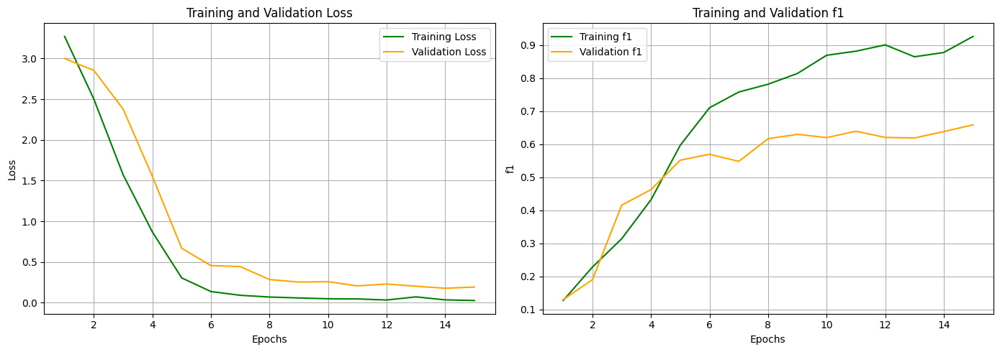

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 77ms/step - f1_score: 0.0408 - loss: 3.0267 - val_f1_score: 0.1408 - val_loss: 3.0486
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - f1_score: 0.1459 - loss: 2.8490 - val_f1_score: 0.2433 - val_loss: 2.8567
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - f1_score: 0.3464 - loss: 1.5718 - val_f1_score: 0.3915 - val_loss: 2.4234
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - f1_score: 0.4338 - loss: 0.7465 - val_f1_score: 0.4418 - val_loss: 1.5781
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - f1_score: 0.4726 - loss: 0.4660 - val_f1_score: 0.4766 - val_loss: 0.9039
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - f1_score: 0.5890 - loss: 0.1567 - val_f1_score: 0.5501 - val_loss: 0.4163
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - f1_score: 0.6563 - loss: 0.0871 - val_f1_score: 0.5751 - val_loss: 0.2827
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - f1_score: 0.7138 - loss: 0.0570 - val_f1_scor

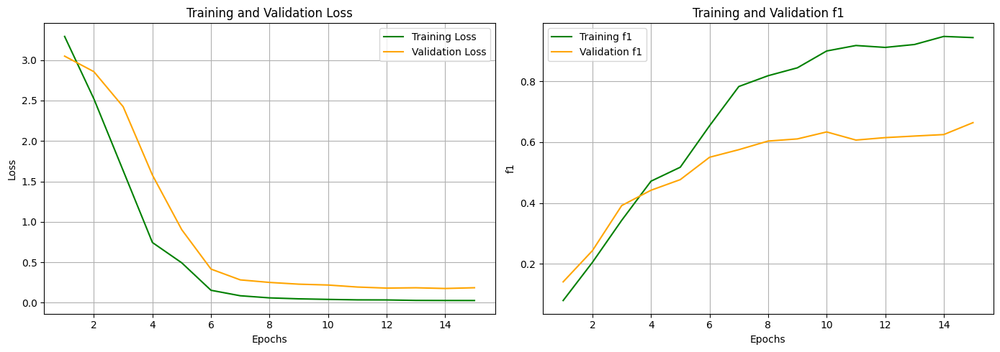

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 16s 95ms/step - f1_score: 0.0771 - loss: 3.0430 - val_f1_score: 0.1541 - val_loss: 3.0141
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - f1_score: 0.2751 - loss: 2.2161 - val_f1_score: 0.1022 - val_loss: 2.9424
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - f1_score: 0.2696 - loss: 1.4670 - val_f1_score: 0.3903 - val_loss: 2.3143
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - f1_score: 0.3565 - loss: 1.6571 - val_f1_score: 0.4079 - val_loss: 1.8279
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - f1_score: 0.4791 - loss: 0.5644 - val_f1_score: 0.5003 - val_loss: 0.6049
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - f1_score: 0.5862 - loss: 0.1959 - val_f1_score: 0.5514 - val_loss: 0.5290
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - f1_score: 0.6021 - loss: 0.1735 - val_f1_score: 0.5592 - val_loss: 0.3295
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 83ms/step - f1_score: 0.7242 - loss: 0.0555 - val_f1_scor

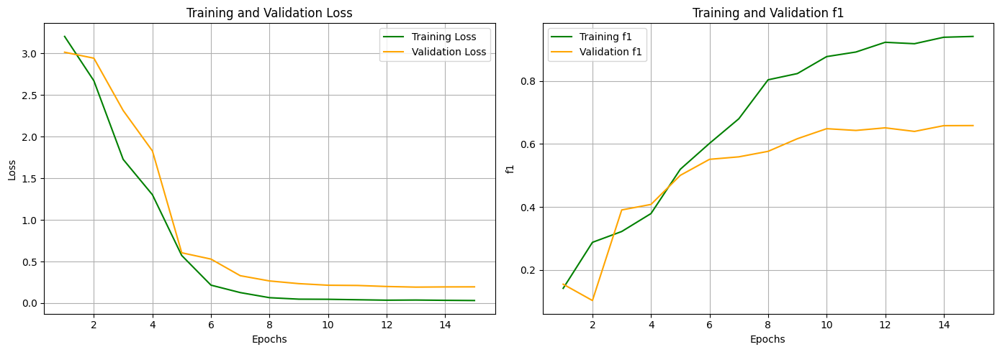

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 17s 94ms/step - f1_score: 0.0554 - loss: 2.9979 - val_f1_score: 0.1488 - val_loss: 3.0661
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 18s 78ms/step - f1_score: 0.2049 - loss: 1.9778 - val_f1_score: 0.1630 - val_loss: 2.9380
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 89ms/step - f1_score: 0.2592 - loss: 1.6305 - val_f1_score: 0.3078 - val_loss: 2.5675
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - f1_score: 0.4338 - loss: 0.7106 - val_f1_score: 0.4016 - val_loss: 1.4598
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - f1_score: 0.4903 - loss: 0.5132 - val_f1_score: 0.5061 - val_loss: 0.9603
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - f1_score: 0.6472 - loss: 0.1450 - val_f1_score: 0.5689 - val_loss: 0.4959
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 19s 80ms/step - f1_score: 0.6842 - loss: 0.0934 - val_f1_score: 0.5971 - val_loss: 0.3121
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 89ms/step - f1_score: 0.7023 - loss: 0.0490 - val_f1_scor

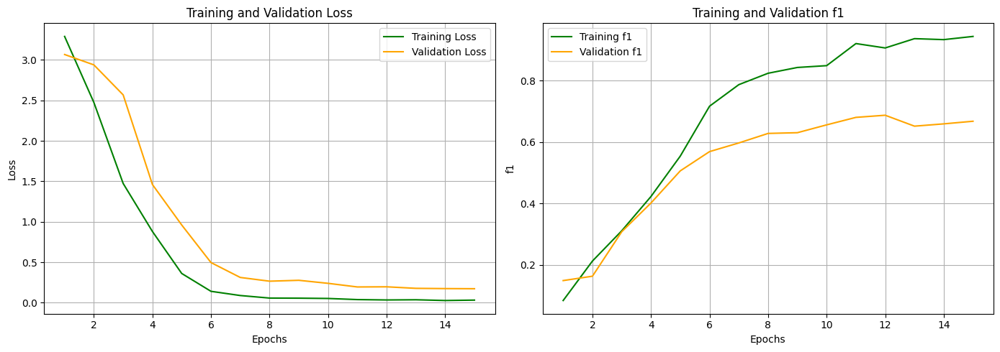

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - f1_score: 0.0335 - loss: 4.0617 - val_f1_score: 0.1392 - val_loss: 3.0558
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 84ms/step - f1_score: 0.2536 - loss: 2.4142 - val_f1_score: 0.3139 - val_loss: 2.8830
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - f1_score: 0.3359 - loss: 1.3451 - val_f1_score: 0.4115 - val_loss: 2.3594
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - f1_score: 0.4513 - loss: 0.4998 - val_f1_score: 0.4253 - val_loss: 1.4252
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.4961 - loss: 0.3022 - val_f1_score: 0.4852 - val_loss: 0.7212
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - f1_score: 0.6235 - loss: 0.1561 - val_f1_score: 0.5519 - val_loss: 0.4386
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 95ms/step - f1_score: 0.6467 - loss: 0.0851 - val_f1_score: 0.5967 - val_loss: 0.3147
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.7322 - loss: 0.0469 - val_f1_scor

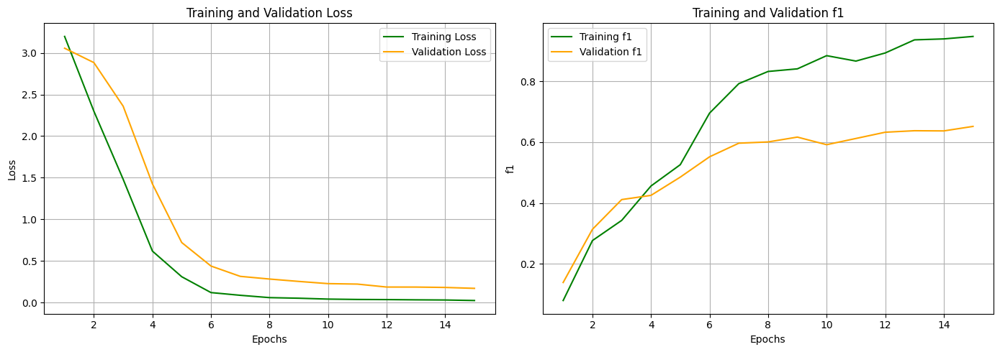

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 90ms/step - f1_score: 0.0776 - loss: 3.5079 - val_f1_score: 0.2123 - val_loss: 3.0084
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 90ms/step - f1_score: 0.1977 - loss: 2.3152 - val_f1_score: 0.3489 - val_loss: 2.8948
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 84ms/step - f1_score: 0.3922 - loss: 1.4494 - val_f1_score: 0.4815 - val_loss: 2.3127
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.4098 - loss: 0.9697 - val_f1_score: 0.4725 - val_loss: 1.4615
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 90ms/step - f1_score: 0.5199 - loss: 0.3663 - val_f1_score: 0.5059 - val_loss: 0.7308
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - f1_score: 0.5347 - loss: 0.4214 - val_f1_score: 0.5297 - val_loss: 0.6346
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 88ms/step - f1_score: 0.6438 - loss: 0.1052 - val_f1_score: 0.5126 - val_loss: 0.6604
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 20s 87ms/step - f1_score: 0.6592 - loss: 0.1073 - val_f1_scor

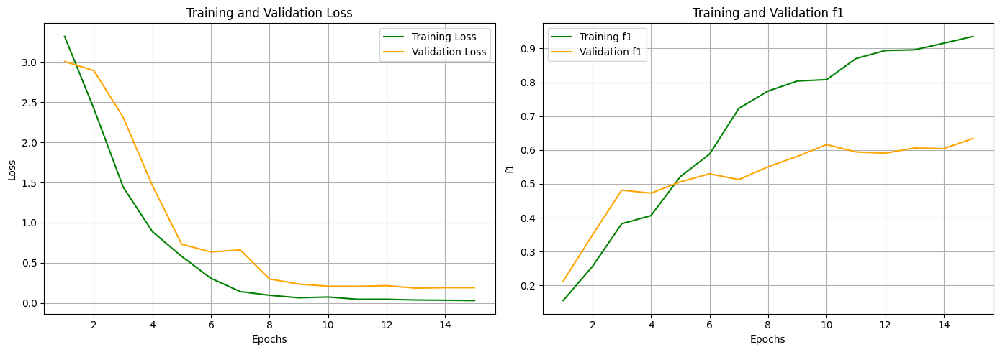

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


In [115]:
lstm_layers_experiments = [
    [{'units': 32, 'return_sequences': True}],
    [{'units': 64, 'return_sequences': True}],
    [{'units': 128, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for lstm_config in lstm_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(CNN=False,architecture='LSTM', layer_configs=lstm_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.7834229982719103
Experiment 1 Macro avg F1 std:  0.02195584967141664
Experiment 1 Accuracy mean:  0.9553333333333333
Experiment 1 Accuracy std:  0.004061259307221571
Experiment 2 Macro avg F1 mean:  0.8354804460414345
Experiment 2 Macro avg F1 std:  0.02419964014757565
Experiment 2 Accuracy mean:  0.9637777777777778
Experiment 2 Accuracy std:  0.0023934065809486753
Experiment 3 Macro avg F1 mean:  0.8385091588529011
Experiment 3 Macro avg F1 std:  0.0196013341601575
Experiment 3 Accuracy mean:  0.9671111111111111
Experiment 3 Accuracy std:  0.0031111111111111105


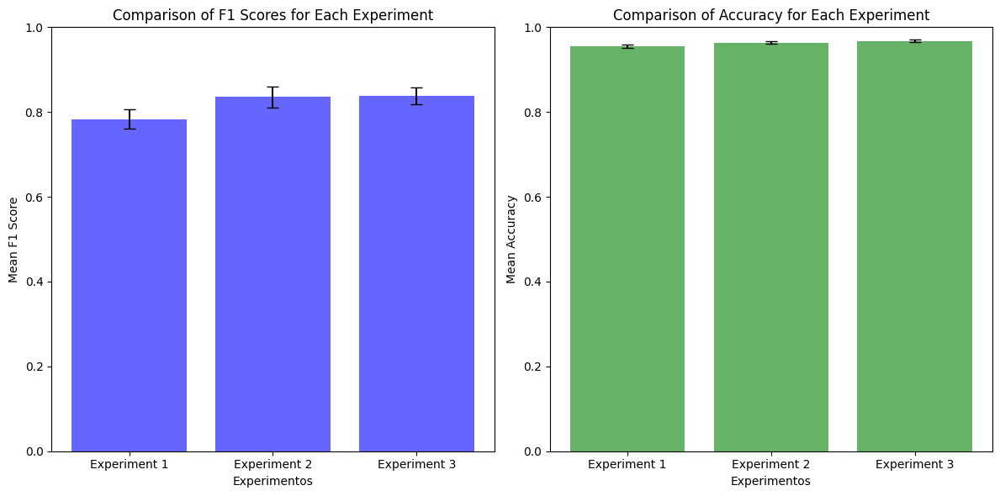

In [116]:
plot_experiment_metrics(results)

#### Provar GRU

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - f1_score: 0.0664 - loss: 3.1965 - val_f1_score: 0.1730 - val_loss: 3.0244
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - f1_score: 0.2169 - loss: 2.3213 - val_f1_score: 0.2186 - val_loss: 2.9640
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - f1_score: 0.2976 - loss: 1.2033 - val_f1_score: 0.4038 - val_loss: 2.1583
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - f1_score: 0.4314 - loss: 0.6241 - val_f1_score: 0.4497 - val_loss: 1.5104
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - f1_score: 0.5466 - loss: 0.3310 - val_f1_score: 0.5309 - val_loss: 0.6466
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - f1_score: 0.5961 - loss: 0.1898 - val_f1_score: 0.5128 - val_loss: 0.4144
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - f1_score: 0.6746 - loss: 0.1042 - val_f1_score: 0.5307 - val_loss: 0.3463
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - f1_score: 0.6732 - loss: 0.0816 - val_f1_score: 0.545

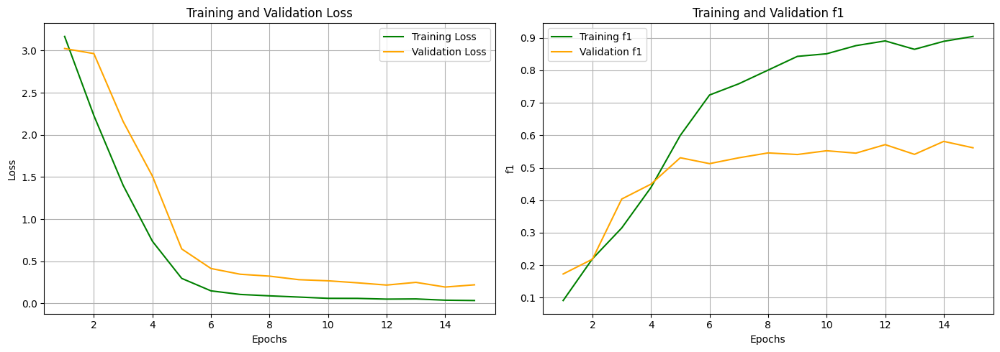

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - f1_score: 0.0812 - loss: 3.0982 - val_f1_score: 0.1420 - val_loss: 2.9826
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.1880 - loss: 3.1004 - val_f1_score: 0.3050 - val_loss: 2.7473
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - f1_score: 0.3446 - loss: 0.9485 - val_f1_score: 0.3650 - val_loss: 2.1762
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - f1_score: 0.3989 - loss: 0.7564 - val_f1_score: 0.4077 - val_loss: 1.6850
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - f1_score: 0.4451 - loss: 0.4339 - val_f1_score: 0.4937 - val_loss: 0.6763
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - f1_score: 0.5336 - loss: 0.2207 - val_f1_score: 0.5177 - val_loss: 0.4565
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - f1_score: 0.6629 - loss: 0.1295 - val_f1_score: 0.5268 - val_loss: 0.4173
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - f1_score: 0.6594 - loss: 0.0780 - val_f1_score: 0.57

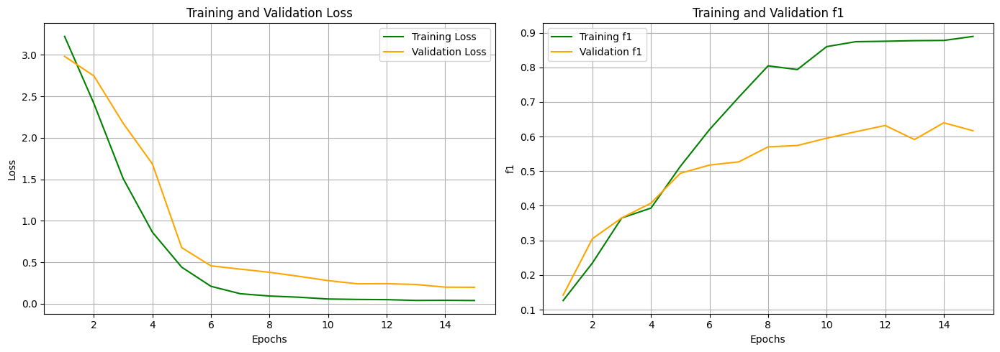

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - f1_score: 0.1164 - loss: 2.8135 - val_f1_score: 0.2963 - val_loss: 2.9861
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - f1_score: 0.2915 - loss: 1.6256 - val_f1_score: 0.3539 - val_loss: 2.7198
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - f1_score: 0.3590 - loss: 1.6538 - val_f1_score: 0.4587 - val_loss: 2.0120
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.4833 - loss: 0.3797 - val_f1_score: 0.5053 - val_loss: 1.2215
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - f1_score: 0.5101 - loss: 0.4280 - val_f1_score: 0.5093 - val_loss: 0.7202
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - f1_score: 0.6400 - loss: 0.1498 - val_f1_score: 0.5582 - val_loss: 0.3903
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - f1_score: 0.6966 - loss: 0.0774 - val_f1_score: 0.6168 - val_loss: 0.3012
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.6884 - loss: 0.0532 - val_f1_score: 0.60

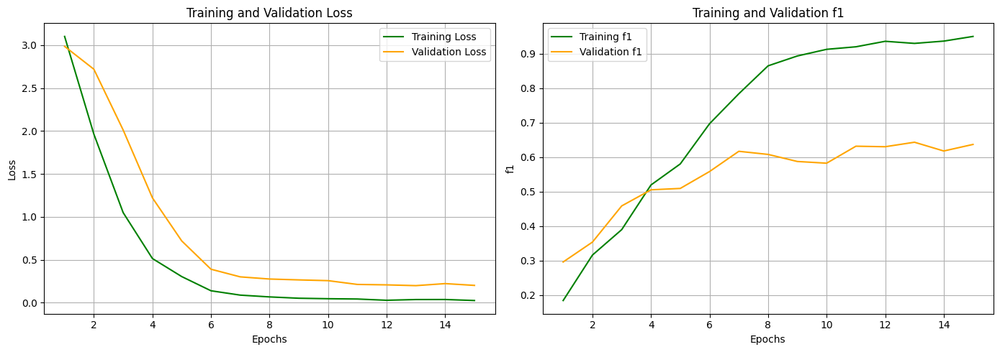

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - f1_score: 0.0844 - loss: 3.1726 - val_f1_score: 0.1351 - val_loss: 3.0479
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - f1_score: 0.2652 - loss: 3.3071 - val_f1_score: 0.4554 - val_loss: 2.6650
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - f1_score: 0.3996 - loss: 0.8171 - val_f1_score: 0.4512 - val_loss: 2.2303
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - f1_score: 0.4700 - loss: 0.5783 - val_f1_score: 0.5338 - val_loss: 1.2574
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.5214 - loss: 0.3950 - val_f1_score: 0.5423 - val_loss: 0.6373
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - f1_score: 0.6558 - loss: 0.1129 - val_f1_score: 0.6084 - val_loss: 0.3978
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - f1_score: 0.7097 - loss: 0.0981 - val_f1_score: 0.6134 - val_loss: 0.3286
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.6914 - loss: 0.0763 - val_f1_score: 0.600

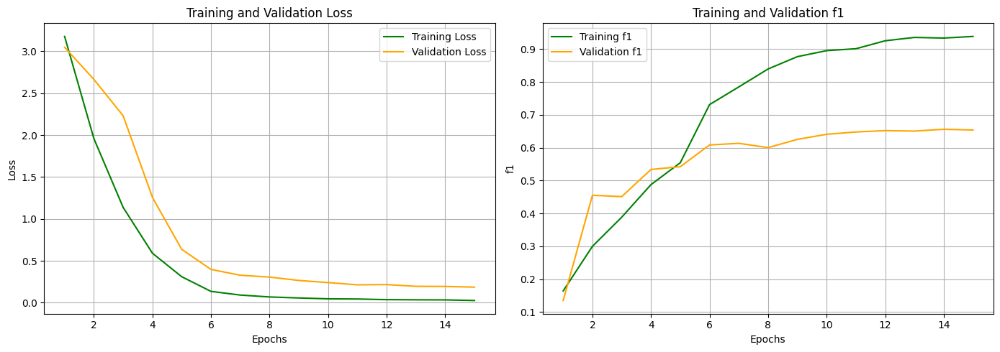

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - f1_score: 0.0898 - loss: 3.0283 - val_f1_score: 0.0489 - val_loss: 3.0432
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - f1_score: 0.1980 - loss: 2.9295 - val_f1_score: 0.3334 - val_loss: 2.8075
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 39ms/step - f1_score: 0.3425 - loss: 1.4715 - val_f1_score: 0.3958 - val_loss: 2.2621
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - f1_score: 0.4383 - loss: 0.4907 - val_f1_score: 0.4410 - val_loss: 1.6211
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - f1_score: 0.5009 - loss: 0.3376 - val_f1_score: 0.5003 - val_loss: 0.6799
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - f1_score: 0.5752 - loss: 0.2258 - val_f1_score: 0.5284 - val_loss: 0.5726
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - f1_score: 0.5843 - loss: 0.1180 - val_f1_score: 0.5674 - val_loss: 0.4060
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - f1_score: 0.6736 - loss: 0.0642 - val_f1_score: 0.584

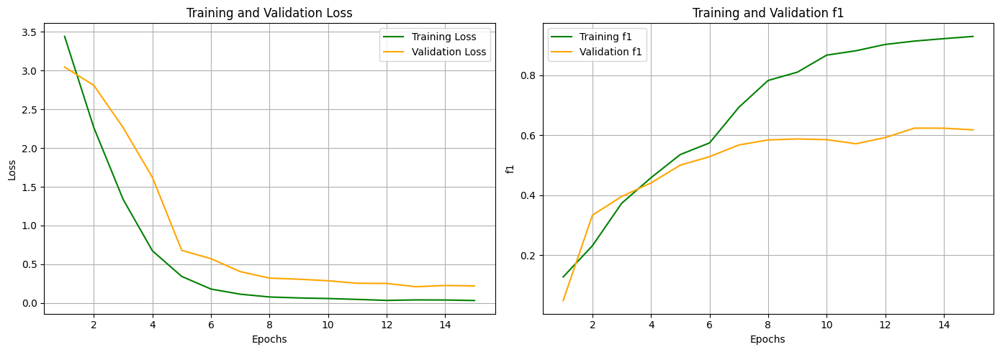

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 49ms/step - f1_score: 0.0591 - loss: 3.3748 - val_f1_score: 0.3420 - val_loss: 2.9892
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step - f1_score: 0.3668 - loss: 1.3809 - val_f1_score: 0.1943 - val_loss: 3.0341
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.3795 - loss: 1.1610 - val_f1_score: 0.4659 - val_loss: 2.1779
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 40ms/step - f1_score: 0.5073 - loss: 0.4311 - val_f1_score: 0.5160 - val_loss: 1.0488
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - f1_score: 0.6476 - loss: 0.1262 - val_f1_score: 0.5729 - val_loss: 0.4679
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - f1_score: 0.6694 - loss: 0.1012 - val_f1_score: 0.5877 - val_loss: 0.3392
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 41ms/step - f1_score: 0.7640 - loss: 0.0667 - val_f1_score: 0.6231 - val_loss: 0.2303
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 37ms/step - f1_score: 0.7390 - loss: 0.0643 - val_f1_score: 0.6

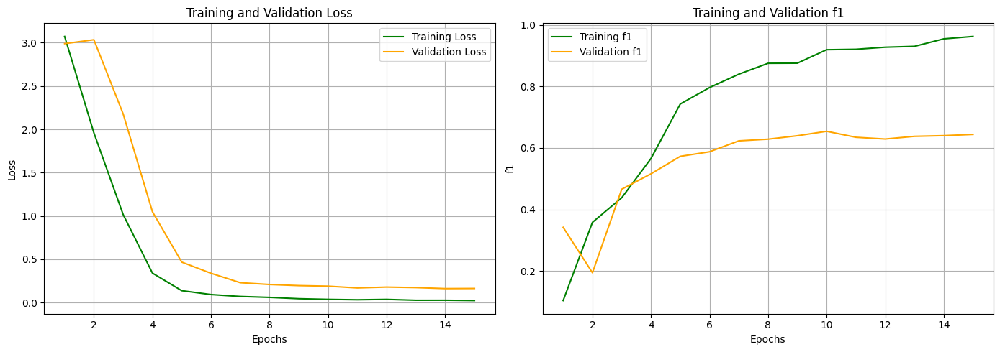

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 40ms/step - f1_score: 0.1126 - loss: 3.2912 - val_f1_score: 0.1871 - val_loss: 2.9881
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 46ms/step - f1_score: 0.2347 - loss: 2.9533 - val_f1_score: 0.3994 - val_loss: 2.7688
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - f1_score: 0.4095 - loss: 1.1370 - val_f1_score: 0.3040 - val_loss: 2.4686
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 48ms/step - f1_score: 0.3953 - loss: 1.0457 - val_f1_score: 0.5177 - val_loss: 1.4076
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.5364 - loss: 0.2612 - val_f1_score: 0.5243 - val_loss: 0.7568
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - f1_score: 0.6033 - loss: 0.2019 - val_f1_score: 0.5440 - val_loss: 0.4233
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - f1_score: 0.7714 - loss: 0.0836 - val_f1_score: 0.5540 - val_loss: 0.3070
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - f1_score: 0.7888 - loss: 0.0761 - val_f1_score: 0.57

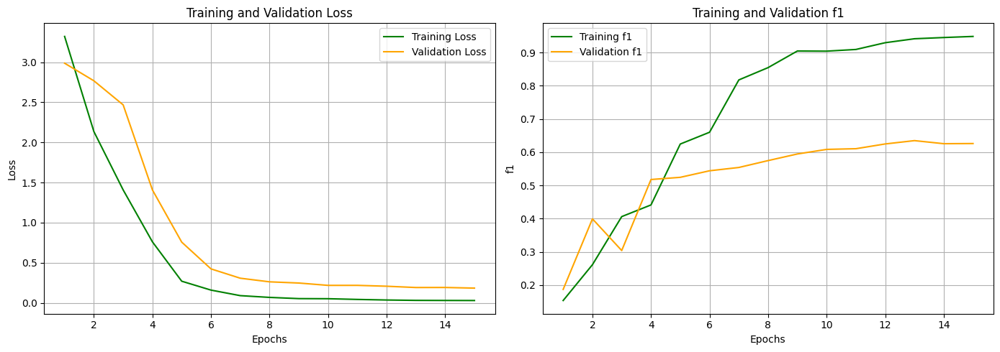

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - f1_score: 0.0401 - loss: 3.9140 - val_f1_score: 0.1389 - val_loss: 3.0269
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.2383 - loss: 1.9943 - val_f1_score: 0.3241 - val_loss: 2.8677
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - f1_score: 0.3842 - loss: 1.0557 - val_f1_score: 0.3827 - val_loss: 2.2574
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - f1_score: 0.4791 - loss: 0.6064 - val_f1_score: 0.4941 - val_loss: 1.2589
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.5687 - loss: 0.2424 - val_f1_score: 0.4937 - val_loss: 0.4994
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.6675 - loss: 0.1530 - val_f1_score: 0.5952 - val_loss: 0.3180
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 49ms/step - f1_score: 0.6782 - loss: 0.0804 - val_f1_score: 0.5760 - val_loss: 0.2900
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - f1_score: 0.7348 - loss: 0.0507 - val_f1_score: 0.55

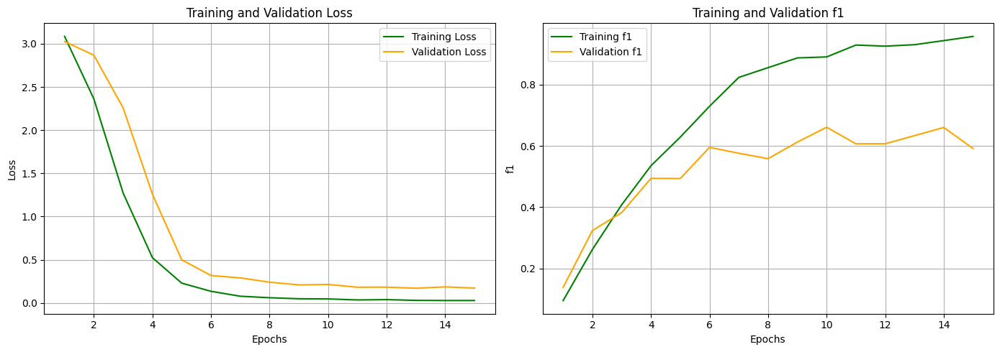

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - f1_score: 0.0843 - loss: 3.2374 - val_f1_score: 0.1633 - val_loss: 3.0101
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 47ms/step - f1_score: 0.2979 - loss: 2.4582 - val_f1_score: 0.3875 - val_loss: 2.6913
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - f1_score: 0.4538 - loss: 0.9627 - val_f1_score: 0.4823 - val_loss: 2.0134
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - f1_score: 0.5227 - loss: 0.3054 - val_f1_score: 0.4997 - val_loss: 1.1876
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 41ms/step - f1_score: 0.5529 - loss: 0.3147 - val_f1_score: 0.5354 - val_loss: 0.5798
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 47ms/step - f1_score: 0.6536 - loss: 0.0750 - val_f1_score: 0.5682 - val_loss: 0.3692
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - f1_score: 0.6790 - loss: 0.0526 - val_f1_score: 0.5931 - val_loss: 0.2971
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - f1_score: 0.7401 - loss: 0.0639 - val_f1_score: 0.59

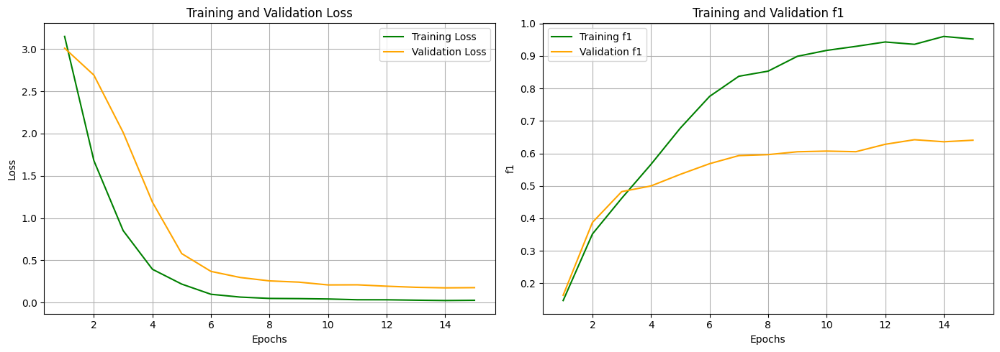

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 37ms/step - f1_score: 0.1110 - loss: 2.7338 - val_f1_score: 0.1736 - val_loss: 3.0037
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - f1_score: 0.3107 - loss: 2.3769 - val_f1_score: 0.3663 - val_loss: 2.7163
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 44ms/step - f1_score: 0.3962 - loss: 0.9218 - val_f1_score: 0.4394 - val_loss: 2.2398
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - f1_score: 0.4915 - loss: 0.4993 - val_f1_score: 0.5150 - val_loss: 1.3099
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 32ms/step - f1_score: 0.5580 - loss: 0.1794 - val_f1_score: 0.5082 - val_loss: 0.5599
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 45ms/step - f1_score: 0.6034 - loss: 0.1271 - val_f1_score: 0.5420 - val_loss: 0.3878
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - f1_score: 0.6914 - loss: 0.0704 - val_f1_score: 0.5656 - val_loss: 0.3059
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 6s 42ms/step - f1_score: 0.7441 - loss: 0.0479 - val_f1_score: 0.602

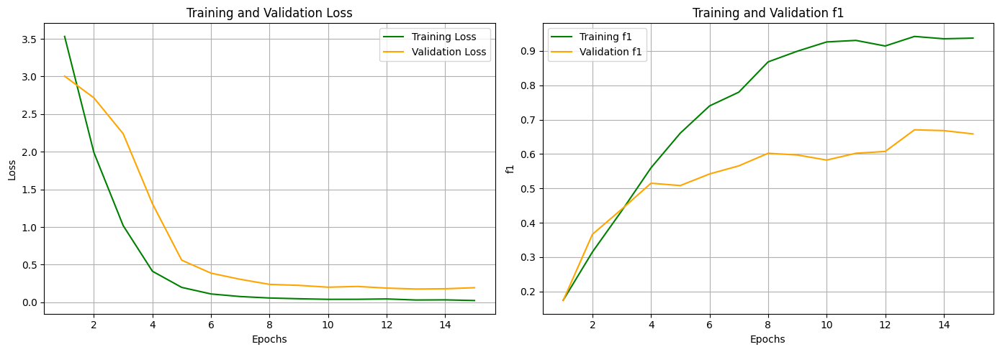

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 17s 72ms/step - f1_score: 0.0767 - loss: 3.3453 - val_f1_score: 0.3040 - val_loss: 3.0285
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - f1_score: 0.3321 - loss: 2.0832 - val_f1_score: 0.4281 - val_loss: 2.7459
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 71ms/step - f1_score: 0.4391 - loss: 1.1776 - val_f1_score: 0.3702 - val_loss: 2.3432
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - f1_score: 0.5076 - loss: 0.3844 - val_f1_score: 0.5562 - val_loss: 1.1042
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - f1_score: 0.6143 - loss: 0.1130 - val_f1_score: 0.5859 - val_loss: 0.4803
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.6943 - loss: 0.0722 - val_f1_score: 0.6110 - val_loss: 0.2737
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.6779 - loss: 0.0564 - val_f1_score: 0.5978 - val_loss: 0.2652
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - f1_score: 0.7429 - loss: 0.0522 - val_f1_score:

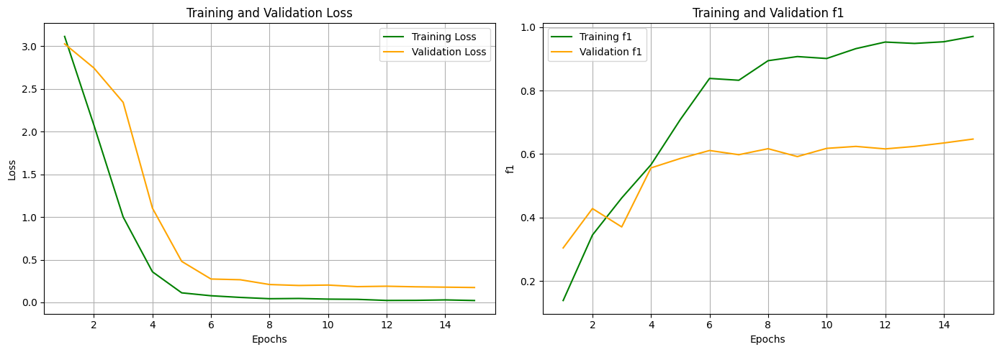

29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - f1_score: 0.1011 - loss: 3.2381 - val_f1_score: 0.2542 - val_loss: 3.0129
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.3553 - loss: 1.8518 - val_f1_score: 0.3849 - val_loss: 2.7636
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 69ms/step - f1_score: 0.3971 - loss: 1.0137 - val_f1_score: 0.4346 - val_loss: 2.1746
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - f1_score: 0.4739 - loss: 0.4299 - val_f1_score: 0.5194 - val_loss: 1.4212
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 68ms/step - f1_score: 0.5330 - loss: 0.2223 - val_f1_score: 0.5247 - val_loss: 0.6688
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 61ms/step - f1_score: 0.6627 - loss: 0.1066 - val_f1_score: 0.5600 - val_loss: 0.3154
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.6541 - loss: 0.0496 - val_f1_score: 0.5704 - val_loss: 0.2888
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - f1_score: 0.7839 - loss: 0.0460 - val_f1_score: 0

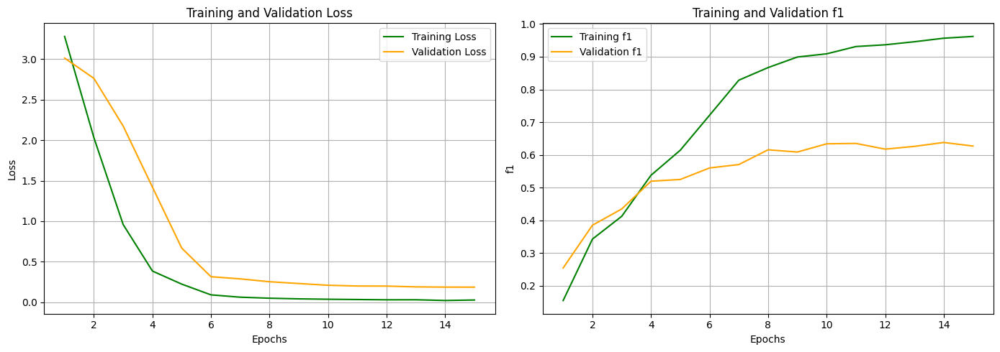

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - f1_score: 0.0716 - loss: 3.9275 - val_f1_score: 0.2022 - val_loss: 2.9999
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.2973 - loss: 2.3746 - val_f1_score: 0.4046 - val_loss: 2.6564
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - f1_score: 0.4429 - loss: 1.0509 - val_f1_score: 0.4654 - val_loss: 2.2010
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - f1_score: 0.5485 - loss: 0.3809 - val_f1_score: 0.5278 - val_loss: 1.2055
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - f1_score: 0.6532 - loss: 0.0774 - val_f1_score: 0.5879 - val_loss: 0.4259
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 70ms/step - f1_score: 0.6859 - loss: 0.0880 - val_f1_score: 0.5777 - val_loss: 0.2974
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.8230 - loss: 0.0533 - val_f1_score: 0.6171 - val_loss: 0.2477
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.7593 - loss: 0.0360 - val_f1_score: 

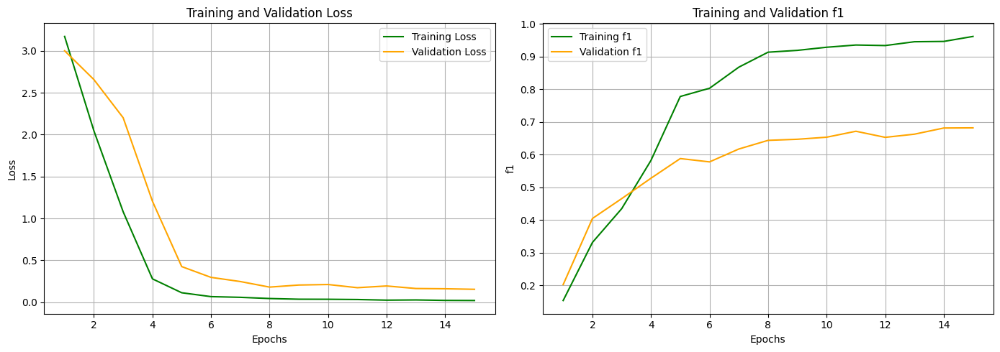

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 14s 78ms/step - f1_score: 0.1005 - loss: 3.2223 - val_f1_score: 0.2950 - val_loss: 3.0348
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.2956 - loss: 2.0520 - val_f1_score: 0.3840 - val_loss: 2.8532
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - f1_score: 0.4457 - loss: 1.2860 - val_f1_score: 0.4859 - val_loss: 2.2208
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - f1_score: 0.5262 - loss: 0.4187 - val_f1_score: 0.5819 - val_loss: 1.2209
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step - f1_score: 0.6945 - loss: 0.1132 - val_f1_score: 0.6534 - val_loss: 0.4661
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.7184 - loss: 0.0854 - val_f1_score: 0.6483 - val_loss: 0.2724
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step - f1_score: 0.7289 - loss: 0.0490 - val_f1_score: 0.6416 - val_loss: 0.2146
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.7415 - loss: 0.0297 - val_f1_score: 

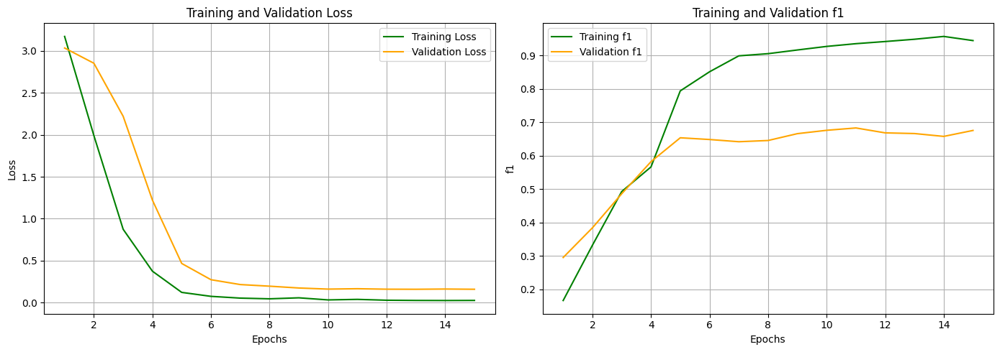

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 17s 68ms/step - f1_score: 0.0837 - loss: 3.3014 - val_f1_score: 0.2331 - val_loss: 3.0318
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step - f1_score: 0.2779 - loss: 2.2582 - val_f1_score: 0.4145 - val_loss: 2.8050
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - f1_score: 0.3909 - loss: 1.2440 - val_f1_score: 0.4292 - val_loss: 2.2606
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 77ms/step - f1_score: 0.4725 - loss: 0.5770 - val_f1_score: 0.5304 - val_loss: 1.1405
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.6377 - loss: 0.1852 - val_f1_score: 0.5749 - val_loss: 0.5348
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 76ms/step - f1_score: 0.6878 - loss: 0.0703 - val_f1_score: 0.5991 - val_loss: 0.2737
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - f1_score: 0.7897 - loss: 0.0496 - val_f1_score: 0.6038 - val_loss: 0.2701
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step - f1_score: 0.7646 - loss: 0.0432 - val_f1_score: 

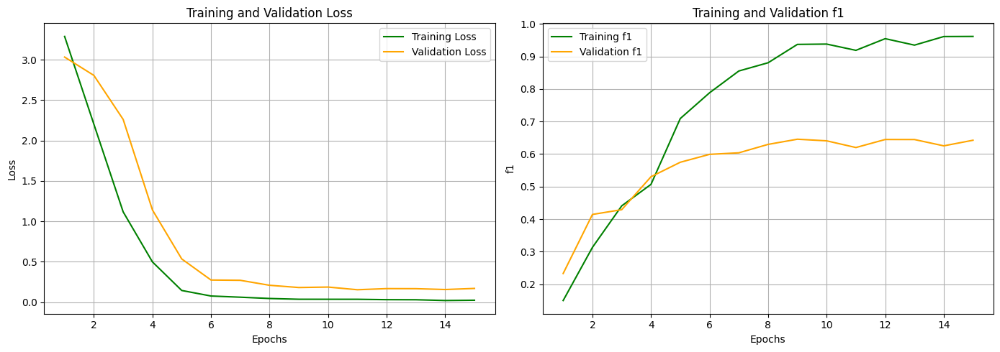

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


In [117]:
gru_layers_experiments = [
    [{'units': 32, 'return_sequences': True}],
    [{'units': 64, 'return_sequences': True}],
    [{'units': 128, 'return_sequences': True}]
]

# Ejecutar los experimentos
results = []

for gru_config in gru_layers_experiments:
    mean_f1, std_f1, mean_acc, std_acc, history = calculate_metrics(CNN=False,architecture='GRU', layer_configs=gru_config,epochs=15)
    results.append((mean_f1, std_f1, mean_acc, std_acc, history, conv_config))

Experiment 1 Macro avg F1 mean:  0.7727414344264817
Experiment 1 Macro avg F1 std:  0.043276278897960006
Experiment 1 Accuracy mean:  0.9537777777777778
Experiment 1 Accuracy std:  0.0061503788902657845
Experiment 2 Macro avg F1 mean:  0.818062989583099
Experiment 2 Macro avg F1 std:  0.029485573542095446
Experiment 2 Accuracy mean:  0.9642222222222223
Experiment 2 Accuracy std:  0.002036700308869256
Experiment 3 Macro avg F1 mean:  0.8473261742532218
Experiment 3 Macro avg F1 std:  0.026780424766379905
Experiment 3 Accuracy mean:  0.9662222222222223
Experiment 3 Accuracy std:  0.00382325567424116


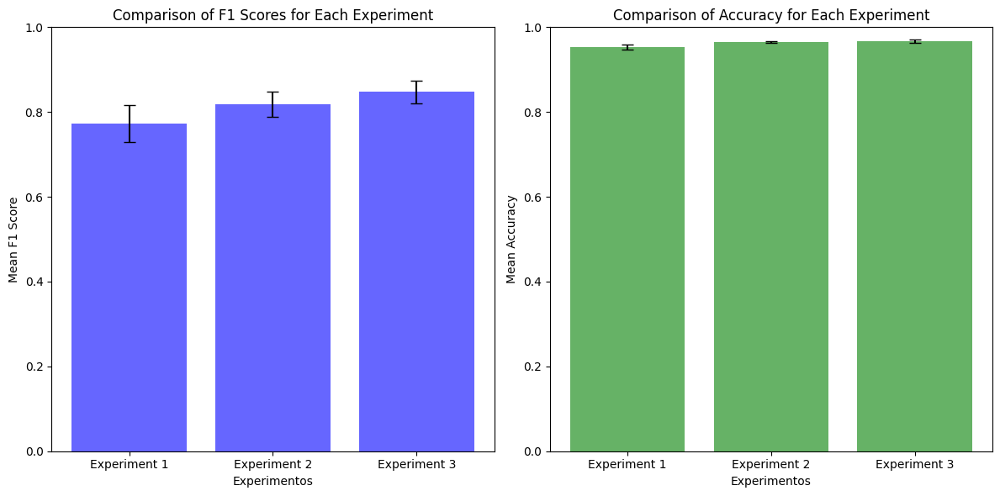

In [118]:
plot_experiment_metrics(results)

### Regularització

In [30]:
from keras.utils import set_random_seed
set_random_seed(1)

# Preprocesar datos
prep_st = TextProcessor(train_sentences, val_sentences, test_sentences, train_labels, val_labels, test_labels, num_words=vocab_size, tech='stemming')
prep_st.process_all()

def regul(model):
    vocab_size=600
    embedding_dim=100
    #num_executions=5
    batch_size=32
    epochs=15

    history_dict = {'train_loss': [], 'val_loss': [], 'train_f1': [], 'val_f1': []}

    vocab_size = prep_st.num_words + 1

    class_weights = compute_class_weight(
        class_weight='balanced',
        classes=np.unique(prep_st.train_labels),
        y=prep_st.train_labels
    )
    class_weight_dict = dict(enumerate(class_weights))

    # Compilar y entrenar el modelo
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(average='macro')])
    history = model.fit(
        prep_st.train_pad_sequences, prep_st.train_encoded_labels,
        batch_size=batch_size, epochs=epochs,
        validation_data=(prep_st.val_pad_sequences, prep_st.val_encoded_labels),
        verbose=1, class_weight=class_weight_dict
    )

    # Guardar historia de entrenamiento
    history_dict['train_loss'].append(history.history['loss'])
    history_dict['val_loss'].append(history.history['val_loss'])
    history_dict['train_f1'].append(history.history['f1_score'])  # F1 macro en entrenamiento
    history_dict['val_f1'].append(history.history['val_f1_score'])  # F1 macro en validación
    plot_curves(history)

    # Predicción y cálculo de métricas
    probs = model.predict(prep_st.val_pad_sequences)
    _predicted_labels = np.argmax(probs, axis=1)
    predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)
    macro_f1 = f1_score(val_labels, predicted_labels, average='macro')
    accuracy = accuracy_score(val_labels, predicted_labels)

    return macro_f1, accuracy, history_dict



#### Dropout Embedding

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0433 - loss: 3.7634 - val_f1_score: 0.3050 - val_loss: 2.9910
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.2523 - loss: 3.0412 - val_f1_score: 0.4009 - val_loss: 2.7760
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.3463 - loss: 1.9759 - val_f1_score: 0.4607 - val_loss: 2.3082
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.4214 - loss: 1.3910 - val_f1_score: 0.4953 - val_loss: 1.5019
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - f1_score: 0.5092 - loss: 0.8144 - val_f1_score: 0.5457 - val_loss: 0.7391
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.6108 - loss: 0.1979 - val_f1_score: 0.5921 - val_loss: 0.4261
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.7384 - loss: 0.1170 - val_f1_score: 0.5798 - val_loss: 0.3285
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.7608 - loss: 0.0823 - val_f1_score: 0.6198 - va

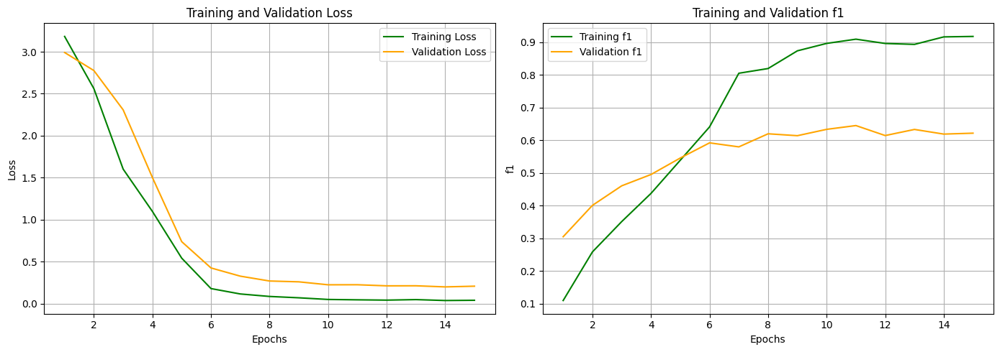

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


In [77]:
set_random_seed(1)
# Construcción del modelo
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))
model.add(Dropout(0.3))
model.add(GRU(128, return_sequences=True))

model.add(BatchNormalization())
model.add(GlobalMaxPooling1D())
# Capas densas finales
model.add(Dense(128, activation='relu'))
model.add(Dense(num_labels, activation='softmax'))


macro_f1, accuracy, history_dict = regul(model)

In [78]:
print('macro avg F1 score: ', macro_f1)
print('accuracy: ',accuracy)

macro avg F1 score:  0.8045555516891321
accuracy:  0.9622222222222222


#### Dropout Embedding + GRU

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - f1_score: 0.0362 - loss: 3.9393 - val_f1_score: 0.2207 - val_loss: 3.0395
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - f1_score: 0.1932 - loss: 3.0892 - val_f1_score: 0.3901 - val_loss: 2.8998
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - f1_score: 0.3297 - loss: 2.0392 - val_f1_score: 0.4723 - val_loss: 2.5176
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.4127 - loss: 0.9684 - val_f1_score: 0.4642 - val_loss: 1.8287
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.5268 - loss: 0.5204 - val_f1_score: 0.5533 - val_loss: 0.8894
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.5916 - loss: 0.2240 - val_f1_score: 0.5878 - val_loss: 0.5918
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.6745 - loss: 0.1531 - val_f1_score: 0.5951 - val_loss: 0.3706
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.5901 - loss: 0.2903 - val_f1_score: 0.6088 - va

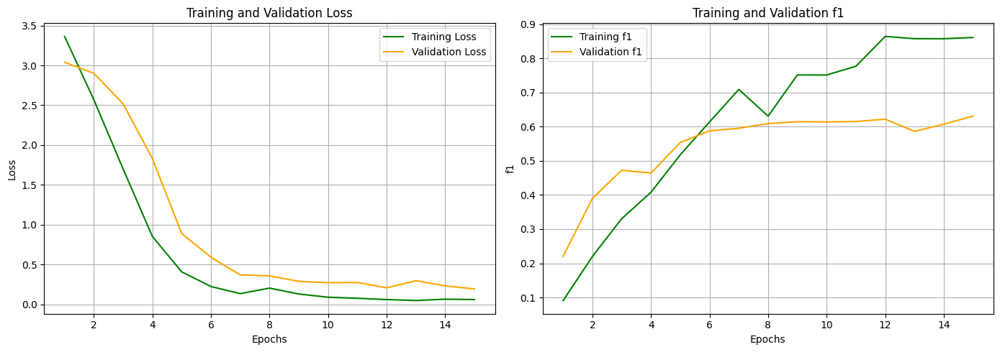

29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


In [62]:
set_random_seed(1)
# Construcción del modelo
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))
model.add(Dropout(0.3))
model.add(GRU(128, return_sequences=True))
model.add(BatchNormalization())
model.add(Dropout(0.3))
model.add(GlobalMaxPooling1D())
# Capas densas finales
model.add(Dense(128, activation='relu'))
model.add(Dense(num_labels, activation='softmax'))


macro_f1, accuracy, history_dict = regul(model)

In [63]:
print('macro avg F1 score: ', macro_f1)
print('accuracy: ',accuracy)

macro avg F1 score:  0.7306016681951345
accuracy:  0.9622222222222222


#### Dropout Embedding + Dense

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - f1_score: 0.0252 - loss: 3.9873 - val_f1_score: 0.1766 - val_loss: 3.0411
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - f1_score: 0.1341 - loss: 3.5659 - val_f1_score: 0.4333 - val_loss: 2.8670
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2275 - loss: 2.6844 - val_f1_score: 0.3845 - val_loss: 2.5333
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.2790 - loss: 2.3463 - val_f1_score: 0.4316 - val_loss: 2.0694
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - f1_score: 0.3976 - loss: 1.3643 - val_f1_score: 0.4640 - val_loss: 1.2925
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - f1_score: 0.4320 - loss: 0.7150 - val_f1_score: 0.4945 - val_loss: 1.1164
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - f1_score: 0.4214 - loss: 0.5510 - val_f1_score: 0.5048 - val_loss: 0.7548
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - f1_score: 0.4245 - loss: 0.5492 - val_f1_score: 0.5824 - v

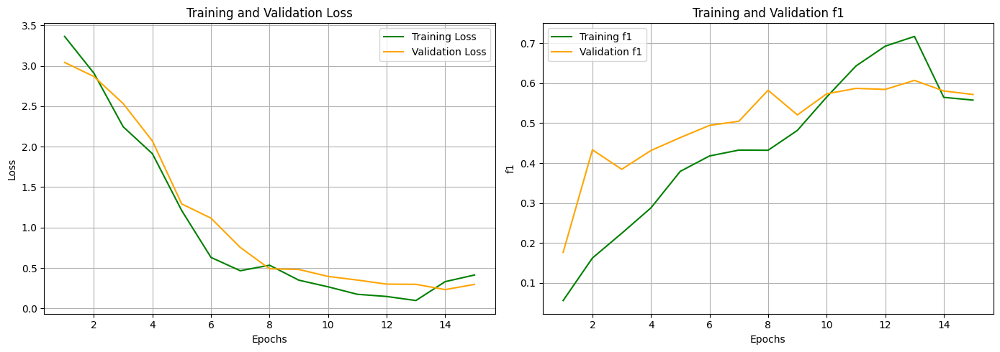

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


In [64]:
set_random_seed(1)
# Construcción del modelo
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))
model.add(Dropout(0.3))

model.add(GRU(128, return_sequences=True))
model.add(BatchNormalization())
#model.add(Dropout(0.3))

model.add(GlobalMaxPooling1D())
# Capas densas finales
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.3))

model.add(Dense(num_labels, activation='softmax'))


macro_f1, accuracy, history_dict = regul(model)

In [65]:
print('macro avg F1 score: ', macro_f1)
print('accuracy: ',accuracy)

macro avg F1 score:  0.6621598170540436
accuracy:  0.9266666666666666


#### Dropout(0.2) Embedding + Dense

Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


128/128 ━━━━━━━━━━━━━━━━━━━━ 10s 57ms/step - f1_score: 0.0348 - loss: 3.8464 - val_f1_score: 0.2237 - val_loss: 3.0198
Epoch 2/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 5s 39ms/step - f1_score: 0.1877 - loss: 3.2942 - val_f1_score: 0.3560 - val_loss: 2.9078
Epoch 3/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - f1_score: 0.2976 - loss: 2.1939 - val_f1_score: 0.3702 - val_loss: 2.5142
Epoch 4/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step - f1_score: 0.3242 - loss: 1.9330 - val_f1_score: 0.4022 - val_loss: 1.9469
Epoch 5/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 16s 108ms/step - f1_score: 0.3766 - loss: 1.1844 - val_f1_score: 0.4950 - val_loss: 1.1660
Epoch 6/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 16s 78ms/step - f1_score: 0.4186 - loss: 0.7834 - val_f1_score: 0.5005 - val_loss: 0.7899
Epoch 7/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 11s 86ms/step - f1_score: 0.5654 - loss: 0.2603 - val_f1_score: 0.5583 - val_loss: 0.4419
Epoch 8/15
128/128 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - f1_score: 0.6637 - loss: 0.1708 - val_f1_score:

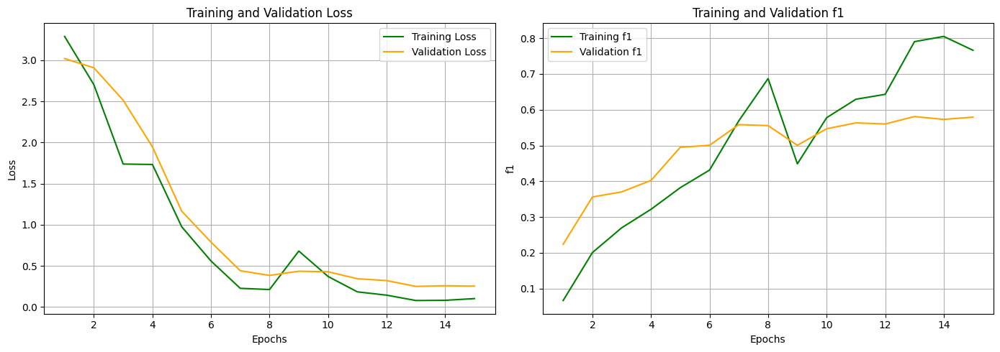

29/29 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step


In [31]:
set_random_seed(1)
# Construcción del modelo
model = Sequential()
model.add(Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_length=prep_st.max_sequence_length))
model.add(Dropout(0.2))

model.add(GRU(128, return_sequences=True))
model.add(BatchNormalization())
#model.add(Dropout(0.2))

model.add(GlobalMaxPooling1D())
# Capas densas finales
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(num_labels, activation='softmax'))


macro_f1, accuracy, history_dict = regul(model)

In [32]:
print('macro avg F1 score: ', macro_f1)
print('accuracy: ',accuracy)

macro avg F1 score:  0.7496381422763716
accuracy:  0.9366666666666666


## Aplicació del model en el conjunt de test

In [33]:
probs = model.predict(prep_st.test_pad_sequences)
_predicted_labels = np.argmax(probs, axis=1)
predicted_labels = prep_st.label_encoder.inverse_transform(_predicted_labels)

# Informe classificació
macro_f1 = f1_score(test_labels, predicted_labels, average='macro')
print('macro average f1 score: ',macro_f1)

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
macro average f1 score:  0.7023528860690847


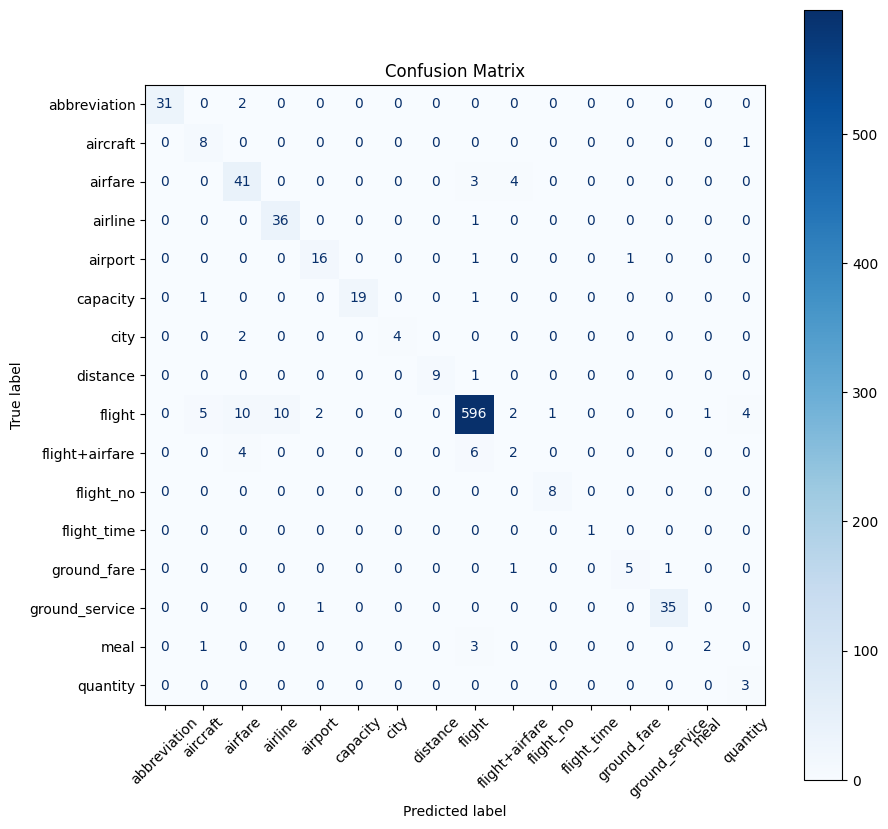

In [35]:
test_classes = sorted(set(prep_st.test_labels))
# Generar la matriu de confusió
cm = confusion_matrix(prep_st.test_labels, predicted_labels, labels=test_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_classes)

# Mostrar la matriu de confusió
fig, ax = plt.subplots(figsize=(10, 10))  # Ajusta el tamany del gràfic
disp.plot(cmap="Blues", ax=ax)
plt.title("Confusion Matrix")
plt.xticks(rotation=45)
plt.show()


<h1><a name="section-four"> 4. Lliurable </a></h1>

Heu d'entregar un document PDF de com a **màxim 10 pàgines** que incloga els resultats de tots els exercicis així com una explicació de cadascun dels resultats i de la modificació que heu fet. L'estructura del document és:

1. Introducció.
2. Experiments i Resultats (amb raonament).
3. Conclusions.

No cal que afegiu el vostre codi al document, podeu entregar el *notebook* juntament amb el document.

 ---